# Introduction


* Line that needs changing so that anyone can run this notebook, is the line importing the data. Simply change to respective location

* Model specifications and computations for epistemic and aleatoric uncertainty follow code from [this notebook](https://colab.research.google.com/github/onefishy/am207_fall19_projects/blob/master/what_uncertainties/what_uncertainties_3/cheruvuria_136145_9127626_Final_Project_Submission.ipynb#scrollTo=Xro86iRBavG_) 


# Preparation

In [2]:
from __future__ import print_function

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("ggplot")
from matplotlib.pyplot import imshow
import tqdm
%matplotlib inline

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Input, Dropout, Flatten, Activation
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import Callback
import tensorflow_probability as tfp
distributions = tfp.distributions
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, r2_score
from sklearn.metrics import accuracy_score, mean_squared_error, brier_score_loss
from sklearn.calibration import calibration_curve
from sklearn.datasets import make_classification
from itertools import product
from tensorflow.keras.regularizers import l2

PLEASE SPECIFY THE FILEPATH WHERE THIS WORK IS SAVED BELOW

In [ ]:
filepath = 0

Load data and construct train, val, test split

In [3]:
from sklearn.model_selection import train_test_split
def get_mnist_data():
    df_mnist = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/data/mnist.csv', index_col=[0])
    y_mnist_label = df_mnist["label"]
    X_mnist = df_mnist.iloc[:, 1:]

    random_state = 10

    (X_mnist_train_full, X_mnist_test, 
    y_mnist_train_full, y_mnist_test) = train_test_split(X_mnist, 
                                                        y_mnist_label,
                                                        test_size=0.2,
                                                        random_state=random_state)

    (X_mnist_train, X_mnist_val, 
    y_mnist_train, y_mnist_val) = train_test_split(X_mnist_train_full, 
                                                    y_mnist_train_full,
                                                    test_size=0.25,
                                                    random_state=random_state)

    return (df_mnist, y_mnist_label, X_mnist,
            X_mnist_test, y_mnist_test,
            X_mnist_train, y_mnist_train,
            X_mnist_val, y_mnist_val)



In [4]:
(df_mnist, y_mnist_label, X_mnist,
            X_mnist_test, y_mnist_test,
            X_mnist_train, y_mnist_train,
            X_mnist_val, y_mnist_val) = get_mnist_data()

# Data Exploration

size of data set

In [ ]:
df_mnist.shape[0] 

17280

Note that this subset of the MNIST dataset only contains digits 0,1,7,8

In [ ]:
y_mnist_label.unique()

array([1, 0, 7, 8])

## Balanced classes

[4132, 4684, 4401, 4063]


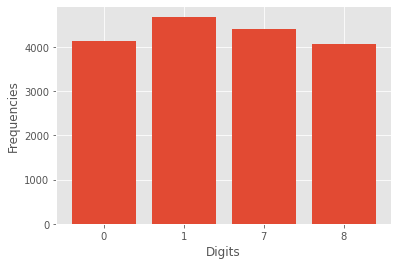

In [ ]:
num_digits = []
for i in np.unique(y_mnist_label):
    num_digits.append(sum(y_mnist_label==i))
print(num_digits)

fig, ax = plt.subplots() 
# ax.bar(np.unique(y_mnist_label), num_digits)
ax.bar(np.arange(0, 4, 1), num_digits)
ax.set_xlabel("Digits")
ax.set_ylabel("Frequencies")
plt.xticks(np.arange(0,4,1), np.unique(y_mnist_label))
plt.show()

## TSNE

See [this section](#cell-id) at the end of the notebook, where TSNE is used to visualize LOF outliers as well as samples with highest uncertainties. Below, is a scatter function (based on code from DME labs) to visualise TSNE embeddings.

In [ ]:
import seaborn as sns
def scatter_2d_label_LOF(X_2d, y, X_scores, uncertainty, descr,
                         ax=None, s=2, alpha=0.5, lw=2):
    """Visualise a 2D embedding with corresponding labels.
    
    X_2d : ndarray, shape (n_samples,2)
        Low-dimensional feature representation.
    
    y : ndarray, shape (n_samples,)
        Labels corresponding to the entries in X_2d.
        
    X_scores : scores from LOF fit_predict
        
    ax : matplotlib axes.Axes 
         axes to plot on
         
    s : float
        Marker size for scatter plot.
    
    alpha : float
        Transparency for scatter plot.
        
    lw : float
        Linewidth for scatter plot.
    """
    
    targets = np.unique(y)  # extract unique labels
    colors = sns.color_palette(palette='bright', n_colors=targets.size)
    
    if ax is None:
        fig, ax = plt.subplots()
        
    # scatter plot    
    for color, target in zip(colors, targets):
        ax.scatter(X_2d[y == target, 0], X_2d[y == target, 1], 
                   color=color, label=target, s=s, alpha=alpha, lw=lw)
        
        radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())

        ax.scatter(X_2d[y == target, 0], X_2d[y == target, 1], 
                     edgecolors=color, label='Outlier scores', 
                     s=1000 * radius[y == target], 
                     alpha=alpha, lw=lw, facecolors='none')
        
    ax.scatter(X_2d[uncertainty, 0], X_2d[uncertainty, 1], color="black", s=10,
               label=descr)
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    # add legend
    ax.legend(loc='center left', bbox_to_anchor=[1.01, 0.5], scatterpoints=3, 
              frameon=False); # Add a legend outside the plot at specified point
    
    return ax

In [32]:
def scatter_2d_label_LOF_with_highest(X_2d, y, X_scores, uncertainty, 
                                      highest_uncertainty, descr, 
                                      descr_2, ax=None, s=2, alpha=0.5, lw=2):
    """
    2nd version of scatter plot to highlight sample with highest uncertainty
    """
    
    targets = np.unique(y)  # extract unique labels
    colors = sns.color_palette(palette='bright', n_colors=targets.size)
    
    if ax is None:
        fig, ax = plt.subplots()
        
    # scatter plot    
    for color, target in zip(colors, targets):
        ax.scatter(X_2d[y == target, 0], X_2d[y == target, 1], 
                   color=color, label=target, s=s, alpha=alpha, lw=lw)
        
        radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())

        ax.scatter(X_2d[y == target, 0], X_2d[y == target, 1], 
                     edgecolors=color, label='Outlier scores', 
                     s=1000 * radius[y == target], 
                     alpha=alpha, lw=lw, facecolors='none')
        
    ax.scatter(X_2d[uncertainty, 0], X_2d[uncertainty, 1], color="black", s=10,
               label=descr)
    ax.scatter(X_2d[highest_uncertainty, 0], X_2d[highest_uncertainty, 1], 
               color="black", s=200, label=descr_2)
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    # add legend
    ax.legend(loc='center left', 
              bbox_to_anchor=[1.01, 0.5], 
              scatterpoints=1, 
              frameon=False); # Add a legend outside the plot at specified point
    
    return ax


## Reshaping labels

Next, reshape the images to 28x28 pixels and transform labels into one-hot encoded categories

In [5]:
X_mnist = X_mnist.values.reshape(-1,28,28,1)
X_mnist_test = X_mnist_test.values.reshape(-1,28,28,1)
X_mnist_train = X_mnist_train.values.reshape(-1,28,28,1)
X_mnist_val = X_mnist_val.values.reshape(-1,28,28,1)

# keeping original labels
# converting labels into one-hot encoding
# [1,0,0,0]=class 0
# [0,1,0,0]=class 1
# [0,0,1,0]=class 7
# [0,0,0,1]=class 8

y_mnist_label_original = y_mnist_label
y_mnist_label = tf.keras.utils.to_categorical(y_mnist_label, num_classes=10)
y_mnist_label = y_mnist_label[:,[0,1,7,8]]

y_mnist_test_original = y_mnist_test
y_mnist_test = tf.keras.utils.to_categorical(y_mnist_test, num_classes=10)
y_mnist_test = y_mnist_test[:,[0,1,7,8]]

y_mnist_train_original = y_mnist_train
y_mnist_train = tf.keras.utils.to_categorical(y_mnist_train, num_classes=10)
y_mnist_train = y_mnist_train[:,[0,1,7,8]]

y_mnist_val_original = y_mnist_val
y_mnist_val = tf.keras.utils.to_categorical(y_mnist_val, num_classes=10)
y_mnist_val = y_mnist_val[:,[0,1,7,8]]

In [6]:
# so that's how the labels look like now
y_mnist_label

array([[0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       ...,
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]], dtype=float32)

quick check that all shapes are as expected

In [ ]:
print(f"shape of X_mist: {X_mnist.shape}")
print(f"shape of y_mnist_label: {y_mnist_label.shape}")

print(f"shape of X_mnist_test: {X_mnist_test.shape}")
print(f"shape of y_mnist_test: {y_mnist_test.shape}")

print(f"shape of X_mnist_val: {X_mnist_val.shape}")
print(f"shape of y_mnist_val: {y_mnist_val.shape}")

print(f"shape of X_mnist_train: {X_mnist_train.shape}")
print(f"shape of y_mnist_train: {y_mnist_train.shape}")



shape of X_mist: (17280, 28, 28, 1)
shape of y_mnist_label: (17280, 4)
shape of X_mnist_test: (3456, 28, 28, 1)
shape of y_mnist_test: (3456, 4)
shape of X_mnist_val: (3456, 28, 28, 1)
shape of y_mnist_val: (3456, 4)
shape of X_mnist_train: (10368, 28, 28, 1)
shape of y_mnist_train: (10368, 4)


# Correct Class Converter

two helper functions which give correct class number given its one-hot encoding or given class label as 0,1,2,3 rather than 0,1,7,8

In [7]:
def correct_class(sample_idx, y_label):
    class_label = np.argmax(y_label[sample_idx])
    if class_label == 2:
        class_label = 7
    if class_label == 3:
        class_label = 8
    return class_label

def class_converter(idx):
    if idx == 0:
        res = 0
    if idx == 1:
        res = 1
    if idx == 2:
        res = 7
    if idx == 3:
        res = 8
    return res

In [ ]:
# example of how function works
idx = 123
print(correct_class(idx, y_mnist_val))
print(y_mnist_val[idx])
print(class_converter(2))

7
[0. 0. 1. 0.]
7


# Save function

Function which allows to save trained models

In [ ]:
"""def save_model(model, batch_size, n_epochs, descr, learning_rate, dropout=None):
    fp_first = '/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_trained_models'
    fp0 = "/model_" + descr
    fp1 = "_batchsize" + str(batch_size)
    fp2 = "_nepoch" + str(n_epochs)
    if dropout == None:
        fp3 = ""
    else:
        fp3 = '_dropout' + str(dropout*100)
    fp4 = '_learningrate' + str(learning_rate*1000)
    fp_last = ".h5"

    fp_full = fp_first + fp0 + fp1 + fp2 + fp3 + fp4 + fp_last

    model.save(fp_full)"""

# Loss function

Most important part here is ```bayesian_categorical_crossentropy``` as this is the loss function necessary to capture aleatoric uncertainty and allows for loss attenuation

In [8]:
def softmax(pred):
  return K.exp(pred - K.log(K.sum(K.exp(pred))))  # numerically stable softmax
  
def softmax_np(pred):
  return np.exp(pred - np.log(np.sum(np.exp(pred), axis=1)).reshape(pred.shape[0],1))  

def gaussian_softmax(ypred, dist, num_classes):
  def map_fn(i):
    std_samples = K.transpose(dist.sample(num_classes))
    # distorted_loss = softmax(ypred + std_samples)
    distorted_loss = tf.keras.activations.softmax(ypred + std_samples, axis=-1)
    return distorted_loss
  return map_fn

# aleatoric loss function 
def bayesian_categorical_crossentropy(T, num_classes):
  def bayesian_categorical_crossentropy_internal(ytrue, ypred_var):
    std = K.exp(0.5*ypred_var[:, num_classes:])[0] # add this 
    ypred = ypred_var[:, 0:num_classes]
    iterable = K.variable(np.ones(T))
    dist = distributions.Normal(loc=K.zeros_like(std), scale=std+1e-6)
    monte_carlo_results = K.map_fn(gaussian_softmax(ypred, dist, num_classes),
                                   iterable, name='monte_carlo_results')
    variance_loss = K.categorical_crossentropy(ytrue, K.mean(monte_carlo_results, axis=0))
    
    return variance_loss 

  return bayesian_categorical_crossentropy_internal

# Loss and accuracy plot function

Function to visualize loss and accuracy during a training run

In [9]:
def loss_accuracy_plot(fit_history):
  # Plot training & validation accuracy values
  plt.plot(fit_history.history['accuracy'])
  plt.plot(fit_history.history['val_accuracy'])
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  # Plot training & validation loss values
  plt.plot(fit_history.history['loss'])
  plt.plot(fit_history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

# Confusion matrix function

In [ ]:
# function from DME labs
import seaborn as sns

def plot_confusion_matrix(cm, class_labels=None):
    """Plots a confusion matrix using seaborn's heatmap function
    
    Columns and rows are labelled with the strings provided in class_labels.
    
    Parameters
    ----------
    cm: array-like
        contains the confusion matrix
        
    class_labels: array-like, optional
        contains the string labels
            
    """
    # check whether we have count data or not
    if issubclass(cm.dtype.type, np.integer):
        fmt = 'd'
    else:
        fmt = '.2f'
    
    if class_labels is not None:
        sns.heatmap(cm, cmap='viridis',xticklabels=class_labels, yticklabels=class_labels,\
                    annot=True, annot_kws={"fontsize":9},  fmt=fmt)  # controls the display of the numbers
    else:
        sns.heatmap(cm, annot=True, annot_kws={"fontsize":9},  fmt=fmt)
        
    plt.ylabel('True label', fontweight='bold')
    plt.xlabel('Predicted label', fontweight='bold')
    
    # you can change the appearance of the figure with lower-level matplotlib commands
    # here we rotate the labels on the x-axis
    plt.setp(plt.gca().get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Functions to calcuclate epistemic and aleatoric uncertainties

### Epistemic uncertainty

In [ ]:
# making 100 predictions for each sample of val/test set for each class
import tqdm
def make_predictions(model, n_pred=100, batch_size=100, val_data=X_mnist_test):
  predictions = []
  for i in tqdm.tqdm(range(n_pred)):
      y_p = model.predict(val_data, batch_size=batch_size)
      predictions.append(y_p)
  return predictions

In [ ]:
# calculate mean predictions, std, and epistemic uncertainty
def cal_epistemic(predictions):
  p = np.array(predictions)
  y_mean = p.mean(axis=0) # prediction mean of 100 predictions
  w = 1/np.sum(y_mean, axis=1).reshape(y_mean.shape[0],1)
  y_mean = (y_mean*w)
  y_std = p.std(axis=0, ddof=1)*w

  epi_1 = y_std.max(axis=1)
  epi_2 = y_std.mean(axis=1)
  epi_3 = -(p.mean(axis=0) * np.log(p.mean(axis=0))).sum(axis=1)
  return y_mean, y_std, [epi_1, epi_2, epi_3]

In [ ]:
# calculate mean ensemble prediction and accuracy
# note, no need to change to actual labels 0,1,7,8
def ensemble_pred(predictions, val_data=y_mnist_test):
  ensemble_pred = np.array(predictions).mean(axis=0).argmax(axis=1) # max mean pred
  ensemble_acc = accuracy_score(val_data.argmax(axis=1), ensemble_pred)
  print("MC-ensemble accuracy: {:.1%}".format(ensemble_acc))
  return ensemble_pred, ensemble_acc

In [ ]:
# Functions to print out the n images with highest/lowest uncertainties
def show_epistemic(epi, prediction, highest=True, n_epi=20,
                   x_data=X_mnist_test, y_data=y_mnist_test):
  if highest == True:
    epi_idx = epi.argsort()[::-1]
  if highest == False:
    epi_idx = epi.argsort()
  for idx in epi_idx[:n_epi]:
    plt.imshow(x_data[idx, :, :, 0], cmap='gist_gray')
    print("True label of the test sample {}: {}".format(idx, correct_class(idx, y_data), axis=-1))
    print(f"Predicted label of test sample {idx}: {class_converter(prediction[idx])}")
    print(f"Epistemic uncertainty: {epi[idx]:.4}")
    plt.show()

### Aleatoric uncertainty

In [ ]:
# function to calculate aleatoric uncertainty from outputed sigmas
def cal_aleatoric(model, test_data=X_mnist_test):
  output_alea = model(test_data)
  # predicted_classes = np.argmax(output_alea[:,:4], axis=-1)
  predicted_classes = np.argmax(tf.keras.activations.softmax(output_alea[:,:4]).numpy(), 
                                axis=-1)
  sigmas = np.exp(output_alea[:,4])
  return predicted_classes, sigmas

# function to plot n images with highest/lowest aleatoric uncertanty
def show_aleatoric(sigmas, prediction, highest=True, n_alea=20,
                   x_data=X_mnist_test, y_data=y_mnist_test):
    if highest == True:
      alea_idx = sigmas.argsort()[::-1]
    if highest == False:
      alea_idx = sigmas.argsort()
    for idx in alea_idx[:n_alea]:
      plt.imshow(x_data[idx, :, :, 0], cmap='gist_gray')
      print(f"True label of the test sample {idx}: {correct_class(idx, y_data)}")
      print(f"Predicted label of test sample {idx}: {class_converter(prediction[idx])}")
      print(f"Aleatoric uncertainty: {sigmas[idx]:.4}")
      plt.show()

# MODEL SPECIFICATION - CONVOLUTIONAL

In [10]:
def model_creator(act="relu", dropout_prob=0.25, 
                  loss=keras.losses.categorical_crossentropy, 
                  include_logvar=False,
                  learning_rate=0.001):
  """
  Create CNN model using Keras Functional API.
  Architecture taken from https://keras.io/examples/cifar10_cnn/ and modified
  """
  input_shape = (28, 28, 1)
  N =  input_shape[0]*input_shape[1]

  # L2 regularisation if dropout is employed to avoid predicting infinite
  # uncertainties
  reg = (1 - dropout_prob) / (2. * N) if dropout_prob > 0 else 0  

  inputs = Input(shape=input_shape)
  inter = Conv2D(64, (3, 3), padding='same',
                  kernel_regularizer=l2(reg))(inputs)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True)
  inter = Conv2D(64, (3, 3), kernel_regularizer=l2(reg))(inter)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True) # BEFORE maxpooling
  inter = MaxPooling2D(pool_size=(2, 2))(inter)
  
  inter = Flatten()(inter)
  inter = Dense(256, kernel_regularizer=l2(reg))(inter)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True)

  if include_logvar:
      # include variance and output logits rather than softmax
      outputs = Dense(num_classes+1, activation=None, kernel_regularizer=l2(reg))(inter) 
  else:
     outputs = Dense(num_classes, activation='softmax', kernel_regularizer=l2(reg))(inter) 
  
  model = Model(inputs, outputs)
  metrics = ['accuracy']
  model.compile(loss=loss,
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  metrics=metrics,
                  run_eagerly=True)
  return model

## Original model with NO dropout and NO log(sigma)

### Hyperparameter tuning

In [ ]:
"""def model_creator(filter, unit, act="relu", dropout_prob=0.25, 
                  loss=keras.losses.categorical_crossentropy, 
                  include_logvar=False,
                  learning_rate=0.001):
  """
  Create CNN model using Keras Functional API.
  Architecture taken from https://keras.io/examples/cifar10_cnn/ and modified
  """
  input_shape = (28, 28, 1)
  N =  input_shape[0]*input_shape[1]

  # L2 regularisation if dropout is employed to avoid predicting infinite
  # uncertainties
  reg = (1 - dropout_prob) / (2. * N) if dropout_prob > 0 else 0  

  inputs = Input(shape=input_shape)
  inter = Conv2D(filter[0], (3, 3), padding='same',
                  kernel_regularizer=l2(reg))(inputs)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True)
  inter = Conv2D(filter[1], (3, 3), kernel_regularizer=l2(reg))(inter)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True) # BEFORE maxpooling
  inter = MaxPooling2D(pool_size=(2, 2))(inter)
  
  inter = Flatten()(inter)
  inter = Dense(unit[0], kernel_regularizer=l2(reg))(inter)
  inter = Activation('relu')(inter)
  inter = Dropout(dropout_prob)(inter, training=True)

  if include_logvar:
      # include variance and output logits rather than softmax
      outputs = Dense(num_classes+1, activation=None, kernel_regularizer=l2(reg))(inter) 
  else:
     outputs = Dense(num_classes, activation='softmax', kernel_regularizer=l2(reg))(inter) 
  
  model = Model(inputs, outputs)
  metrics = ['accuracy']
  model.compile(loss=loss,
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  metrics=metrics,
                  run_eagerly=True)
  return model"""

In [ ]:
"""num_classes = 4
input_shape = (28, 28, 1)

epochs = 20
dropout_p = 0.0


batch_sizes = [64, 128, 256]
learning_rates = [0.01, 0.001]
filters = [[64, 64], [128, 128]]
units = [[128], [256]]"""


[64, 64] filter, [128] unit, 64 batch_size, 0.01 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 22ms/step - loss: 0.1484 - accuracy: 0.9594 - val_loss: 0.0494 - val_accuracy: 0.9852
Epoch 2/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0268 - accuracy: 0.9915 - val_loss: 0.0453 - val_accuracy: 0.9852
Epoch 3/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0211 - accuracy: 0.9932 - val_loss: 0.0200 - val_accuracy: 0.9939
Epoch 4/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0200 - accuracy: 0.9946 - val_loss: 0.0338 - val_accuracy: 0.9890
Epoch 5/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0076 - accuracy: 0.9973 - val_loss: 0.0240 - val_accuracy: 0.9936
Epoch 6/20
162/162 [==============================] - 3s 21ms/step - loss: 0.0146 - accuracy: 0.9958 - val_loss: 0.0351 - val_accuracy: 0.9910
Epoch 7/20
162/162 [==============================] - 4s 22ms/step - loss: 0.02

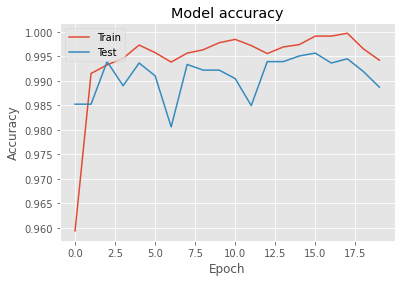

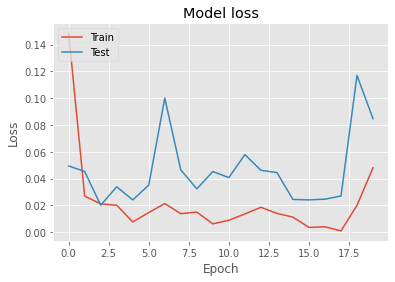

done with 0th training loop

[64, 64] filter, [256] unit, 64 batch_size, 0.01 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 22ms/step - loss: 0.1466 - accuracy: 0.9562 - val_loss: 0.0290 - val_accuracy: 0.9887
Epoch 2/20
162/162 [==============================] - 3s 21ms/step - loss: 0.0331 - accuracy: 0.9899 - val_loss: 0.0235 - val_accuracy: 0.9907
Epoch 3/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0148 - accuracy: 0.9947 - val_loss: 0.0284 - val_accuracy: 0.9922
Epoch 4/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0131 - accuracy: 0.9957 - val_loss: 0.0202 - val_accuracy: 0.9933
Epoch 5/20
162/162 [==============================] - 3s 21ms/step - loss: 0.0093 - accuracy: 0.9970 - val_loss: 0.0276 - val_accuracy: 0.9925
Epoch 6/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0134 - accuracy: 0.9962 - val_loss: 0.0269 - val_accuracy: 0.9916
Epoch 7/20
162/162 [==============================

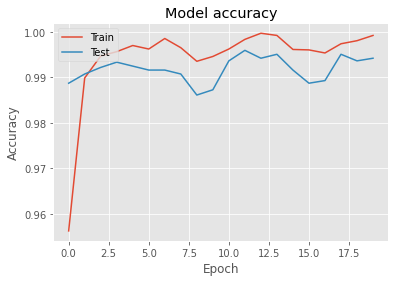

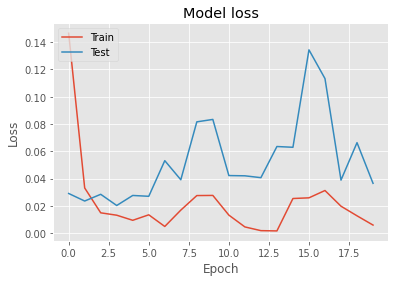

done with 1th training loop

[128, 128] filter, [128] unit, 64 batch_size, 0.01 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 23ms/step - loss: 0.1583 - accuracy: 0.9605 - val_loss: 0.0312 - val_accuracy: 0.9896
Epoch 2/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0228 - accuracy: 0.9920 - val_loss: 0.0382 - val_accuracy: 0.9873
Epoch 3/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0184 - accuracy: 0.9946 - val_loss: 0.0479 - val_accuracy: 0.9858
Epoch 4/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0151 - accuracy: 0.9960 - val_loss: 0.0287 - val_accuracy: 0.9925
Epoch 5/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0157 - accuracy: 0.9954 - val_loss: 0.0363 - val_accuracy: 0.9876
Epoch 6/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0127 - accuracy: 0.9959 - val_loss: 0.0457 - val_accuracy: 0.9899
Epoch 7/20
162/162 [============================

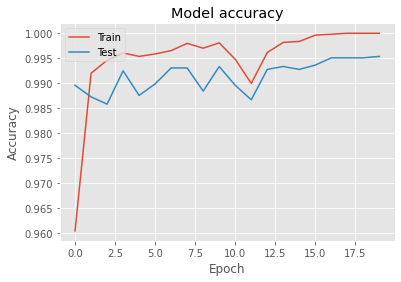

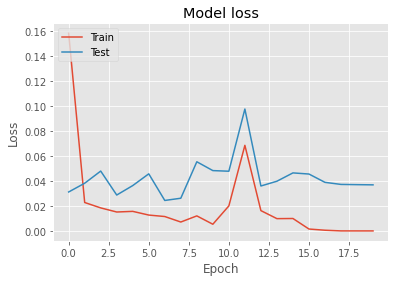

done with 2th training loop

[128, 128] filter, [256] unit, 64 batch_size, 0.01 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 24ms/step - loss: 0.1988 - accuracy: 0.9490 - val_loss: 0.0402 - val_accuracy: 0.9867
Epoch 2/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0336 - accuracy: 0.9896 - val_loss: 0.0453 - val_accuracy: 0.9841
Epoch 3/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0171 - accuracy: 0.9949 - val_loss: 0.0397 - val_accuracy: 0.9887
Epoch 4/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0168 - accuracy: 0.9937 - val_loss: 0.0251 - val_accuracy: 0.9925
Epoch 5/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0101 - accuracy: 0.9968 - val_loss: 0.0235 - val_accuracy: 0.9945
Epoch 6/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0199 - accuracy: 0.9948 - val_loss: 0.0473 - val_accuracy: 0.9893
Epoch 7/20
162/162 [============================

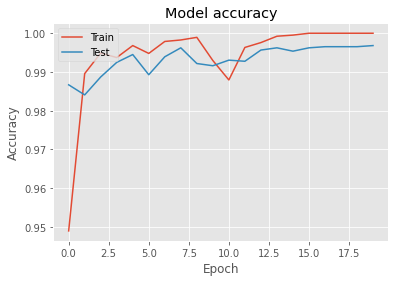

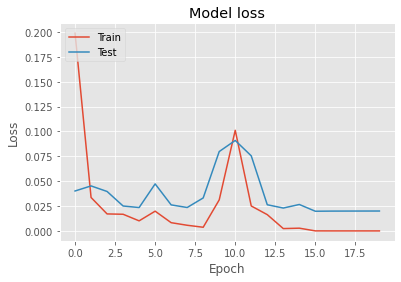

done with 3th training loop

[64, 64] filter, [128] unit, 64 batch_size, 0.001 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 22ms/step - loss: 0.1006 - accuracy: 0.9649 - val_loss: 0.0271 - val_accuracy: 0.9919
Epoch 2/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0259 - accuracy: 0.9922 - val_loss: 0.0342 - val_accuracy: 0.9896
Epoch 3/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0134 - accuracy: 0.9956 - val_loss: 0.0210 - val_accuracy: 0.9936
Epoch 4/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0080 - accuracy: 0.9973 - val_loss: 0.0261 - val_accuracy: 0.9925
Epoch 5/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0046 - accuracy: 0.9986 - val_loss: 0.0282 - val_accuracy: 0.9936
Epoch 6/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0039 - accuracy: 0.9987 - val_loss: 0.0396 - val_accuracy: 0.9905
Epoch 7/20
162/162 [=============================

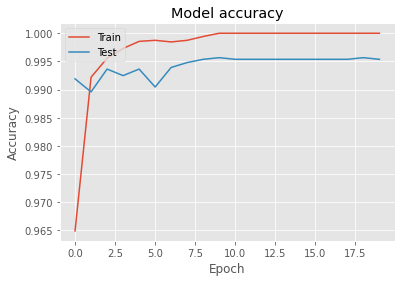

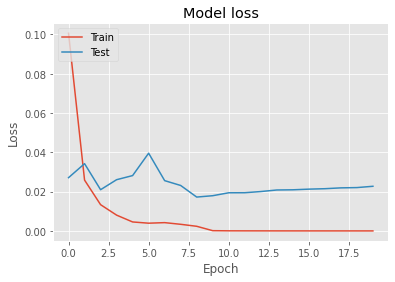

done with 4th training loop

[64, 64] filter, [256] unit, 64 batch_size, 0.001 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0956 - accuracy: 0.9686 - val_loss: 0.0609 - val_accuracy: 0.9757
Epoch 2/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0260 - accuracy: 0.9917 - val_loss: 0.0220 - val_accuracy: 0.9919
Epoch 3/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0107 - accuracy: 0.9959 - val_loss: 0.0200 - val_accuracy: 0.9942
Epoch 4/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0082 - accuracy: 0.9968 - val_loss: 0.0243 - val_accuracy: 0.9939
Epoch 5/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0043 - accuracy: 0.9989 - val_loss: 0.0151 - val_accuracy: 0.9962
Epoch 6/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0022 - accuracy: 0.9992 - val_loss: 0.0246 - val_accuracy: 0.9939
Epoch 7/20
162/162 [=============================

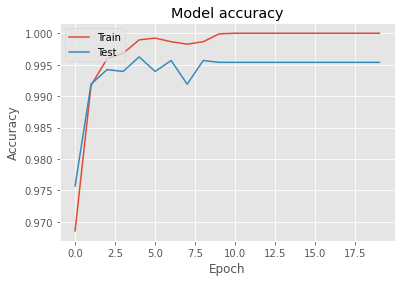

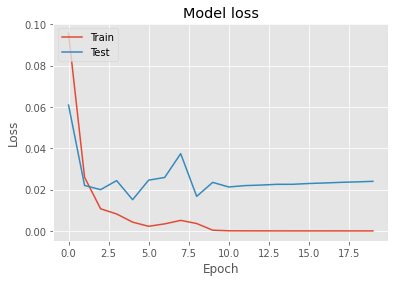

done with 5th training loop

[128, 128] filter, [128] unit, 64 batch_size, 0.001 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0932 - accuracy: 0.9666 - val_loss: 0.0261 - val_accuracy: 0.9910
Epoch 2/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0204 - accuracy: 0.9924 - val_loss: 0.0287 - val_accuracy: 0.9916
Epoch 3/20
162/162 [==============================] - 4s 24ms/step - loss: 0.0101 - accuracy: 0.9963 - val_loss: 0.0215 - val_accuracy: 0.9933
Epoch 4/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0056 - accuracy: 0.9983 - val_loss: 0.0161 - val_accuracy: 0.9942
Epoch 5/20
162/162 [==============================] - 4s 22ms/step - loss: 0.0046 - accuracy: 0.9985 - val_loss: 0.0252 - val_accuracy: 0.9922
Epoch 6/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0021 - accuracy: 0.9993 - val_loss: 0.0194 - val_accuracy: 0.9948
Epoch 7/20
162/162 [===========================

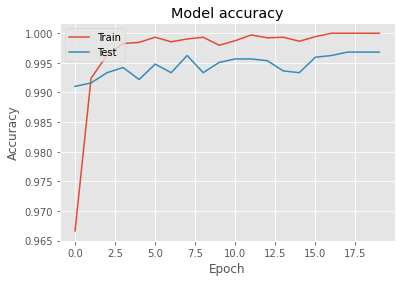

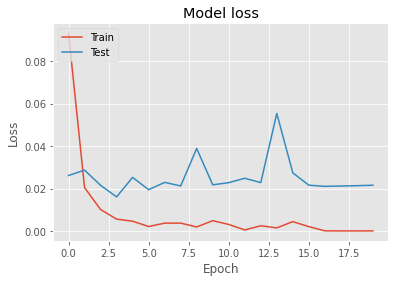

done with 6th training loop

[128, 128] filter, [256] unit, 64 batch_size, 0.001 learning_rate
Epoch 1/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0877 - accuracy: 0.9685 - val_loss: 0.0238 - val_accuracy: 0.9928
Epoch 2/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0180 - accuracy: 0.9933 - val_loss: 0.0368 - val_accuracy: 0.9870
Epoch 3/20
162/162 [==============================] - 4s 25ms/step - loss: 0.0097 - accuracy: 0.9966 - val_loss: 0.0251 - val_accuracy: 0.9931
Epoch 4/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0064 - accuracy: 0.9979 - val_loss: 0.0255 - val_accuracy: 0.9939
Epoch 5/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0032 - accuracy: 0.9986 - val_loss: 0.0225 - val_accuracy: 0.9951
Epoch 6/20
162/162 [==============================] - 4s 23ms/step - loss: 0.0037 - accuracy: 0.9988 - val_loss: 0.0175 - val_accuracy: 0.9962
Epoch 7/20
162/162 [===========================

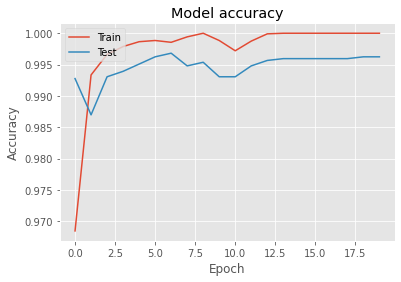

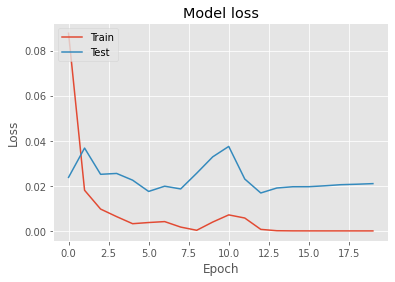

done with 7th training loop

[64, 64] filter, [128] unit, 128 batch_size, 0.01 learning_rate
Epoch 1/20
81/81 [==============================] - 2s 24ms/step - loss: 0.1860 - accuracy: 0.9439 - val_loss: 0.0266 - val_accuracy: 0.9902
Epoch 2/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0239 - accuracy: 0.9922 - val_loss: 0.0270 - val_accuracy: 0.9916
Epoch 3/20
81/81 [==============================] - 2s 23ms/step - loss: 0.0174 - accuracy: 0.9932 - val_loss: 0.0163 - val_accuracy: 0.9939
Epoch 4/20
81/81 [==============================] - 2s 23ms/step - loss: 0.0078 - accuracy: 0.9975 - val_loss: 0.0181 - val_accuracy: 0.9928
Epoch 5/20
81/81 [==============================] - 2s 23ms/step - loss: 0.0126 - accuracy: 0.9959 - val_loss: 0.0332 - val_accuracy: 0.9916
Epoch 6/20
81/81 [==============================] - 2s 26ms/step - loss: 0.0068 - accuracy: 0.9983 - val_loss: 0.0155 - val_accuracy: 0.9948
Epoch 7/20
81/81 [==============================] - 2s 26ms/s

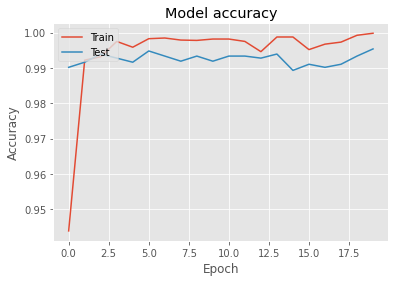

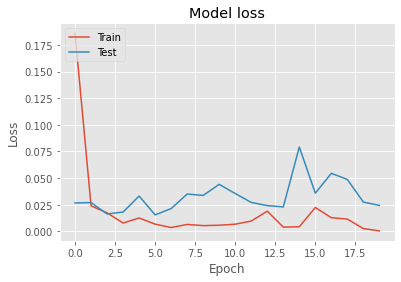

done with 8th training loop

[64, 64] filter, [256] unit, 128 batch_size, 0.01 learning_rate
Epoch 1/20
81/81 [==============================] - 2s 24ms/step - loss: 0.1604 - accuracy: 0.9503 - val_loss: 0.0254 - val_accuracy: 0.9919
Epoch 2/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0214 - accuracy: 0.9935 - val_loss: 0.0222 - val_accuracy: 0.9922
Epoch 3/20
81/81 [==============================] - 2s 23ms/step - loss: 0.0157 - accuracy: 0.9953 - val_loss: 0.0208 - val_accuracy: 0.9933
Epoch 4/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0094 - accuracy: 0.9971 - val_loss: 0.0250 - val_accuracy: 0.9925
Epoch 5/20
81/81 [==============================] - 2s 23ms/step - loss: 0.0066 - accuracy: 0.9982 - val_loss: 0.0203 - val_accuracy: 0.9951
Epoch 6/20
81/81 [==============================] - 2s 25ms/step - loss: 0.0023 - accuracy: 0.9992 - val_loss: 0.0277 - val_accuracy: 0.9948
Epoch 7/20
81/81 [==============================] - 2s 24ms/s

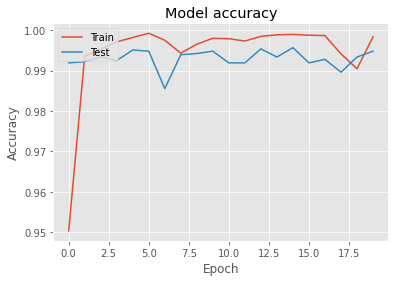

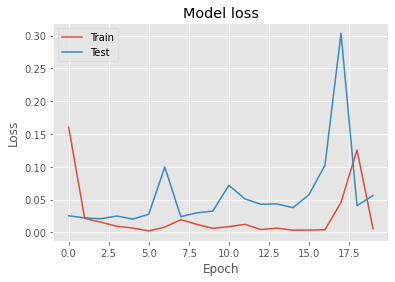

done with 9th training loop

[128, 128] filter, [128] unit, 128 batch_size, 0.01 learning_rate
Epoch 1/20
81/81 [==============================] - 3s 30ms/step - loss: 0.3260 - accuracy: 0.9390 - val_loss: 0.0363 - val_accuracy: 0.9905
Epoch 2/20
81/81 [==============================] - 3s 33ms/step - loss: 0.0265 - accuracy: 0.9910 - val_loss: 0.0230 - val_accuracy: 0.9905
Epoch 3/20
81/81 [==============================] - 3s 33ms/step - loss: 0.0108 - accuracy: 0.9966 - val_loss: 0.0260 - val_accuracy: 0.9910
Epoch 4/20
81/81 [==============================] - 3s 34ms/step - loss: 0.0063 - accuracy: 0.9979 - val_loss: 0.0263 - val_accuracy: 0.9922
Epoch 5/20
81/81 [==============================] - 2s 30ms/step - loss: 0.0080 - accuracy: 0.9973 - val_loss: 0.0314 - val_accuracy: 0.9933
Epoch 6/20
81/81 [==============================] - 3s 33ms/step - loss: 0.0102 - accuracy: 0.9966 - val_loss: 0.0466 - val_accuracy: 0.9896
Epoch 7/20
81/81 [==============================] - 2s 29ms

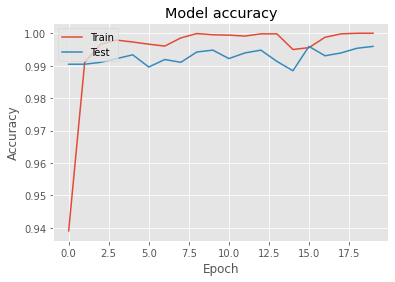

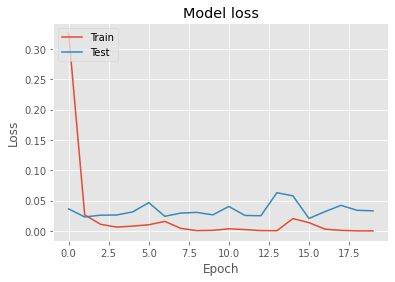

done with 10th training loop

[128, 128] filter, [256] unit, 128 batch_size, 0.01 learning_rate
Epoch 1/20
81/81 [==============================] - 3s 32ms/step - loss: 0.3295 - accuracy: 0.9320 - val_loss: 0.0391 - val_accuracy: 0.9878
Epoch 2/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0305 - accuracy: 0.9896 - val_loss: 0.0249 - val_accuracy: 0.9913
Epoch 3/20
81/81 [==============================] - 2s 31ms/step - loss: 0.0204 - accuracy: 0.9926 - val_loss: 0.0209 - val_accuracy: 0.9919
Epoch 4/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0142 - accuracy: 0.9946 - val_loss: 0.0193 - val_accuracy: 0.9933
Epoch 5/20
81/81 [==============================] - 3s 34ms/step - loss: 0.0091 - accuracy: 0.9968 - val_loss: 0.0241 - val_accuracy: 0.9931
Epoch 6/20
81/81 [==============================] - 3s 31ms/step - loss: 0.0074 - accuracy: 0.9971 - val_loss: 0.0456 - val_accuracy: 0.9893
Epoch 7/20
81/81 [==============================] - 2s 31m

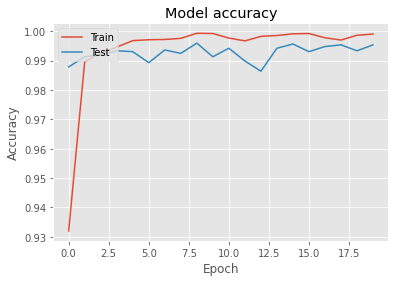

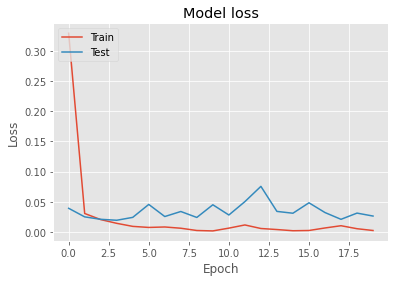

done with 11th training loop

[64, 64] filter, [128] unit, 128 batch_size, 0.001 learning_rate
Epoch 1/20
81/81 [==============================] - 2s 24ms/step - loss: 0.1444 - accuracy: 0.9510 - val_loss: 0.0432 - val_accuracy: 0.9852
Epoch 2/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0314 - accuracy: 0.9885 - val_loss: 0.0199 - val_accuracy: 0.9936
Epoch 3/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0155 - accuracy: 0.9957 - val_loss: 0.0269 - val_accuracy: 0.9922
Epoch 4/20
81/81 [==============================] - 2s 27ms/step - loss: 0.0086 - accuracy: 0.9966 - val_loss: 0.0158 - val_accuracy: 0.9945
Epoch 5/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0061 - accuracy: 0.9983 - val_loss: 0.0255 - val_accuracy: 0.9931
Epoch 6/20
81/81 [==============================] - 2s 25ms/step - loss: 0.0042 - accuracy: 0.9987 - val_loss: 0.0171 - val_accuracy: 0.9945
Epoch 7/20
81/81 [==============================] - 2s 24ms

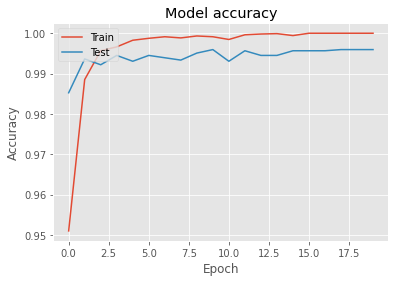

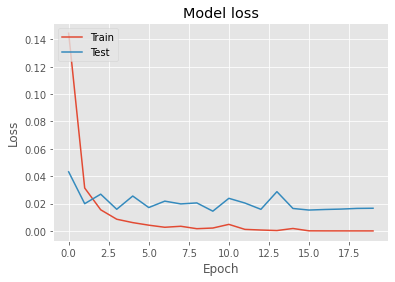

done with 12th training loop

[64, 64] filter, [256] unit, 128 batch_size, 0.001 learning_rate
Epoch 1/20
81/81 [==============================] - 2s 24ms/step - loss: 0.1325 - accuracy: 0.9575 - val_loss: 0.0344 - val_accuracy: 0.9873
Epoch 2/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0289 - accuracy: 0.9906 - val_loss: 0.0229 - val_accuracy: 0.9925
Epoch 3/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0141 - accuracy: 0.9948 - val_loss: 0.0147 - val_accuracy: 0.9951
Epoch 4/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0064 - accuracy: 0.9980 - val_loss: 0.0221 - val_accuracy: 0.9931
Epoch 5/20
81/81 [==============================] - 2s 24ms/step - loss: 0.0059 - accuracy: 0.9981 - val_loss: 0.0213 - val_accuracy: 0.9936
Epoch 6/20
81/81 [==============================] - 2s 25ms/step - loss: 0.0043 - accuracy: 0.9984 - val_loss: 0.0289 - val_accuracy: 0.9925
Epoch 7/20
81/81 [==============================] - 2s 24ms

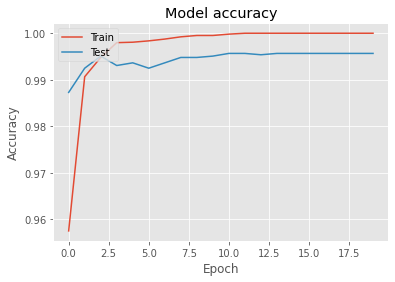

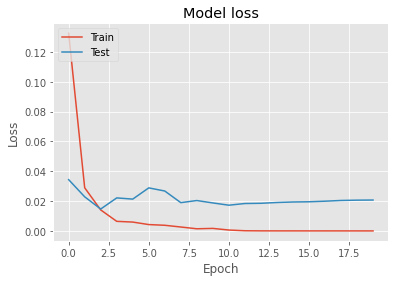

done with 13th training loop

[128, 128] filter, [128] unit, 128 batch_size, 0.001 learning_rate
Epoch 1/20
81/81 [==============================] - 3s 34ms/step - loss: 0.1277 - accuracy: 0.9540 - val_loss: 0.0346 - val_accuracy: 0.9881
Epoch 2/20
81/81 [==============================] - 2s 31ms/step - loss: 0.0229 - accuracy: 0.9930 - val_loss: 0.0297 - val_accuracy: 0.9902
Epoch 3/20
81/81 [==============================] - 3s 34ms/step - loss: 0.0109 - accuracy: 0.9968 - val_loss: 0.0206 - val_accuracy: 0.9939
Epoch 4/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0069 - accuracy: 0.9969 - val_loss: 0.0226 - val_accuracy: 0.9942
Epoch 5/20
81/81 [==============================] - 3s 33ms/step - loss: 0.0059 - accuracy: 0.9979 - val_loss: 0.0312 - val_accuracy: 0.9905
Epoch 6/20
81/81 [==============================] - 3s 34ms/step - loss: 0.0044 - accuracy: 0.9985 - val_loss: 0.0259 - val_accuracy: 0.9919
Epoch 7/20
81/81 [==============================] - 3s 35

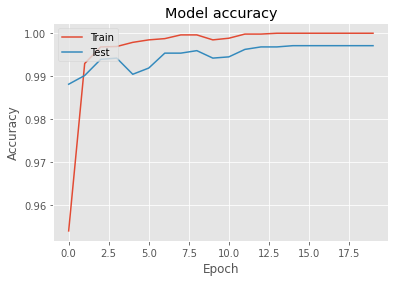

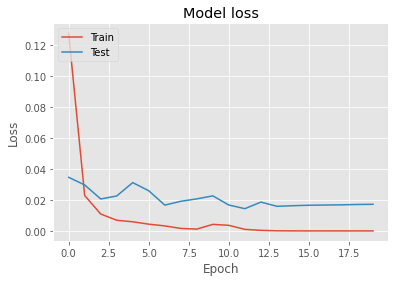

done with 14th training loop

[128, 128] filter, [256] unit, 128 batch_size, 0.001 learning_rate
Epoch 1/20
81/81 [==============================] - 3s 35ms/step - loss: 0.1201 - accuracy: 0.9582 - val_loss: 0.0263 - val_accuracy: 0.9922
Epoch 2/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0255 - accuracy: 0.9922 - val_loss: 0.0406 - val_accuracy: 0.9858
Epoch 3/20
81/81 [==============================] - 3s 31ms/step - loss: 0.0110 - accuracy: 0.9961 - val_loss: 0.0196 - val_accuracy: 0.9945
Epoch 4/20
81/81 [==============================] - 3s 36ms/step - loss: 0.0044 - accuracy: 0.9988 - val_loss: 0.0221 - val_accuracy: 0.9939
Epoch 5/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0036 - accuracy: 0.9990 - val_loss: 0.0182 - val_accuracy: 0.9933
Epoch 6/20
81/81 [==============================] - 3s 35ms/step - loss: 0.0011 - accuracy: 0.9998 - val_loss: 0.0205 - val_accuracy: 0.9942
Epoch 7/20
81/81 [==============================] - 3s 35

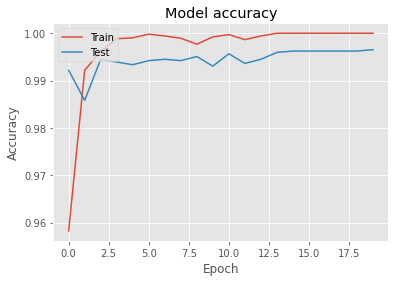

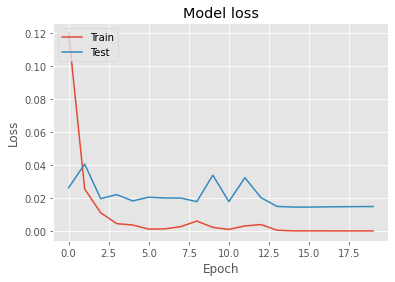

done with 15th training loop

[64, 64] filter, [128] unit, 256 batch_size, 0.01 learning_rate
Epoch 1/20
41/41 [==============================] - 1s 31ms/step - loss: 0.3958 - accuracy: 0.8833 - val_loss: 0.0575 - val_accuracy: 0.9812
Epoch 2/20
41/41 [==============================] - 1s 30ms/step - loss: 0.0351 - accuracy: 0.9882 - val_loss: 0.0288 - val_accuracy: 0.9905
Epoch 3/20
41/41 [==============================] - 1s 31ms/step - loss: 0.0247 - accuracy: 0.9923 - val_loss: 0.0289 - val_accuracy: 0.9907
Epoch 4/20
41/41 [==============================] - 1s 33ms/step - loss: 0.0155 - accuracy: 0.9946 - val_loss: 0.0302 - val_accuracy: 0.9913
Epoch 5/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0069 - accuracy: 0.9979 - val_loss: 0.0312 - val_accuracy: 0.9916
Epoch 6/20
41/41 [==============================] - 1s 33ms/step - loss: 0.0064 - accuracy: 0.9978 - val_loss: 0.0295 - val_accuracy: 0.9922
Epoch 7/20
41/41 [==============================] - 1s 30ms/

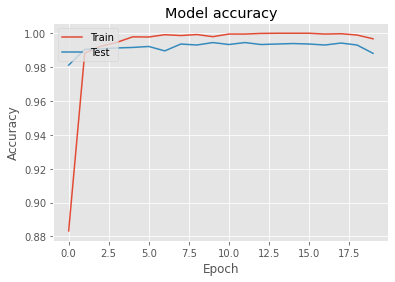

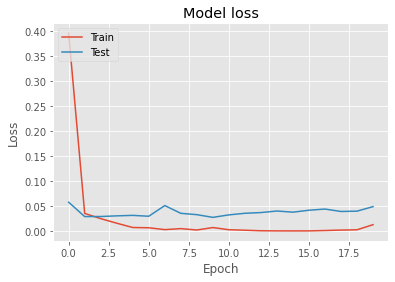

done with 16th training loop

[64, 64] filter, [256] unit, 256 batch_size, 0.01 learning_rate
Epoch 1/20
41/41 [==============================] - 1s 34ms/step - loss: 0.3490 - accuracy: 0.9098 - val_loss: 0.0462 - val_accuracy: 0.9838
Epoch 2/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0235 - accuracy: 0.9926 - val_loss: 0.0212 - val_accuracy: 0.9919
Epoch 3/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0186 - accuracy: 0.9938 - val_loss: 0.0186 - val_accuracy: 0.9939
Epoch 4/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0083 - accuracy: 0.9971 - val_loss: 0.0249 - val_accuracy: 0.9933
Epoch 5/20
41/41 [==============================] - 1s 30ms/step - loss: 0.0064 - accuracy: 0.9981 - val_loss: 0.0211 - val_accuracy: 0.9936
Epoch 6/20
41/41 [==============================] - 1s 33ms/step - loss: 0.0020 - accuracy: 0.9995 - val_loss: 0.0259 - val_accuracy: 0.9945
Epoch 7/20
41/41 [==============================] - 1s 30ms/

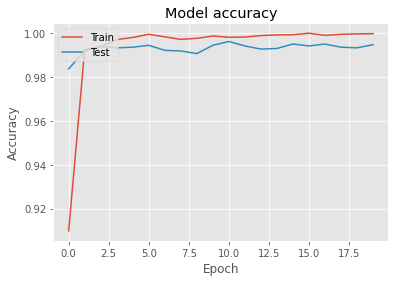

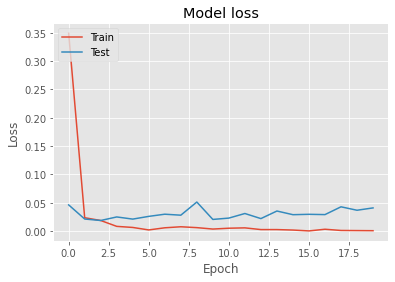

done with 17th training loop

[128, 128] filter, [128] unit, 256 batch_size, 0.01 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 46ms/step - loss: 0.9633 - accuracy: 0.8829 - val_loss: 0.0448 - val_accuracy: 0.9873
Epoch 2/20
41/41 [==============================] - 2s 45ms/step - loss: 0.0443 - accuracy: 0.9855 - val_loss: 0.0314 - val_accuracy: 0.9887
Epoch 3/20
41/41 [==============================] - 2s 43ms/step - loss: 0.0265 - accuracy: 0.9912 - val_loss: 0.0267 - val_accuracy: 0.9902
Epoch 4/20
41/41 [==============================] - 2s 44ms/step - loss: 0.0152 - accuracy: 0.9946 - val_loss: 0.0206 - val_accuracy: 0.9942
Epoch 5/20
41/41 [==============================] - 2s 43ms/step - loss: 0.0147 - accuracy: 0.9945 - val_loss: 0.0257 - val_accuracy: 0.9910
Epoch 6/20
41/41 [==============================] - 2s 47ms/step - loss: 0.0103 - accuracy: 0.9963 - val_loss: 0.0269 - val_accuracy: 0.9913
Epoch 7/20
41/41 [==============================] - 2s 46m

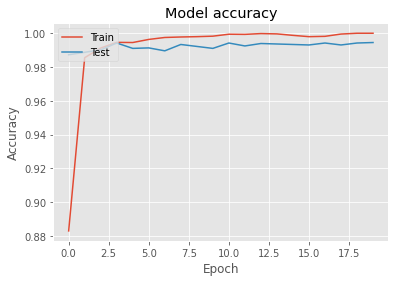

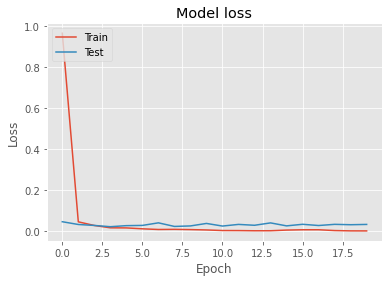

done with 18th training loop

[128, 128] filter, [256] unit, 256 batch_size, 0.01 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 47ms/step - loss: 0.4461 - accuracy: 0.8924 - val_loss: 0.0320 - val_accuracy: 0.9896
Epoch 2/20
41/41 [==============================] - 2s 43ms/step - loss: 0.0220 - accuracy: 0.9927 - val_loss: 0.0218 - val_accuracy: 0.9928
Epoch 3/20
41/41 [==============================] - 2s 45ms/step - loss: 0.0113 - accuracy: 0.9957 - val_loss: 0.0212 - val_accuracy: 0.9936
Epoch 4/20
41/41 [==============================] - 2s 44ms/step - loss: 0.0057 - accuracy: 0.9979 - val_loss: 0.0346 - val_accuracy: 0.9907
Epoch 5/20
41/41 [==============================] - 2s 45ms/step - loss: 0.0062 - accuracy: 0.9980 - val_loss: 0.0256 - val_accuracy: 0.9939
Epoch 6/20
41/41 [==============================] - 2s 46ms/step - loss: 0.0026 - accuracy: 0.9993 - val_loss: 0.0356 - val_accuracy: 0.9922
Epoch 7/20
41/41 [==============================] - 2s 45m

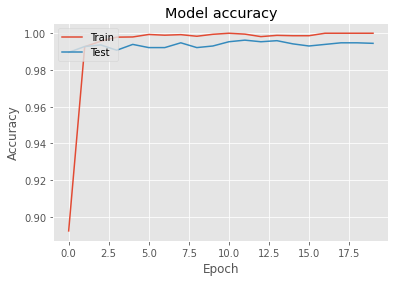

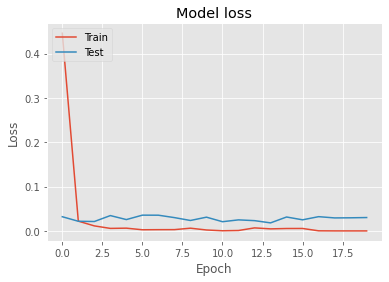

done with 19th training loop

[64, 64] filter, [128] unit, 256 batch_size, 0.001 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 37ms/step - loss: 0.2134 - accuracy: 0.9280 - val_loss: 0.0655 - val_accuracy: 0.9771
Epoch 2/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0428 - accuracy: 0.9859 - val_loss: 0.0312 - val_accuracy: 0.9893
Epoch 3/20
41/41 [==============================] - 1s 32ms/step - loss: 0.0303 - accuracy: 0.9900 - val_loss: 0.0369 - val_accuracy: 0.9881
Epoch 4/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0158 - accuracy: 0.9943 - val_loss: 0.0205 - val_accuracy: 0.9925
Epoch 5/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0090 - accuracy: 0.9967 - val_loss: 0.0290 - val_accuracy: 0.9907
Epoch 6/20
41/41 [==============================] - 1s 32ms/step - loss: 0.0068 - accuracy: 0.9977 - val_loss: 0.0198 - val_accuracy: 0.9933
Epoch 7/20
41/41 [==============================] - 1s 35ms

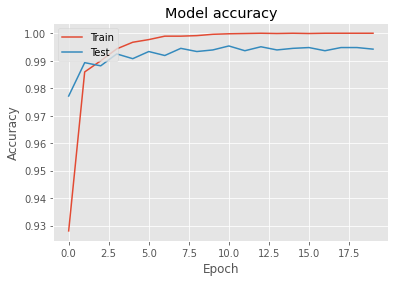

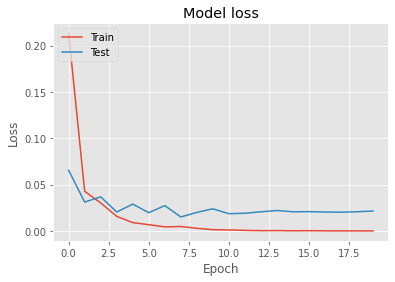

done with 20th training loop

[64, 64] filter, [256] unit, 256 batch_size, 0.001 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 37ms/step - loss: 0.1809 - accuracy: 0.9391 - val_loss: 0.0515 - val_accuracy: 0.9818
Epoch 2/20
41/41 [==============================] - 1s 32ms/step - loss: 0.0364 - accuracy: 0.9882 - val_loss: 0.0286 - val_accuracy: 0.9910
Epoch 3/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0225 - accuracy: 0.9921 - val_loss: 0.0230 - val_accuracy: 0.9919
Epoch 4/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0128 - accuracy: 0.9957 - val_loss: 0.0181 - val_accuracy: 0.9945
Epoch 5/20
41/41 [==============================] - 1s 31ms/step - loss: 0.0065 - accuracy: 0.9976 - val_loss: 0.0188 - val_accuracy: 0.9933
Epoch 6/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0040 - accuracy: 0.9987 - val_loss: 0.0148 - val_accuracy: 0.9957
Epoch 7/20
41/41 [==============================] - 1s 30ms

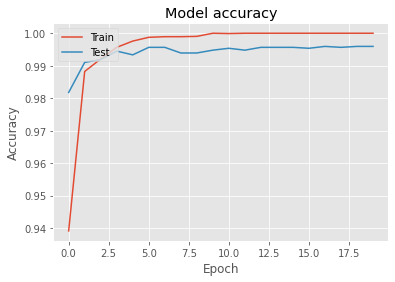

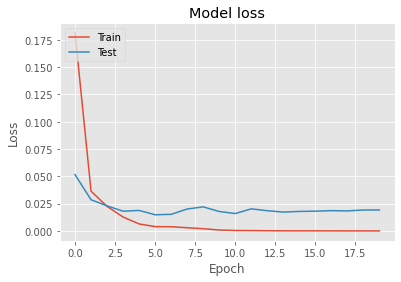

done with 21th training loop

[128, 128] filter, [128] unit, 256 batch_size, 0.001 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 47ms/step - loss: 0.1898 - accuracy: 0.9358 - val_loss: 0.0537 - val_accuracy: 0.9800
Epoch 2/20
41/41 [==============================] - 2s 43ms/step - loss: 0.0338 - accuracy: 0.9893 - val_loss: 0.0313 - val_accuracy: 0.9890
Epoch 3/20
41/41 [==============================] - 2s 44ms/step - loss: 0.0186 - accuracy: 0.9941 - val_loss: 0.0254 - val_accuracy: 0.9916
Epoch 4/20
41/41 [==============================] - 2s 46ms/step - loss: 0.0121 - accuracy: 0.9960 - val_loss: 0.0182 - val_accuracy: 0.9939
Epoch 5/20
41/41 [==============================] - 2s 47ms/step - loss: 0.0056 - accuracy: 0.9983 - val_loss: 0.0227 - val_accuracy: 0.9928
Epoch 6/20
41/41 [==============================] - 2s 44ms/step - loss: 0.0037 - accuracy: 0.9989 - val_loss: 0.0184 - val_accuracy: 0.9948
Epoch 7/20
41/41 [==============================] - 2s 45

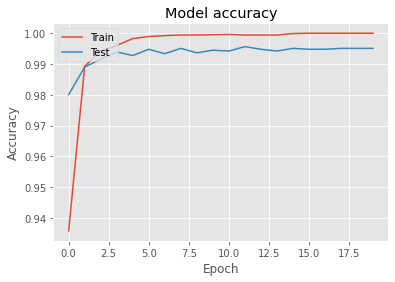

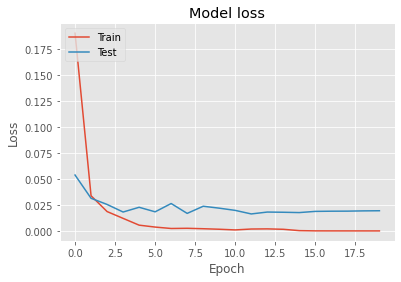

done with 22th training loop

[128, 128] filter, [256] unit, 256 batch_size, 0.001 learning_rate
Epoch 1/20
41/41 [==============================] - 2s 45ms/step - loss: 0.1946 - accuracy: 0.9314 - val_loss: 0.0372 - val_accuracy: 0.9861
Epoch 2/20
41/41 [==============================] - 2s 46ms/step - loss: 0.0326 - accuracy: 0.9896 - val_loss: 0.0207 - val_accuracy: 0.9945
Epoch 3/20
41/41 [==============================] - 2s 46ms/step - loss: 0.0183 - accuracy: 0.9939 - val_loss: 0.0174 - val_accuracy: 0.9939
Epoch 4/20
41/41 [==============================] - 2s 44ms/step - loss: 0.0109 - accuracy: 0.9955 - val_loss: 0.0192 - val_accuracy: 0.9931
Epoch 5/20
41/41 [==============================] - 2s 46ms/step - loss: 0.0063 - accuracy: 0.9975 - val_loss: 0.0235 - val_accuracy: 0.9928
Epoch 6/20
41/41 [==============================] - 2s 48ms/step - loss: 0.0058 - accuracy: 0.9981 - val_loss: 0.0269 - val_accuracy: 0.9933
Epoch 7/20
41/41 [==============================] - 2s 46

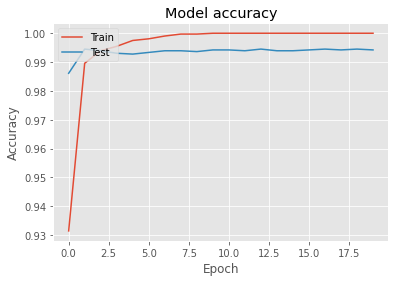

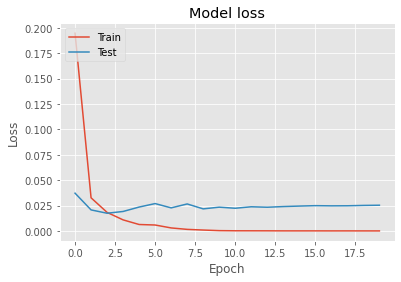

done with 23th training loop



In [ ]:
"""for i, (batch_size, learning_rate, filter, unit) in enumerate(product(batch_sizes, learning_rates, filters, units)):
  print(f"{filter} filter, {unit} unit, {batch_size} batch_size, {learning_rate} learning_rate")

  orig_mnist_model_cnn = model_creator(filter=filter, unit=unit,
                                       act="relu", dropout_prob=dropout_p,
                                       learning_rate=learning_rate)
  
  orig_history_cnn = orig_mnist_model_cnn.fit(X_mnist_train, y_mnist_train, 
                                            validation_data=(X_mnist_val, y_mnist_val), 
                                            batch_size=batch_size, epochs=epochs, verbose=1)
  
  loss_accuracy_plot(orig_history_cnn)
  
  descr = "f_" + str(filter[0]) + str (filter[1])
  descr = descr + "u_" + str(unit[0])

  save_model(model=orig_mnist_model_cnn, batch_size=batch_size, 
             n_epochs=epochs, descr="hyptune_cnnmodel" + descr, 
             learning_rate=learning_rate)
  print(f"done with {i}th training loop\n")"""


### Chosen Hyperparameters

Chosen architecture: ```[64, 64] filter, [256] unit, 256 batch_size, 0.01 learning_rate```

In [11]:
num_classes = 4
input_shape = (28, 28, 1)

epochs = 20
batch_size = 256
dropout_p = 0.0
learning_rate = 0.01

### Model fitting

In [12]:
"""orig_mnist_model_cnn = model_creator(act="relu", dropout_prob=dropout_p,
                                     learning_rate=learning_rate)
orig_mnist_model_cnn.summary()"""

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 28, 28, 64)        640       
_________________________________________________________________
activation (Activation)      (None, 28, 28, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 26, 64)        36928     
_________________________________________________________________
activation_1 (Activation)    (None, 26, 26, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 26, 26, 64)        0     

In [13]:
"""orig_history_cnn = orig_mnist_model_cnn.fit(X_mnist_train, y_mnist_train, 
                                            validation_data=(X_mnist_test, y_mnist_test), 
                                            batch_size=batch_size, epochs=epochs, verbose=1)"""


Epoch 1/20
41/41 [==============================] - 16s 33ms/step - loss: 0.3164 - accuracy: 0.9095 - val_loss: 0.0421 - val_accuracy: 0.9835
Epoch 2/20
41/41 [==============================] - 1s 27ms/step - loss: 0.0323 - accuracy: 0.9892 - val_loss: 0.0306 - val_accuracy: 0.9881
Epoch 3/20
41/41 [==============================] - 1s 27ms/step - loss: 0.0143 - accuracy: 0.9960 - val_loss: 0.0294 - val_accuracy: 0.9905
Epoch 4/20
41/41 [==============================] - 1s 27ms/step - loss: 0.0118 - accuracy: 0.9959 - val_loss: 0.0381 - val_accuracy: 0.9896
Epoch 5/20
41/41 [==============================] - 1s 28ms/step - loss: 0.0067 - accuracy: 0.9980 - val_loss: 0.0369 - val_accuracy: 0.9902
Epoch 6/20
41/41 [==============================] - 1s 31ms/step - loss: 0.0075 - accuracy: 0.9981 - val_loss: 0.0330 - val_accuracy: 0.9899
Epoch 7/20
41/41 [==============================] - 1s 27ms/step - loss: 0.0068 - accuracy: 0.9975 - val_loss: 0.0259 - val_accuracy: 0.9925
Epoch 8/20
4

In [ ]:
"""save_model(model=orig_mnist_model_cnn, batch_size=batch_size, 
           n_epochs=epochs, descr="orig_mnist_model_cnn", 
           learning_rate=learning_rate,
           dropout=None)"""

In [ ]:
orig_mnist_model_cnn = tf.keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_trained_models/model_orig_mnist_model_cnn_batchsize256_nepoch20_learningrate10.0.h5")

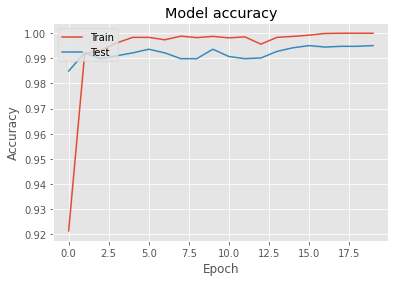

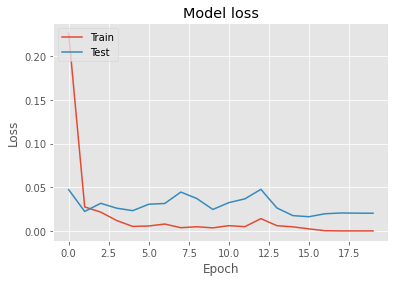

In [ ]:
"""loss_accuracy_plot(orig_history_cnn)"""

In [14]:
"""loss_orig_eval_cnn, accuracy_orig_eval_cnn = orig_mnist_model_cnn.evaluate(X_mnist_test, 
                                                                           y_mnist_test, 
                                                                           verbose=0)"""

In [ ]:
"""print(f"Eval loss = {loss_orig_eval_cnn}, Eval accuracy = {accuracy_orig_eval_cnn}")"""

Eval loss = 0.10071823000907898, Eval accuracy = 0.9858217835426331


In [15]:
print(f"Eval loss = {loss_orig_eval_cnn}, Eval accuracy = {accuracy_orig_eval_cnn}")

Eval loss = 0.035504862666130066, Eval accuracy = 0.9942129850387573


### Confusion matrix

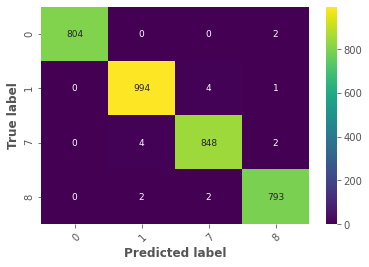

In [ ]:
pred = np.argmax(orig_mnist_model_cnn(X_mnist_test), axis=1)
conveted_pred = [class_converter(i) for i in pred]
conf = confusion_matrix(y_mnist_test_original, conveted_pred)
plot_confusion_matrix(conf, [0,1,7,8])

## EPISTEMIC (MC model)

### Hyperparameter tuning for dropout

In [ ]:
"""num_classes = 4
input_shape = (28, 28, 1)

epochs = 20
batch_size = 256
learning_rate = 0.01

dropout_ps = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]"""

0.1 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 36ms/step - loss: 1.2843 - accuracy: 0.8830 - val_loss: 0.5617 - val_accuracy: 0.9870
Epoch 2/20
41/41 [==============================] - 1s 34ms/step - loss: 0.3623 - accuracy: 0.9852 - val_loss: 0.2393 - val_accuracy: 0.9844
Epoch 3/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1940 - accuracy: 0.9863 - val_loss: 0.1493 - val_accuracy: 0.9907
Epoch 4/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1315 - accuracy: 0.9905 - val_loss: 0.1179 - val_accuracy: 0.9878
Epoch 5/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1034 - accuracy: 0.9914 - val_loss: 0.1004 - val_accuracy: 0.9907
Epoch 6/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0951 - accuracy: 0.9902 - val_loss: 0.0977 - val_accuracy: 0.9896
Epoch 7/20
41/41 [==============================] - 1s 34ms/step - loss: 0.0812 - accuracy: 0.9919 - val_loss: 0.0837 - val_accuracy: 0.9913

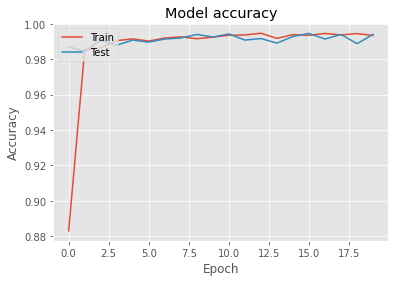

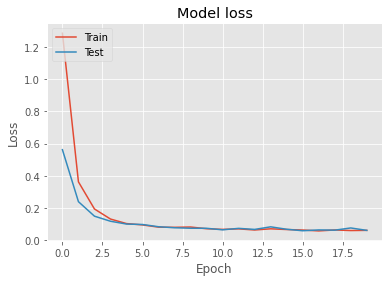

done with 0th training loop

0.15 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 35ms/step - loss: 1.3232 - accuracy: 0.8772 - val_loss: 0.6102 - val_accuracy: 0.9852
Epoch 2/20
41/41 [==============================] - 1s 32ms/step - loss: 0.3885 - accuracy: 0.9863 - val_loss: 0.2426 - val_accuracy: 0.9907
Epoch 3/20
41/41 [==============================] - 1s 32ms/step - loss: 0.2039 - accuracy: 0.9900 - val_loss: 0.1918 - val_accuracy: 0.9823
Epoch 4/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1581 - accuracy: 0.9873 - val_loss: 0.1356 - val_accuracy: 0.9922
Epoch 5/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1188 - accuracy: 0.9907 - val_loss: 0.1351 - val_accuracy: 0.9806
Epoch 6/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1098 - accuracy: 0.9905 - val_loss: 0.1036 - val_accuracy: 0.9899
Epoch 7/20
41/41 [==============================] - 1s 31ms/step - loss: 0.0968 - accuracy: 0.9906 - val_loss:

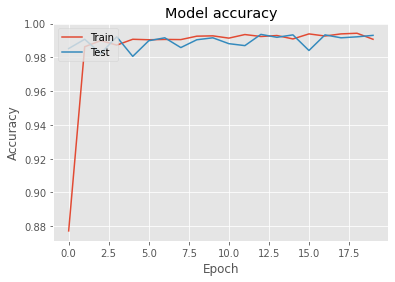

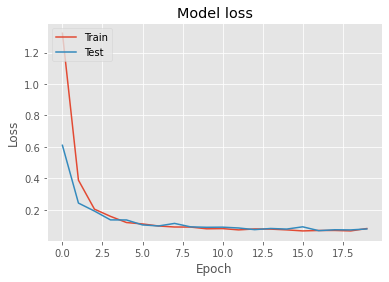

done with 1th training loop

0.2 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 36ms/step - loss: 0.9753 - accuracy: 0.9074 - val_loss: 0.3983 - val_accuracy: 0.9841
Epoch 2/20
41/41 [==============================] - 1s 31ms/step - loss: 0.2587 - accuracy: 0.9841 - val_loss: 0.1735 - val_accuracy: 0.9893
Epoch 3/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1521 - accuracy: 0.9890 - val_loss: 0.1442 - val_accuracy: 0.9821
Epoch 4/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1255 - accuracy: 0.9886 - val_loss: 0.1142 - val_accuracy: 0.9928
Epoch 5/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1160 - accuracy: 0.9882 - val_loss: 0.1014 - val_accuracy: 0.9922
Epoch 6/20
41/41 [==============================] - 1s 32ms/step - loss: 0.0953 - accuracy: 0.9921 - val_loss: 0.1090 - val_accuracy: 0.9870
Epoch 7/20
41/41 [==============================] - 1s 32ms/step - loss: 0.0928 - accuracy: 0.9916 - val_loss: 

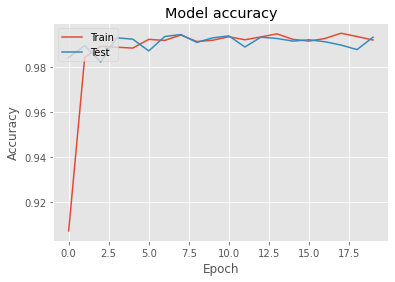

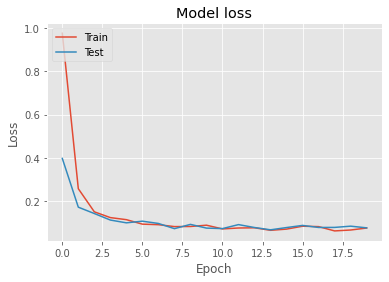

done with 2th training loop

0.25 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 33ms/step - loss: 1.3548 - accuracy: 0.8881 - val_loss: 0.6896 - val_accuracy: 0.9858
Epoch 2/20
41/41 [==============================] - 1s 32ms/step - loss: 0.4747 - accuracy: 0.9865 - val_loss: 0.3929 - val_accuracy: 0.9659
Epoch 3/20
41/41 [==============================] - 1s 32ms/step - loss: 0.2779 - accuracy: 0.9876 - val_loss: 0.2479 - val_accuracy: 0.9771
Epoch 4/20
41/41 [==============================] - 1s 32ms/step - loss: 0.2107 - accuracy: 0.9876 - val_loss: 0.1713 - val_accuracy: 0.9919
Epoch 5/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1550 - accuracy: 0.9899 - val_loss: 0.1652 - val_accuracy: 0.9789
Epoch 6/20
41/41 [==============================] - 1s 33ms/step - loss: 0.1357 - accuracy: 0.9898 - val_loss: 0.1228 - val_accuracy: 0.9916
Epoch 7/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1215 - accuracy: 0.9913 - val_loss:

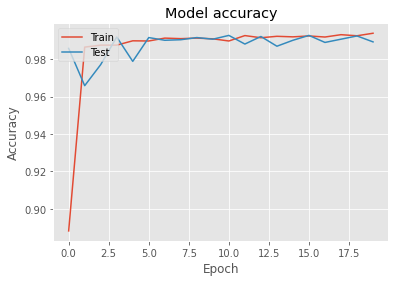

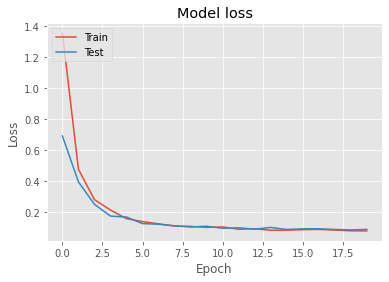

done with 3th training loop

0.3 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 34ms/step - loss: 1.0113 - accuracy: 0.9135 - val_loss: 0.4729 - val_accuracy: 0.9829
Epoch 2/20
41/41 [==============================] - 1s 35ms/step - loss: 0.3004 - accuracy: 0.9838 - val_loss: 0.2078 - val_accuracy: 0.9902
Epoch 3/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1712 - accuracy: 0.9902 - val_loss: 0.1492 - val_accuracy: 0.9878
Epoch 4/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1270 - accuracy: 0.9905 - val_loss: 0.1314 - val_accuracy: 0.9881
Epoch 5/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1134 - accuracy: 0.9899 - val_loss: 0.1034 - val_accuracy: 0.9919
Epoch 6/20
41/41 [==============================] - 1s 35ms/step - loss: 0.0953 - accuracy: 0.9914 - val_loss: 0.1002 - val_accuracy: 0.9893
Epoch 7/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1052 - accuracy: 0.9900 - val_loss: 

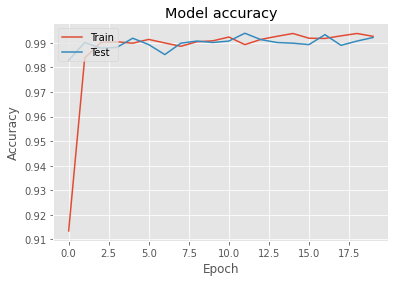

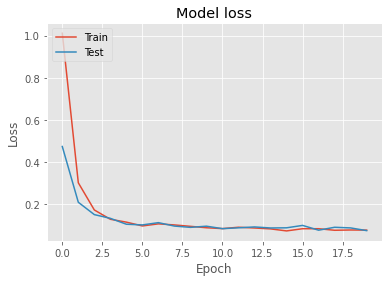

done with 4th training loop

0.35 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 36ms/step - loss: 1.5570 - accuracy: 0.8652 - val_loss: 0.8122 - val_accuracy: 0.9731
Epoch 2/20
41/41 [==============================] - 1s 36ms/step - loss: 0.5826 - accuracy: 0.9774 - val_loss: 0.3970 - val_accuracy: 0.9864
Epoch 3/20
41/41 [==============================] - 1s 35ms/step - loss: 0.3286 - accuracy: 0.9827 - val_loss: 0.2642 - val_accuracy: 0.9847
Epoch 4/20
41/41 [==============================] - 1s 33ms/step - loss: 0.2336 - accuracy: 0.9839 - val_loss: 0.2091 - val_accuracy: 0.9850
Epoch 5/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1915 - accuracy: 0.9831 - val_loss: 0.1878 - val_accuracy: 0.9826
Epoch 6/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1654 - accuracy: 0.9860 - val_loss: 0.1639 - val_accuracy: 0.9809
Epoch 7/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1403 - accuracy: 0.9877 - val_loss:

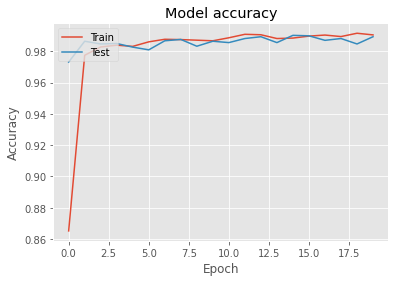

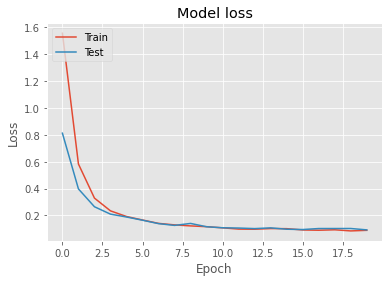

done with 5th training loop

0.4 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 34ms/step - loss: 1.1367 - accuracy: 0.8812 - val_loss: 0.5935 - val_accuracy: 0.9760
Epoch 2/20
41/41 [==============================] - 1s 36ms/step - loss: 0.3862 - accuracy: 0.9799 - val_loss: 0.2770 - val_accuracy: 0.9742
Epoch 3/20
41/41 [==============================] - 1s 36ms/step - loss: 0.2246 - accuracy: 0.9837 - val_loss: 0.1828 - val_accuracy: 0.9867
Epoch 4/20
41/41 [==============================] - 1s 36ms/step - loss: 0.1641 - accuracy: 0.9873 - val_loss: 0.1580 - val_accuracy: 0.9850
Epoch 5/20
41/41 [==============================] - 1s 36ms/step - loss: 0.1437 - accuracy: 0.9874 - val_loss: 0.1654 - val_accuracy: 0.9789
Epoch 6/20
41/41 [==============================] - 1s 32ms/step - loss: 0.1346 - accuracy: 0.9887 - val_loss: 0.1432 - val_accuracy: 0.9823
Epoch 7/20
41/41 [==============================] - 1s 33ms/step - loss: 0.1146 - accuracy: 0.9897 - val_loss: 

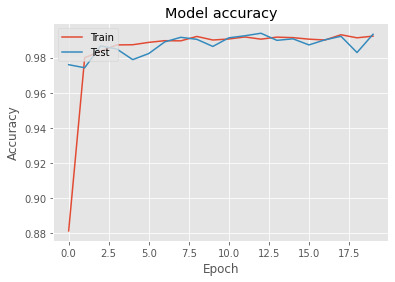

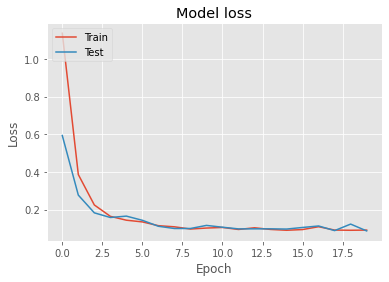

done with 6th training loop

0.45 dropout_p
Epoch 1/20
41/41 [==============================] - 1s 33ms/step - loss: 1.1886 - accuracy: 0.8656 - val_loss: 0.6099 - val_accuracy: 0.9795
Epoch 2/20
41/41 [==============================] - 1s 33ms/step - loss: 0.4133 - accuracy: 0.9798 - val_loss: 0.2635 - val_accuracy: 0.9847
Epoch 3/20
41/41 [==============================] - 1s 36ms/step - loss: 0.2209 - accuracy: 0.9844 - val_loss: 0.1977 - val_accuracy: 0.9821
Epoch 4/20
41/41 [==============================] - 1s 36ms/step - loss: 0.1837 - accuracy: 0.9809 - val_loss: 0.1758 - val_accuracy: 0.9829
Epoch 5/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1607 - accuracy: 0.9860 - val_loss: 0.1380 - val_accuracy: 0.9893
Epoch 6/20
41/41 [==============================] - 1s 33ms/step - loss: 0.1343 - accuracy: 0.9857 - val_loss: 0.1497 - val_accuracy: 0.9844
Epoch 7/20
41/41 [==============================] - 1s 35ms/step - loss: 0.1380 - accuracy: 0.9859 - val_loss:

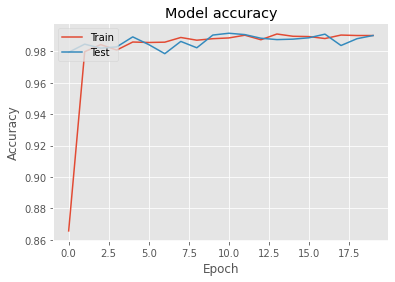

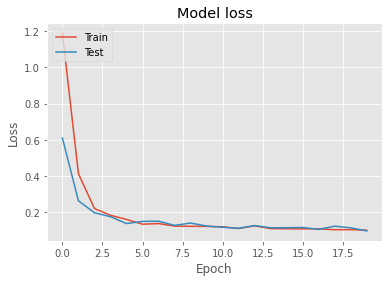

done with 7th training loop

0.5 dropout_p
Epoch 1/20
41/41 [==============================] - 2s 37ms/step - loss: 1.2608 - accuracy: 0.8494 - val_loss: 0.6271 - val_accuracy: 0.9685
Epoch 2/20
41/41 [==============================] - 1s 36ms/step - loss: 0.4235 - accuracy: 0.9756 - val_loss: 0.2855 - val_accuracy: 0.9754
Epoch 3/20
41/41 [==============================] - 1s 33ms/step - loss: 0.2444 - accuracy: 0.9752 - val_loss: 0.2082 - val_accuracy: 0.9748
Epoch 4/20
41/41 [==============================] - 1s 33ms/step - loss: 0.1916 - accuracy: 0.9781 - val_loss: 0.1675 - val_accuracy: 0.9809
Epoch 5/20
41/41 [==============================] - 1s 36ms/step - loss: 0.1616 - accuracy: 0.9800 - val_loss: 0.1591 - val_accuracy: 0.9777
Epoch 6/20
41/41 [==============================] - 1s 36ms/step - loss: 0.1516 - accuracy: 0.9809 - val_loss: 0.1435 - val_accuracy: 0.9789
Epoch 7/20
41/41 [==============================] - 1s 34ms/step - loss: 0.1363 - accuracy: 0.9838 - val_loss: 

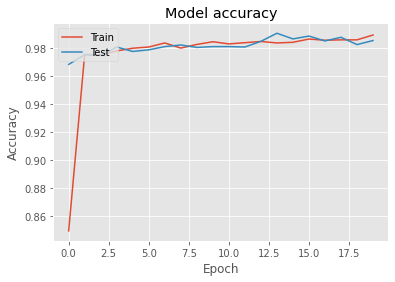

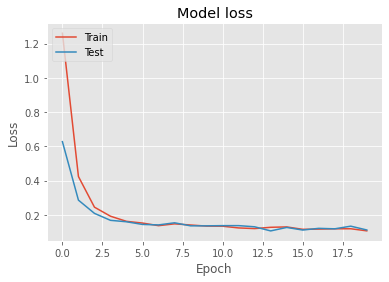

done with 8th training loop



In [ ]:
"""for i, (dropout_p) in enumerate(dropout_ps):
  print(f"{dropout_p} dropout_p")

  orig_mnist_model_cnn = model_creator(act="relu", dropout_prob=dropout_p, 
                                       learning_rate=0.01)
  
  orig_history_cnn = orig_mnist_model_cnn.fit(X_mnist_train, y_mnist_train, 
                                            validation_data=(X_mnist_val, y_mnist_val), 
                                            batch_size=256, epochs=20, verbose=1)
  
  loss_accuracy_plot(orig_history_cnn)
  

  save_model(model=orig_mnist_model_cnn, batch_size=256, 
             n_epochs=20, descr="hyptune_dropout_cnnmodel", 
             learning_rate=0.01)
  print(f"done with {i}th training loop\n")"""


### Hyperparameters with chosen dropout probability

Chosen dropout probability ```dropout_p = 0.25```


In [16]:
num_classes = 4
input_shape = (28, 28, 1)

epochs = 20
batch_size = 256
learning_rate = 0.01

dropout_p = 0.25 

### Model fitting

In [17]:
"""mc_model_cnn = model_creator(act="relu", dropout_prob=dropout_p,
                             learning_rate=learning_rate)"""

In [18]:
"""mc_history_cnn = mc_model_cnn.fit(X_mnist_train, y_mnist_train, 
                                    validation_data=(X_mnist_test, y_mnist_test), 
                                    batch_size=batch_size, epochs=epochs, verbose=1)"""

Epoch 1/20
41/41 [==============================] - 1s 36ms/step - loss: 1.2073 - accuracy: 0.8918 - val_loss: 0.6586 - val_accuracy: 0.9763
Epoch 2/20
41/41 [==============================] - 1s 34ms/step - loss: 0.4211 - accuracy: 0.9845 - val_loss: 0.2799 - val_accuracy: 0.9850
Epoch 3/20
41/41 [==============================] - 1s 32ms/step - loss: 0.2305 - accuracy: 0.9851 - val_loss: 0.2062 - val_accuracy: 0.9835
Epoch 4/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1708 - accuracy: 0.9881 - val_loss: 0.1480 - val_accuracy: 0.9878
Epoch 5/20
41/41 [==============================] - 1s 34ms/step - loss: 0.1342 - accuracy: 0.9888 - val_loss: 0.1476 - val_accuracy: 0.9806
Epoch 6/20
41/41 [==============================] - 1s 31ms/step - loss: 0.1181 - accuracy: 0.9900 - val_loss: 0.1099 - val_accuracy: 0.9893
Epoch 7/20
41/41 [==============================] - 1s 34ms/step - loss: 0.1060 - accuracy: 0.9898 - val_loss: 0.1399 - val_accuracy: 0.9809
Epoch 8/20
41

In [ ]:
"""save_model(model=mc_model_cnn, batch_size=batch_size, 
           n_epochs=epochs, descr="mc_model_mnist_cnn", 
           dropout=dropout_p, learning_rate=learning_rate)"""

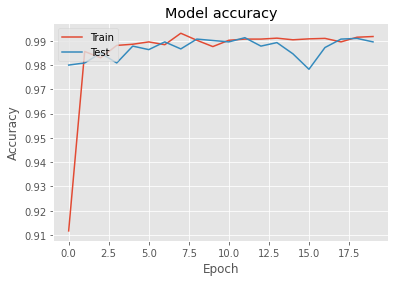

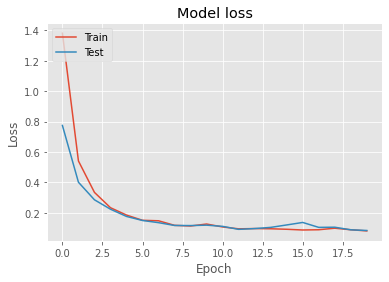

In [ ]:
"""loss_accuracy_plot(mc_history_cnn)"""

In [ ]:
mc_model_cnn = tf.keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_trained_models/model_mc_model_mnist_cnn_batchsize256_nepoch20_dropout25.0_learningrate10.0.h5",
                                          # custom_objects={"bayesian_categorical_crossentropy_internal": bayesian_categorical_crossentropy}
                                          )



In [ ]:
"""loss_mc_eval_cnn, accuracy_mc_eval_cnn = mc_model_cnn.evaluate(X_mnist_test, y_mnist_test, verbose=0)
print(f"Eval loss = {loss_mc_eval_cnn}, Eval accuracy = {accuracy_mc_eval_cnn}")"""

Eval loss = 0.08282309025526047, Eval accuracy = 0.9918981194496155


### Examples

In [ ]:
mc_cnn_predictions = make_predictions(mc_model_cnn)
mc_cnn_ensemble_pred, mc_cnn_ensemble_acc = ensemble_pred(mc_cnn_predictions)
mc_cnn_y_mean, mc_cnn_y_std, mc_cnn_epistemic = cal_epistemic(mc_cnn_predictions)

100%|██████████| 100/100 [00:14<00:00,  7.00it/s]

MC-ensemble accuracy: 99.4%


In [ ]:
from numpy import loadtxt
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
mc_cnn_epistemic = loadtxt(fp+'/mc_epistemic_mnist.csv', delimiter=',')

In [ ]:
"""from numpy import savetxt
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
savetxt(fp + '/mc_epistemic_mnist.csv', mc_cnn_epistemic, delimiter=',')"""

#### Confusion matrix

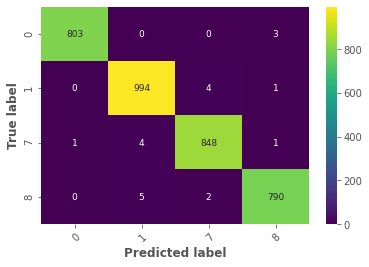

In [ ]:
pred = np.argmax(mc_cnn_y_mean, axis=1)
converted_pred = [class_converter(i) for i in pred]
conf = confusion_matrix(y_mnist_test_original, converted_pred)
plot_confusion_matrix(conf, [0,1,7,8])

#### Epistemic part 1

True label of the test sample 3248: 7
Predicted label of test sample 3248: 7
Epistemic uncertainty: 0.3561


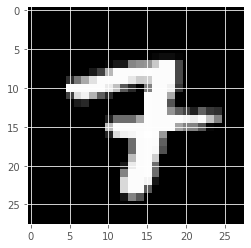

True label of the test sample 2143: 7
Predicted label of test sample 2143: 7
Epistemic uncertainty: 0.3416


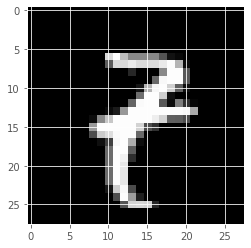

True label of the test sample 1809: 7
Predicted label of test sample 1809: 8
Epistemic uncertainty: 0.3353


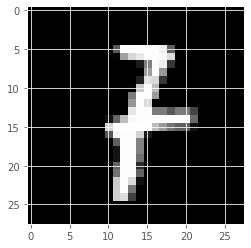

True label of the test sample 722: 8
Predicted label of test sample 722: 7
Epistemic uncertainty: 0.3339


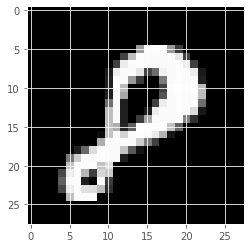

True label of the test sample 2467: 7
Predicted label of test sample 2467: 7
Epistemic uncertainty: 0.3259


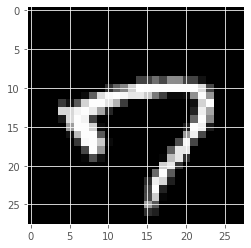

True label of the test sample 455: 7
Predicted label of test sample 455: 7
Epistemic uncertainty: 0.3217


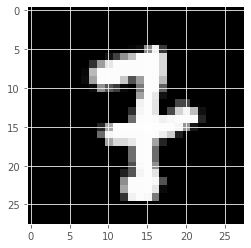

True label of the test sample 278: 0
Predicted label of test sample 278: 8
Epistemic uncertainty: 0.3203


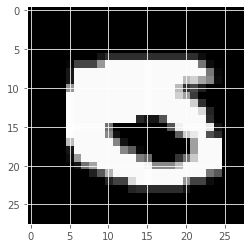

True label of the test sample 2095: 0
Predicted label of test sample 2095: 0
Epistemic uncertainty: 0.313


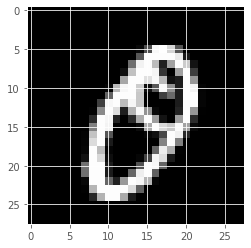

True label of the test sample 1870: 7
Predicted label of test sample 1870: 7
Epistemic uncertainty: 0.3094


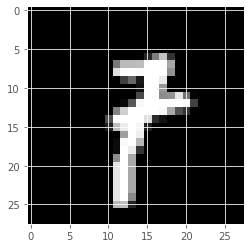

True label of the test sample 248: 7
Predicted label of test sample 248: 7
Epistemic uncertainty: 0.3053


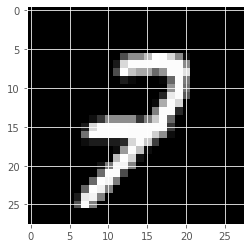

True label of the test sample 1083: 7
Predicted label of test sample 1083: 7
Epistemic uncertainty: 0.3002


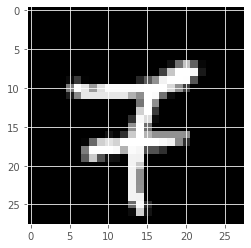

True label of the test sample 3290: 7
Predicted label of test sample 3290: 7
Epistemic uncertainty: 0.2976


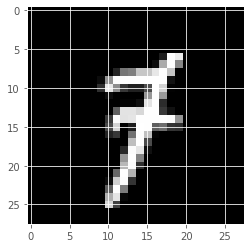

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.2945


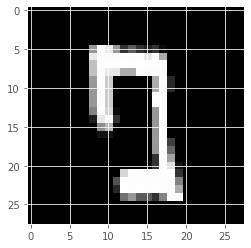

True label of the test sample 2687: 7
Predicted label of test sample 2687: 7
Epistemic uncertainty: 0.2944


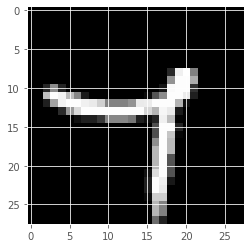

True label of the test sample 2403: 8
Predicted label of test sample 2403: 1
Epistemic uncertainty: 0.2941


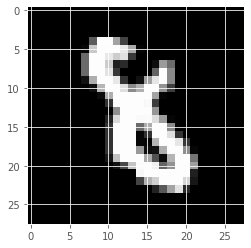

True label of the test sample 1211: 0
Predicted label of test sample 1211: 0
Epistemic uncertainty: 0.293


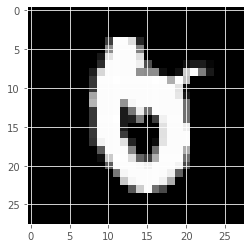

True label of the test sample 2868: 0
Predicted label of test sample 2868: 8
Epistemic uncertainty: 0.291


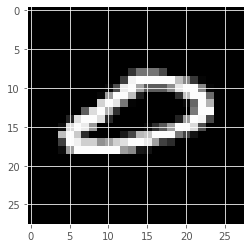

True label of the test sample 2983: 7
Predicted label of test sample 2983: 7
Epistemic uncertainty: 0.2853


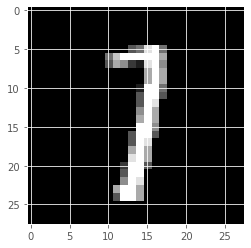

True label of the test sample 3314: 7
Predicted label of test sample 3314: 7
Epistemic uncertainty: 0.2813


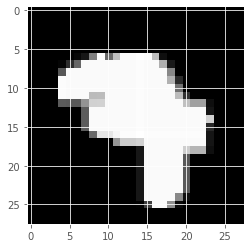

True label of the test sample 2698: 1
Predicted label of test sample 2698: 7
Epistemic uncertainty: 0.2806


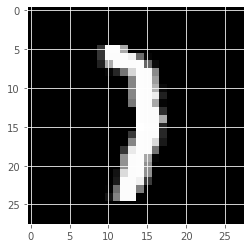

In [ ]:
show_epistemic(mc_cnn_epistemic[0], mc_cnn_ensemble_pred)

True label of the test sample 2760: 8
Predicted label of test sample 2760: 8
Epistemic uncertainty: 4.355e-07


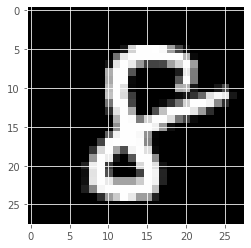

True label of the test sample 50: 7
Predicted label of test sample 50: 7
Epistemic uncertainty: 6.789e-07


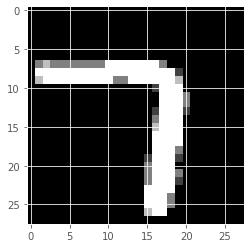

True label of the test sample 3451: 8
Predicted label of test sample 3451: 8
Epistemic uncertainty: 8.033e-07


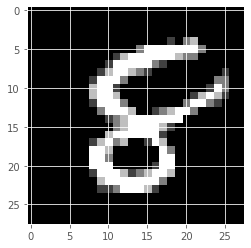

True label of the test sample 906: 0
Predicted label of test sample 906: 0
Epistemic uncertainty: 1.29e-06


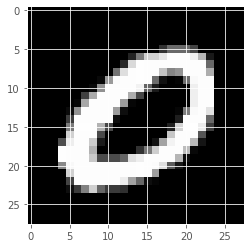

True label of the test sample 1585: 0
Predicted label of test sample 1585: 0
Epistemic uncertainty: 1.785e-06


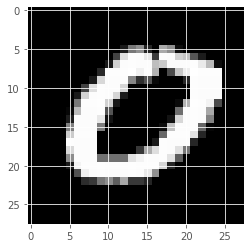

True label of the test sample 1446: 8
Predicted label of test sample 1446: 8
Epistemic uncertainty: 2.538e-06


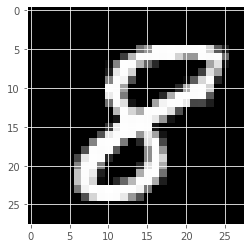

True label of the test sample 1560: 7
Predicted label of test sample 1560: 7
Epistemic uncertainty: 2.612e-06


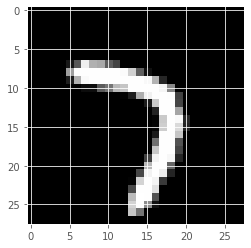

True label of the test sample 3192: 0
Predicted label of test sample 3192: 0
Epistemic uncertainty: 3.095e-06


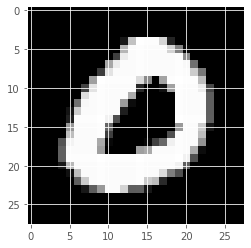

True label of the test sample 696: 7
Predicted label of test sample 696: 7
Epistemic uncertainty: 3.165e-06


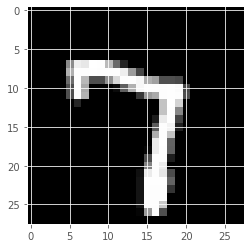

True label of the test sample 63: 0
Predicted label of test sample 63: 0
Epistemic uncertainty: 3.425e-06


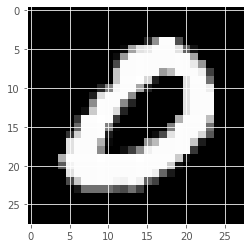

True label of the test sample 2066: 0
Predicted label of test sample 2066: 0
Epistemic uncertainty: 3.647e-06


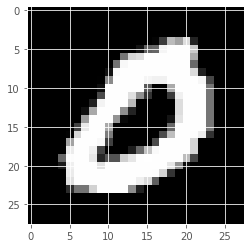

True label of the test sample 2699: 0
Predicted label of test sample 2699: 0
Epistemic uncertainty: 3.901e-06


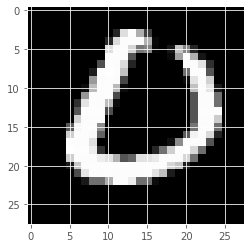

True label of the test sample 1025: 8
Predicted label of test sample 1025: 8
Epistemic uncertainty: 4.008e-06


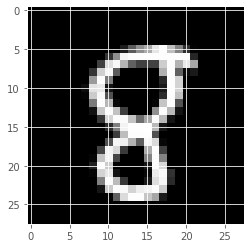

True label of the test sample 2534: 7
Predicted label of test sample 2534: 7
Epistemic uncertainty: 4.328e-06


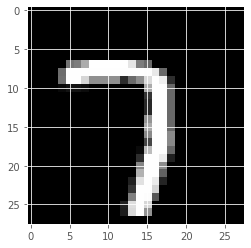

True label of the test sample 256: 8
Predicted label of test sample 256: 8
Epistemic uncertainty: 4.355e-06


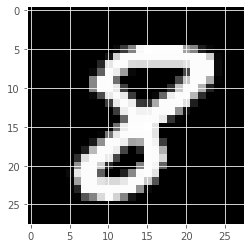

True label of the test sample 3035: 0
Predicted label of test sample 3035: 0
Epistemic uncertainty: 4.851e-06


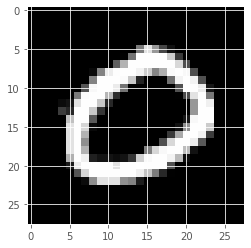

True label of the test sample 2269: 7
Predicted label of test sample 2269: 7
Epistemic uncertainty: 4.865e-06


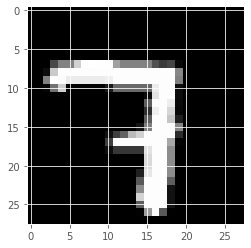

True label of the test sample 1275: 7
Predicted label of test sample 1275: 7
Epistemic uncertainty: 5.001e-06


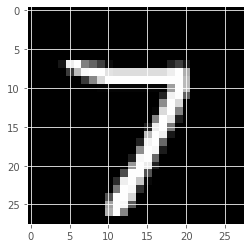

True label of the test sample 2909: 8
Predicted label of test sample 2909: 8
Epistemic uncertainty: 5.167e-06


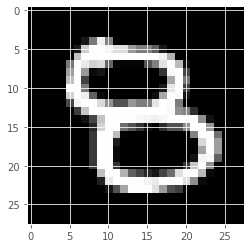

True label of the test sample 1439: 8
Predicted label of test sample 1439: 8
Epistemic uncertainty: 5.297e-06


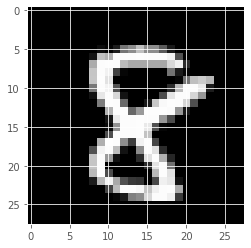

In [ ]:
show_epistemic(mc_cnn_epistemic[0], mc_cnn_ensemble_pred, highest=False)

#### Epistemic part 2

True label of the test sample 1809: 7
Predicted label of test sample 1809: 8
Epistemic uncertainty: 0.1985


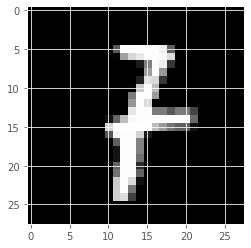

True label of the test sample 2868: 0
Predicted label of test sample 2868: 8
Epistemic uncertainty: 0.1863


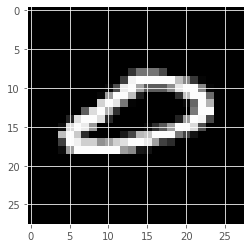

True label of the test sample 722: 8
Predicted label of test sample 722: 7
Epistemic uncertainty: 0.1855


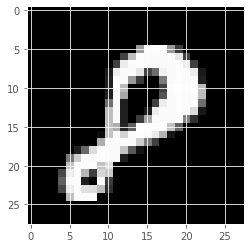

True label of the test sample 3248: 7
Predicted label of test sample 3248: 7
Epistemic uncertainty: 0.1787


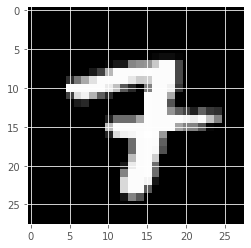

True label of the test sample 2143: 7
Predicted label of test sample 2143: 7
Epistemic uncertainty: 0.174


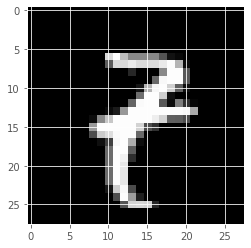

True label of the test sample 936: 7
Predicted label of test sample 936: 7
Epistemic uncertainty: 0.1703


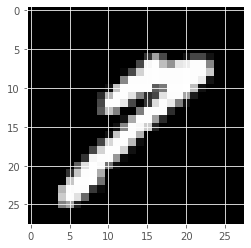

True label of the test sample 518: 7
Predicted label of test sample 518: 7
Epistemic uncertainty: 0.1696


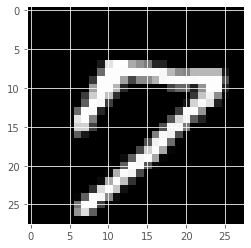

True label of the test sample 3003: 7
Predicted label of test sample 3003: 7
Epistemic uncertainty: 0.1694


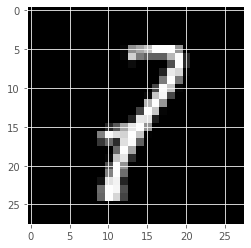

True label of the test sample 2556: 8
Predicted label of test sample 2556: 8
Epistemic uncertainty: 0.1688


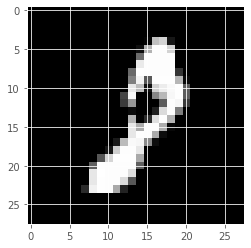

True label of the test sample 470: 0
Predicted label of test sample 470: 0
Epistemic uncertainty: 0.1642


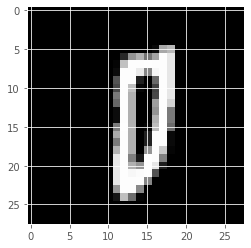

True label of the test sample 2467: 7
Predicted label of test sample 2467: 7
Epistemic uncertainty: 0.1634


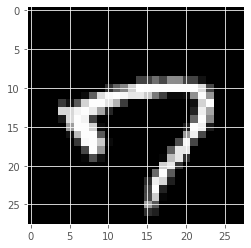

True label of the test sample 455: 7
Predicted label of test sample 455: 7
Epistemic uncertainty: 0.163


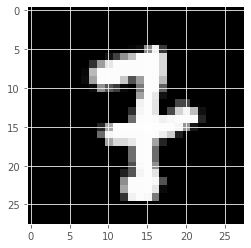

True label of the test sample 2365: 7
Predicted label of test sample 2365: 7
Epistemic uncertainty: 0.1624


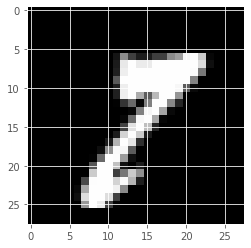

True label of the test sample 278: 0
Predicted label of test sample 278: 8
Epistemic uncertainty: 0.1614


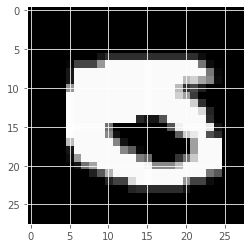

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.1597


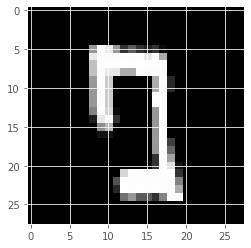

True label of the test sample 349: 1
Predicted label of test sample 349: 1
Epistemic uncertainty: 0.1584


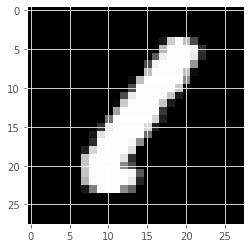

True label of the test sample 766: 8
Predicted label of test sample 766: 8
Epistemic uncertainty: 0.1577


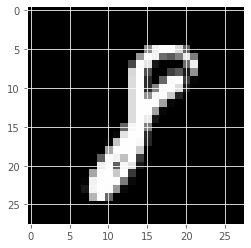

True label of the test sample 2095: 0
Predicted label of test sample 2095: 0
Epistemic uncertainty: 0.157


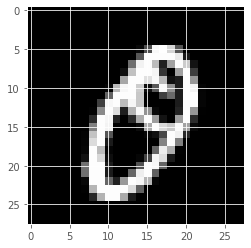

True label of the test sample 1870: 7
Predicted label of test sample 1870: 7
Epistemic uncertainty: 0.156


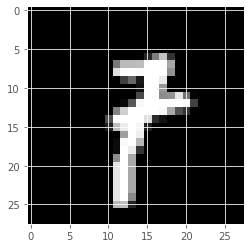

True label of the test sample 3290: 7
Predicted label of test sample 3290: 7
Epistemic uncertainty: 0.1559


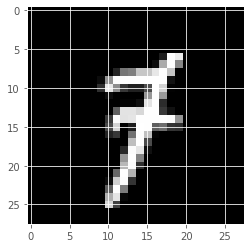

In [ ]:
show_epistemic(mc_cnn_epistemic[1], mc_cnn_ensemble_pred)

True label of the test sample 2760: 8
Predicted label of test sample 2760: 8
Epistemic uncertainty: 2.75e-07


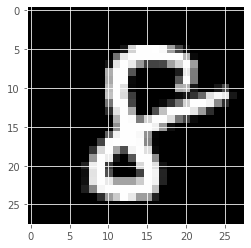

True label of the test sample 50: 7
Predicted label of test sample 50: 7
Epistemic uncertainty: 4.093e-07


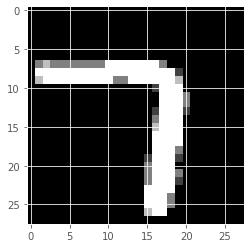

True label of the test sample 3451: 8
Predicted label of test sample 3451: 8
Epistemic uncertainty: 4.657e-07


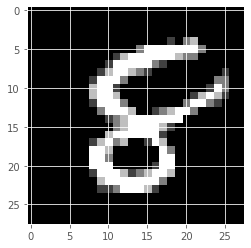

True label of the test sample 906: 0
Predicted label of test sample 906: 0
Epistemic uncertainty: 7.416e-07


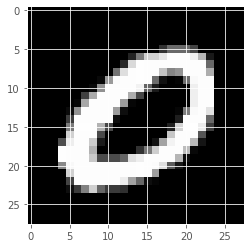

True label of the test sample 1585: 0
Predicted label of test sample 1585: 0
Epistemic uncertainty: 1.035e-06


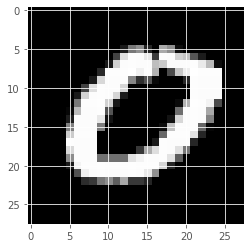

True label of the test sample 1446: 8
Predicted label of test sample 1446: 8
Epistemic uncertainty: 1.294e-06


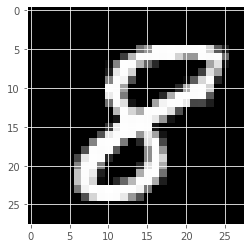

True label of the test sample 1560: 7
Predicted label of test sample 1560: 7
Epistemic uncertainty: 1.509e-06


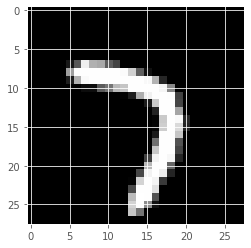

True label of the test sample 696: 7
Predicted label of test sample 696: 7
Epistemic uncertainty: 1.614e-06


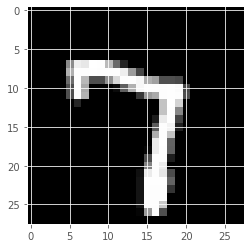

True label of the test sample 3192: 0
Predicted label of test sample 3192: 0
Epistemic uncertainty: 1.712e-06


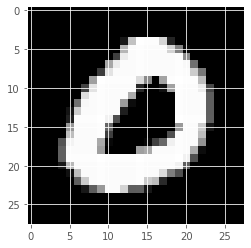

True label of the test sample 63: 0
Predicted label of test sample 63: 0
Epistemic uncertainty: 1.856e-06


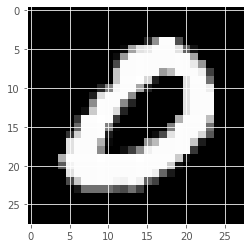

True label of the test sample 2066: 0
Predicted label of test sample 2066: 0
Epistemic uncertainty: 1.909e-06


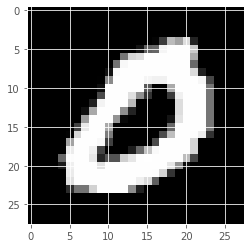

True label of the test sample 2699: 0
Predicted label of test sample 2699: 0
Epistemic uncertainty: 2.177e-06


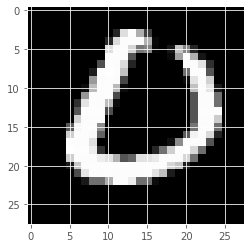

True label of the test sample 1025: 8
Predicted label of test sample 1025: 8
Epistemic uncertainty: 2.363e-06


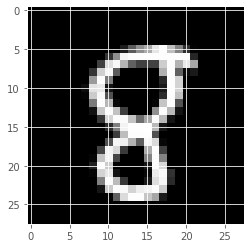

True label of the test sample 2534: 7
Predicted label of test sample 2534: 7
Epistemic uncertainty: 2.455e-06


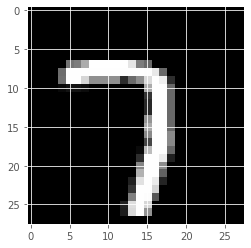

True label of the test sample 256: 8
Predicted label of test sample 256: 8
Epistemic uncertainty: 2.49e-06


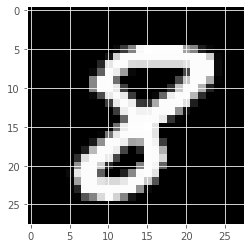

True label of the test sample 2269: 7
Predicted label of test sample 2269: 7
Epistemic uncertainty: 2.881e-06


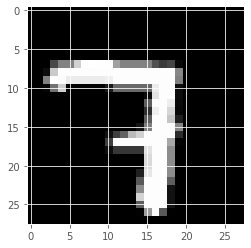

True label of the test sample 1275: 7
Predicted label of test sample 1275: 7
Epistemic uncertainty: 2.917e-06


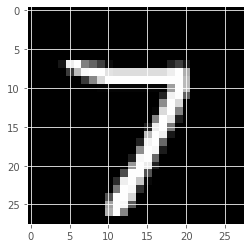

True label of the test sample 3035: 0
Predicted label of test sample 3035: 0
Epistemic uncertainty: 2.926e-06


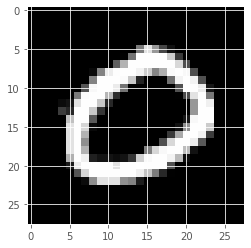

True label of the test sample 3310: 7
Predicted label of test sample 3310: 7
Epistemic uncertainty: 2.944e-06


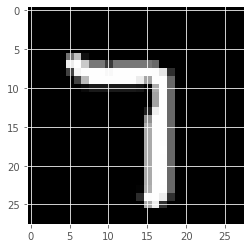

True label of the test sample 1836: 7
Predicted label of test sample 1836: 7
Epistemic uncertainty: 2.959e-06


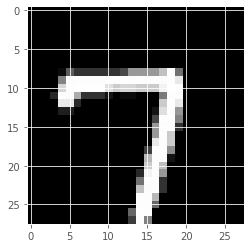

In [ ]:
show_epistemic(mc_cnn_epistemic[1], mc_cnn_ensemble_pred, highest=False)

#### Epistemic part 3

True label of the test sample 2556: 8
Predicted label of test sample 2556: 8
Epistemic uncertainty: 1.162


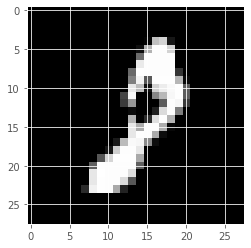

True label of the test sample 470: 0
Predicted label of test sample 470: 0
Epistemic uncertainty: 1.074


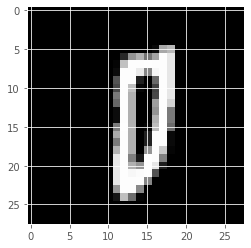

True label of the test sample 3003: 7
Predicted label of test sample 3003: 7
Epistemic uncertainty: 1.068


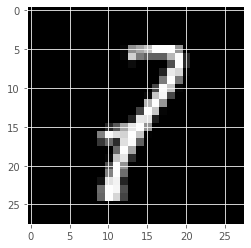

True label of the test sample 936: 7
Predicted label of test sample 936: 7
Epistemic uncertainty: 1.041


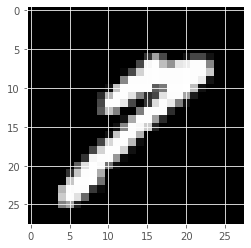

True label of the test sample 2172: 8
Predicted label of test sample 2172: 1
Epistemic uncertainty: 1.003


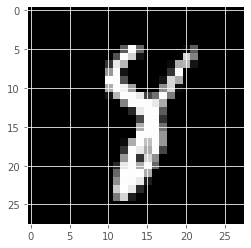

True label of the test sample 2365: 7
Predicted label of test sample 2365: 7
Epistemic uncertainty: 0.9804


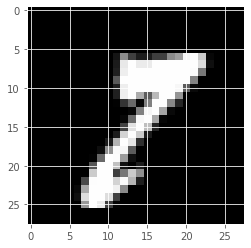

True label of the test sample 767: 1
Predicted label of test sample 767: 7
Epistemic uncertainty: 0.965


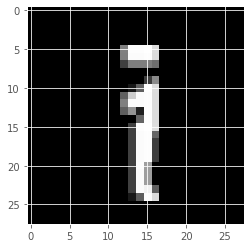

True label of the test sample 766: 8
Predicted label of test sample 766: 8
Epistemic uncertainty: 0.9396


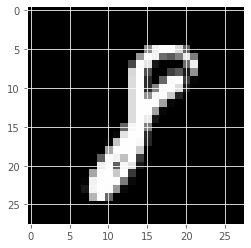

True label of the test sample 1809: 7
Predicted label of test sample 1809: 8
Epistemic uncertainty: 0.9226


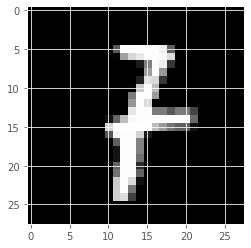

True label of the test sample 2868: 0
Predicted label of test sample 2868: 8
Epistemic uncertainty: 0.8479


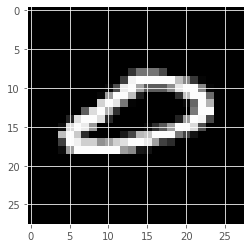

True label of the test sample 1331: 0
Predicted label of test sample 1331: 8
Epistemic uncertainty: 0.8428


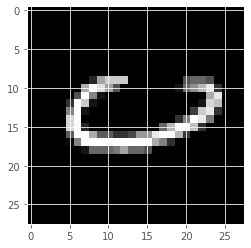

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.8269


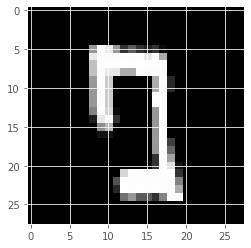

True label of the test sample 727: 1
Predicted label of test sample 727: 1
Epistemic uncertainty: 0.8069


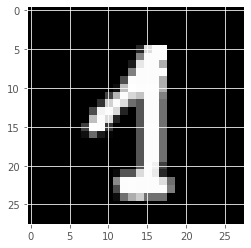

True label of the test sample 343: 1
Predicted label of test sample 343: 1
Epistemic uncertainty: 0.8062


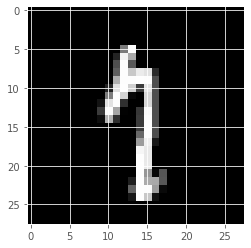

True label of the test sample 3170: 8
Predicted label of test sample 3170: 8
Epistemic uncertainty: 0.7959


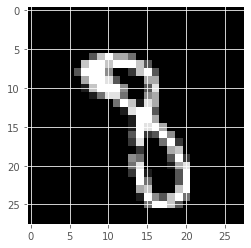

True label of the test sample 3276: 7
Predicted label of test sample 3276: 7
Epistemic uncertainty: 0.7914


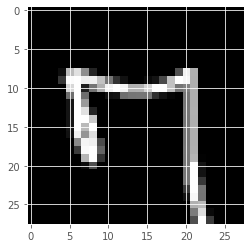

True label of the test sample 1540: 1
Predicted label of test sample 1540: 1
Epistemic uncertainty: 0.779


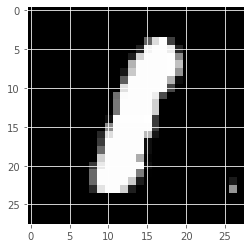

True label of the test sample 1704: 1
Predicted label of test sample 1704: 8
Epistemic uncertainty: 0.7773


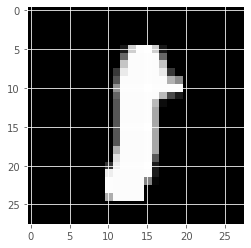

True label of the test sample 782: 8
Predicted label of test sample 782: 8
Epistemic uncertainty: 0.7675


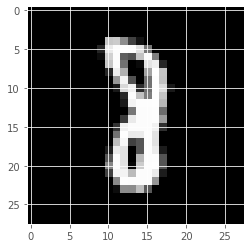

True label of the test sample 518: 7
Predicted label of test sample 518: 7
Epistemic uncertainty: 0.7583


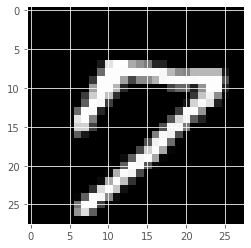

In [ ]:
show_epistemic(mc_cnn_epistemic[2], mc_cnn_ensemble_pred)

True label of the test sample 50: 7
Predicted label of test sample 50: 7
Epistemic uncertainty: 2.595e-06


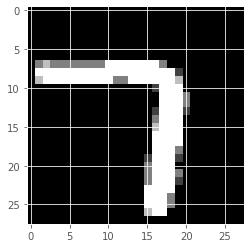

True label of the test sample 2760: 8
Predicted label of test sample 2760: 8
Epistemic uncertainty: 2.851e-06


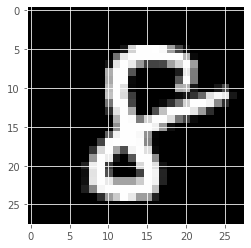

True label of the test sample 3451: 8
Predicted label of test sample 3451: 8
Epistemic uncertainty: 3.882e-06


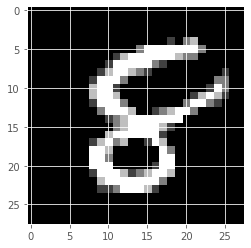

True label of the test sample 1585: 0
Predicted label of test sample 1585: 0
Epistemic uncertainty: 6.929e-06


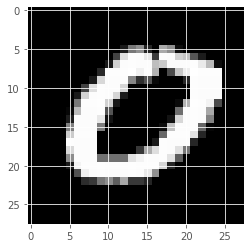

True label of the test sample 906: 0
Predicted label of test sample 906: 0
Epistemic uncertainty: 7.05e-06


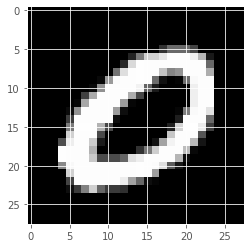

True label of the test sample 1446: 8
Predicted label of test sample 1446: 8
Epistemic uncertainty: 7.959e-06


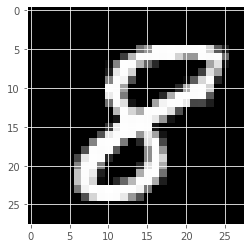

True label of the test sample 63: 0
Predicted label of test sample 63: 0
Epistemic uncertainty: 1.134e-05


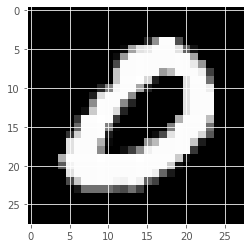

True label of the test sample 2066: 0
Predicted label of test sample 2066: 0
Epistemic uncertainty: 1.429e-05


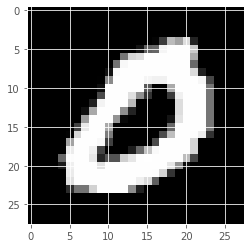

True label of the test sample 11: 7
Predicted label of test sample 11: 7
Epistemic uncertainty: 1.494e-05


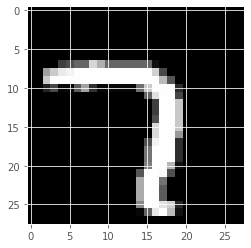

True label of the test sample 3192: 0
Predicted label of test sample 3192: 0
Epistemic uncertainty: 1.538e-05


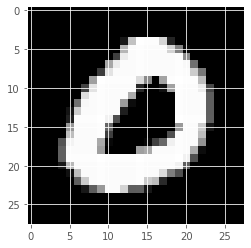

True label of the test sample 3035: 0
Predicted label of test sample 3035: 0
Epistemic uncertainty: 1.666e-05


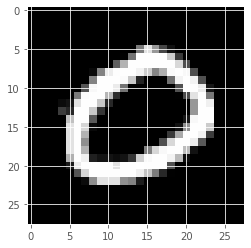

True label of the test sample 696: 7
Predicted label of test sample 696: 7
Epistemic uncertainty: 1.67e-05


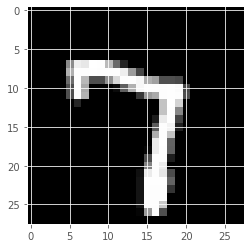

True label of the test sample 1275: 7
Predicted label of test sample 1275: 7
Epistemic uncertainty: 1.785e-05


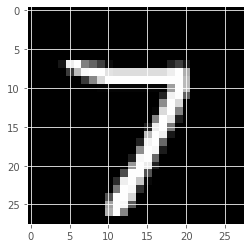

True label of the test sample 2699: 0
Predicted label of test sample 2699: 0
Epistemic uncertainty: 1.814e-05


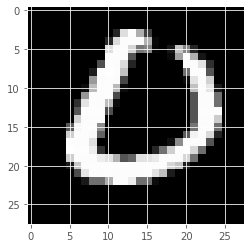

True label of the test sample 1560: 7
Predicted label of test sample 1560: 7
Epistemic uncertainty: 2.14e-05


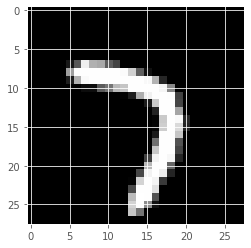

True label of the test sample 517: 0
Predicted label of test sample 517: 0
Epistemic uncertainty: 2.158e-05


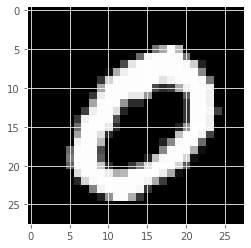

True label of the test sample 1439: 8
Predicted label of test sample 1439: 8
Epistemic uncertainty: 2.16e-05


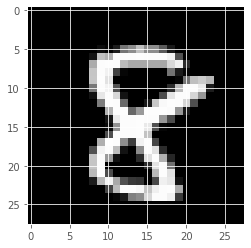

True label of the test sample 1952: 8
Predicted label of test sample 1952: 8
Epistemic uncertainty: 2.171e-05


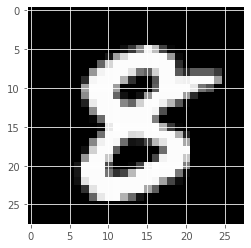

True label of the test sample 1228: 0
Predicted label of test sample 1228: 0
Epistemic uncertainty: 2.254e-05


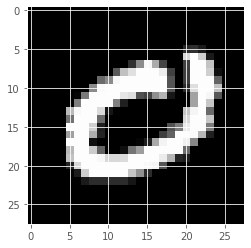

True label of the test sample 3050: 8
Predicted label of test sample 3050: 8
Epistemic uncertainty: 2.258e-05


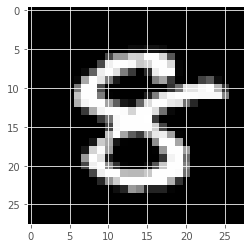

In [ ]:
show_epistemic(mc_cnn_epistemic[2], mc_cnn_ensemble_pred, highest=False)

#### Comparing epistemic

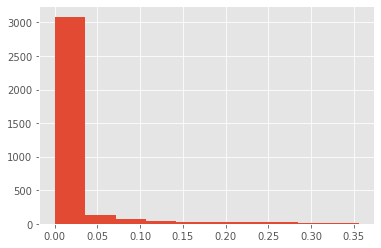

In [ ]:
plt.hist(mc_cnn_epistemic[0])
plt.show()

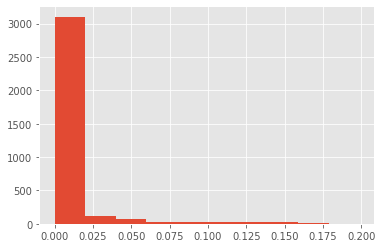

In [ ]:
plt.hist(mc_cnn_epistemic[1])
plt.show()

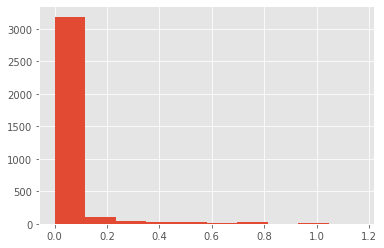

In [ ]:
plt.hist(mc_cnn_epistemic[2])
plt.show()

## ALEATORIC

### Hyperparameters

In [20]:
num_classes = 4
input_shape = (28, 28, 1)
T = 30
loss_fn = bayesian_categorical_crossentropy(T=T, num_classes=num_classes)

epochs = 20
batch_size = 256
dropout_p = 0.0
learning_rate = 0.01
dropout_p = 0.0

### Model fitting

In [21]:
"""alea_model_cnn = model_creator(act="relu", dropout_prob=dropout_p,
                             learning_rate=learning_rate,
                             include_logvar=True, loss=loss_fn)
alea_model_cnn.summary()"""

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 28, 28, 64)        640       
_________________________________________________________________
activation_6 (Activation)    (None, 28, 28, 64)        0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 26, 26, 64)        36928     
_________________________________________________________________
activation_7 (Activation)    (None, 26, 26, 64)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 26, 26, 64)        0   

In [22]:
"""alea_cnn_history = alea_model_cnn.fit(X_mnist_train, y_mnist_train, 
                               validation_data=(X_mnist_test, y_mnist_test),
                              batch_size=batch_size, epochs=epochs, verbose=1)"""

Epoch 1/20
41/41 [==============================] - 6s 137ms/step - loss: 0.2962 - accuracy: 0.9076 - val_loss: 0.0551 - val_accuracy: 0.9795
Epoch 2/20
41/41 [==============================] - 5s 127ms/step - loss: 0.0271 - accuracy: 0.9905 - val_loss: 0.0240 - val_accuracy: 0.9916
Epoch 3/20
41/41 [==============================] - 6s 135ms/step - loss: 0.0186 - accuracy: 0.9928 - val_loss: 0.0378 - val_accuracy: 0.9878
Epoch 4/20
41/41 [==============================] - 6s 135ms/step - loss: 0.0139 - accuracy: 0.9953 - val_loss: 0.0292 - val_accuracy: 0.9902
Epoch 5/20
41/41 [==============================] - 5s 127ms/step - loss: 0.0083 - accuracy: 0.9970 - val_loss: 0.0267 - val_accuracy: 0.9933
Epoch 6/20
41/41 [==============================] - 6s 136ms/step - loss: 0.0035 - accuracy: 0.9985 - val_loss: 0.0558 - val_accuracy: 0.9881
Epoch 7/20
41/41 [==============================] - 5s 127ms/step - loss: 0.0054 - accuracy: 0.9976 - val_loss: 0.0367 - val_accuracy: 0.9907
Epoch 

In [ ]:
"""save_model(model=alea_model_cnn, batch_size=batch_size, 
           n_epochs=epochs, descr="alea_model_mnist", 
           dropout=None, learning_rate=learning_rate)"""

In [ ]:
alea_model_cnn = tf.keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_trained_models/model_alea_model_mnist_batchsize256_nepoch20_learningrate10.0.h5",
                                          custom_objects={"bayesian_categorical_crossentropy_internal": bayesian_categorical_crossentropy})

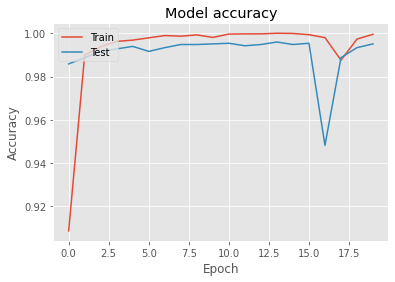

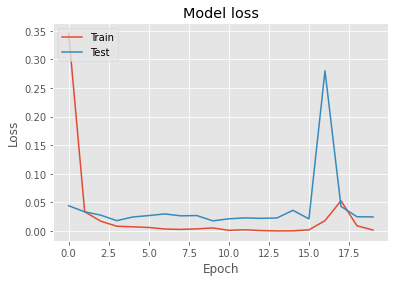

In [ ]:
"""loss_accuracy_plot(alea_cnn_history)"""

In [ ]:
"""loss_alea_cnn_eval, accuracy_alea_cnn_eval = alea_model_cnn.evaluate(X_mnist_test, y_mnist_test, verbose=0)
print(f"Eval loss = {loss_alea_cnn_eval}, Eval accuracy = {accuracy_alea_cnn_eval}")"""

Eval loss = 0.024604033678770065, Eval accuracy = 0.9950810074806213


### Examples

In [ ]:
pred_class_alea_cnn, sigmas_alea_cnn = cal_aleatoric(alea_model_cnn)

In [ ]:
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
sigmas_alea_cnn = loadtxt(fp+'/alea_mnist.csv', delimiter=',')

In [ ]:
"""fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
savetxt(fp + '/alea_mnist.csv', sigmas_alea_cnn, delimiter=',')"""

True label of the test sample 1482: 7
Predicted label of test sample 1482: 7
Aleatoric uncertainty: 0.004896


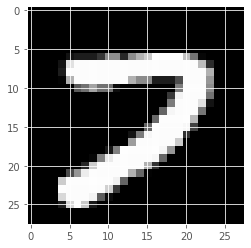

True label of the test sample 2033: 7
Predicted label of test sample 2033: 7
Aleatoric uncertainty: 0.004124


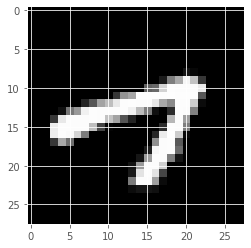

True label of the test sample 1989: 7
Predicted label of test sample 1989: 7
Aleatoric uncertainty: 0.00277


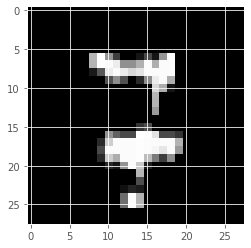

True label of the test sample 629: 0
Predicted label of test sample 629: 0
Aleatoric uncertainty: 0.001109


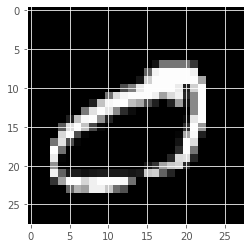

True label of the test sample 1479: 0
Predicted label of test sample 1479: 0
Aleatoric uncertainty: 0.001041


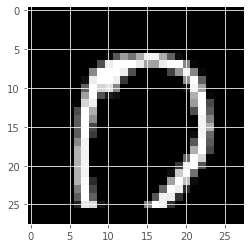

True label of the test sample 1077: 7
Predicted label of test sample 1077: 7
Aleatoric uncertainty: 0.0008467


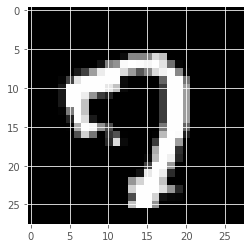

True label of the test sample 3399: 7
Predicted label of test sample 3399: 7
Aleatoric uncertainty: 0.0007925


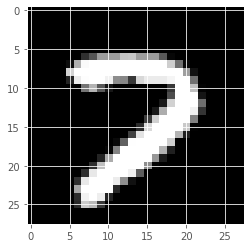

True label of the test sample 2868: 0
Predicted label of test sample 2868: 7
Aleatoric uncertainty: 0.0007824


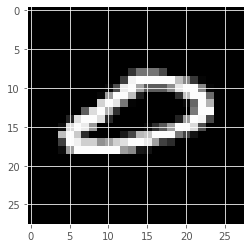

True label of the test sample 528: 7
Predicted label of test sample 528: 7
Aleatoric uncertainty: 0.0007796


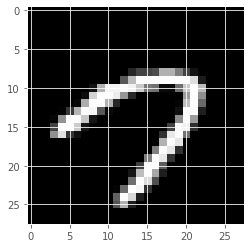

True label of the test sample 1842: 7
Predicted label of test sample 1842: 7
Aleatoric uncertainty: 0.0006924


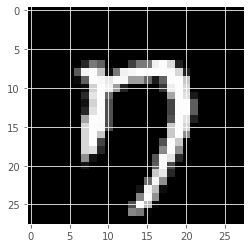

True label of the test sample 3292: 7
Predicted label of test sample 3292: 7
Aleatoric uncertainty: 0.000603


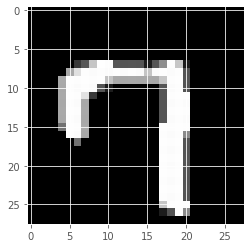

True label of the test sample 66: 7
Predicted label of test sample 66: 7
Aleatoric uncertainty: 0.0005596


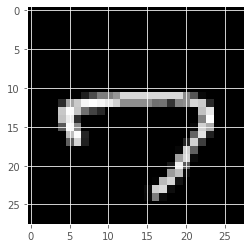

True label of the test sample 2728: 7
Predicted label of test sample 2728: 7
Aleatoric uncertainty: 0.0005401


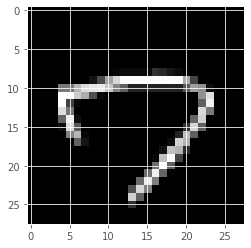

True label of the test sample 148: 7
Predicted label of test sample 148: 7
Aleatoric uncertainty: 0.0004845


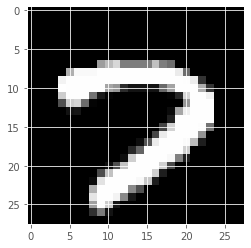

True label of the test sample 2467: 7
Predicted label of test sample 2467: 7
Aleatoric uncertainty: 0.0004273


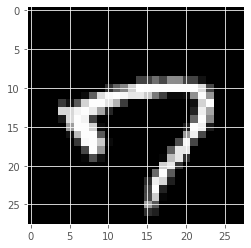

True label of the test sample 742: 7
Predicted label of test sample 742: 7
Aleatoric uncertainty: 0.000295


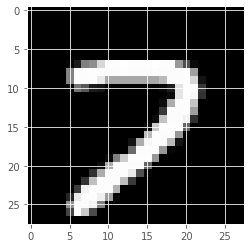

True label of the test sample 2747: 7
Predicted label of test sample 2747: 7
Aleatoric uncertainty: 0.0002849


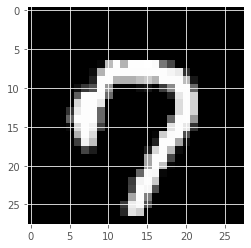

True label of the test sample 1388: 7
Predicted label of test sample 1388: 7
Aleatoric uncertainty: 0.0002303


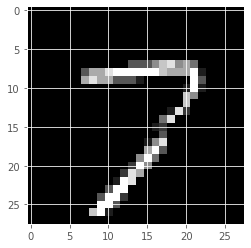

True label of the test sample 1861: 0
Predicted label of test sample 1861: 0
Aleatoric uncertainty: 0.0001958


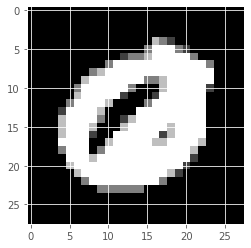

True label of the test sample 1331: 0
Predicted label of test sample 1331: 7
Aleatoric uncertainty: 0.0001943


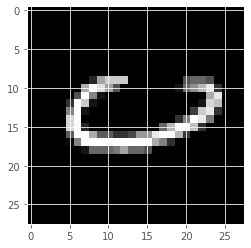

In [ ]:
show_aleatoric(sigmas_alea_cnn, pred_class_alea_cnn)

True label of the test sample 995: 1
Predicted label of test sample 995: 1
Aleatoric uncertainty: 2.117e-33


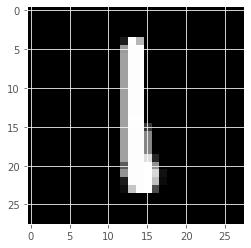

True label of the test sample 2020: 1
Predicted label of test sample 2020: 1
Aleatoric uncertainty: 2.562e-33


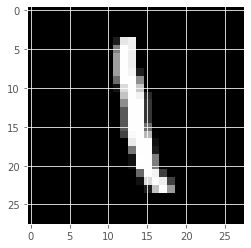

True label of the test sample 567: 1
Predicted label of test sample 567: 1
Aleatoric uncertainty: 2.745e-33


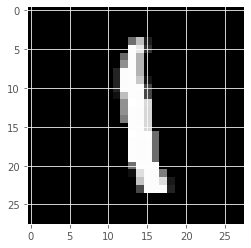

True label of the test sample 15: 1
Predicted label of test sample 15: 1
Aleatoric uncertainty: 2.524e-32


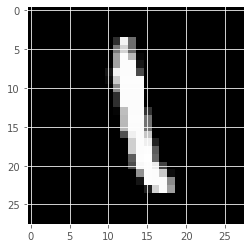

True label of the test sample 35: 1
Predicted label of test sample 35: 1
Aleatoric uncertainty: 9.471e-32


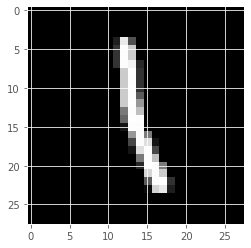

True label of the test sample 2351: 1
Predicted label of test sample 2351: 1
Aleatoric uncertainty: 9.772e-32


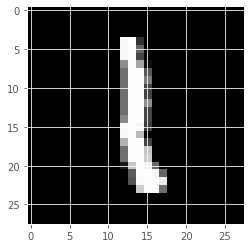

True label of the test sample 234: 1
Predicted label of test sample 234: 1
Aleatoric uncertainty: 3.486e-31


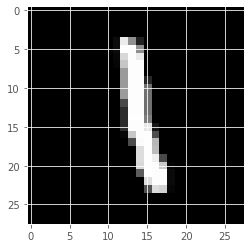

True label of the test sample 2822: 1
Predicted label of test sample 2822: 1
Aleatoric uncertainty: 3.756e-31


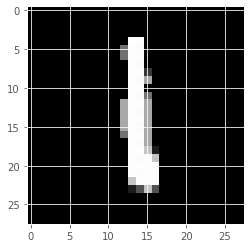

True label of the test sample 2778: 1
Predicted label of test sample 2778: 1
Aleatoric uncertainty: 5.216e-31


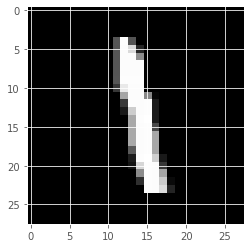

True label of the test sample 320: 1
Predicted label of test sample 320: 1
Aleatoric uncertainty: 5.457e-31


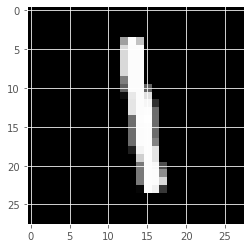

True label of the test sample 2604: 1
Predicted label of test sample 2604: 1
Aleatoric uncertainty: 6.595e-31


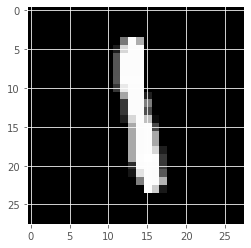

True label of the test sample 3098: 1
Predicted label of test sample 3098: 1
Aleatoric uncertainty: 7.029e-31


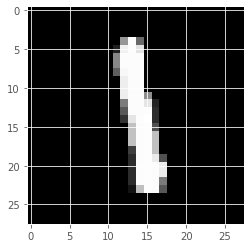

True label of the test sample 2468: 1
Predicted label of test sample 2468: 1
Aleatoric uncertainty: 7.27e-31


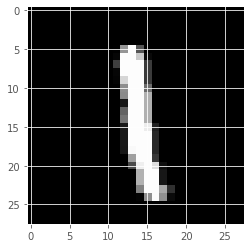

True label of the test sample 3260: 1
Predicted label of test sample 3260: 1
Aleatoric uncertainty: 7.325e-31


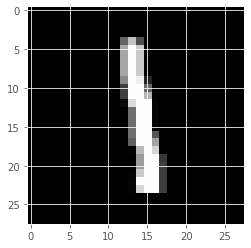

True label of the test sample 2306: 1
Predicted label of test sample 2306: 1
Aleatoric uncertainty: 4.142e-30


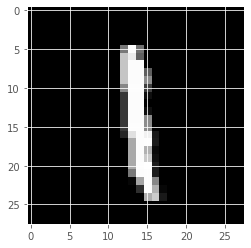

True label of the test sample 1631: 1
Predicted label of test sample 1631: 1
Aleatoric uncertainty: 5.654e-30


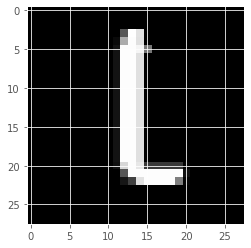

True label of the test sample 3291: 1
Predicted label of test sample 3291: 1
Aleatoric uncertainty: 8.636e-30


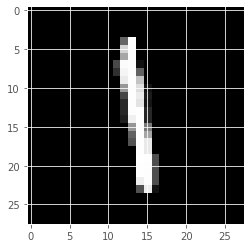

True label of the test sample 2559: 1
Predicted label of test sample 2559: 1
Aleatoric uncertainty: 1.223e-29


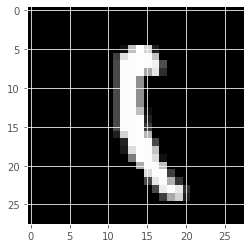

True label of the test sample 1374: 1
Predicted label of test sample 1374: 1
Aleatoric uncertainty: 1.288e-29


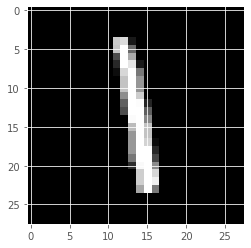

True label of the test sample 3333: 1
Predicted label of test sample 3333: 1
Aleatoric uncertainty: 1.735e-29


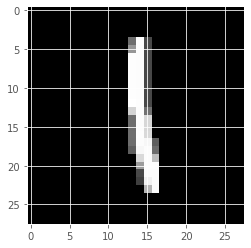

In [ ]:
show_aleatoric(sigmas_alea_cnn, pred_class_alea_cnn, highest=False)

<function matplotlib.pyplot.show>

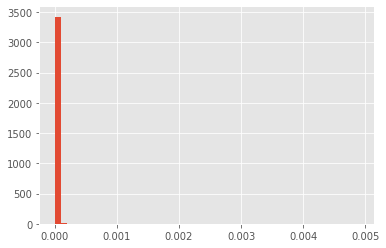

In [ ]:
plt.hist(sigmas_alea_cnn, bins=50)
plt.show

### Confusion matrix

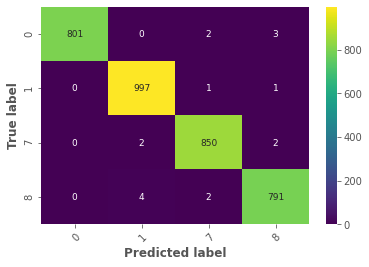

In [ ]:
converted_pred = [class_converter(i) for i in pred_class_alea_cnn]
conf = confusion_matrix(y_mnist_test_original, converted_pred)
plot_confusion_matrix(conf, [0,1,7,8])

### Loss attenuation?

Gal et al. argue that with the provided loss function, the loss for wrongly classified samples is attenuated by giving these predictions high aleatoric uncertainties 

How many wrongly classified images are among the n predictions with aleatoric uncertainty?



In [ ]:
def loss_att_check(sigmas, predicted_class, highest=True, n_alea=20,
                   x_data=X_mnist_test):
  #fig, axs = plt.subplots(4, 5, figsize=(8,8)) 
  if highest == True:
    alea_idx = sigmas.argsort()[::-1]
  if highest == False:
    alea_idx = sigmas.argsort()
  # only consider n top aleatoric indices 
  alea_idx = alea_idx[:n_alea]
  # convert predicted 0,1,2,3 to 0,1,7,8
  converted_pred = np.array([class_converter(i) for i in predicted_class])
  # number and idx of missclassified
  n_wrongclass_highalea = sum(converted_pred[alea_idx] != np.array(y_mnist_test_original)[alea_idx])
  wrongclass_highalea_idx = np.where(converted_pred[alea_idx] != np.array(y_mnist_test_original)[alea_idx])[0]
  # true and predicted labsl of missclassified
  pred_label = (converted_pred[alea_idx])[wrongclass_highalea_idx]
  true_label = (np.array(y_mnist_test_original)[alea_idx])[wrongclass_highalea_idx]
  return n_wrongclass_highalea, alea_idx[wrongclass_highalea_idx], true_label, pred_label

In [ ]:
converted_pred = np.array([class_converter(i) for i in pred_class_alea_cnn])
print("number of misclassified samples: ", 
      sum(converted_pred != np.array(y_mnist_test_original)))

number of misclassified samples:  17


In [ ]:
(n_wrongclass_highalea, alea_idx, 
 true_label, pred_label) = loss_att_check(sigmas_alea_cnn, pred_class_alea_cnn,
                            n_alea=518) #n_alea=2953)

print(n_wrongclass_highalea, alea_idx, true_label, pred_label)

4 [2868 1331 1176  722] [0 0 7 8] [7 7 8 7]


In [ ]:
n_wrongclass_highalea / 17

0.23529411764705882

In [ ]:
518/3456

0.14988425925925927

in the predictions with the lowest 15% (503/3456) of aleatoric uncertainties, no missclassification appears. In the 15% of highest aleatoric predictions, 45% of all missclassification (9/503) are found

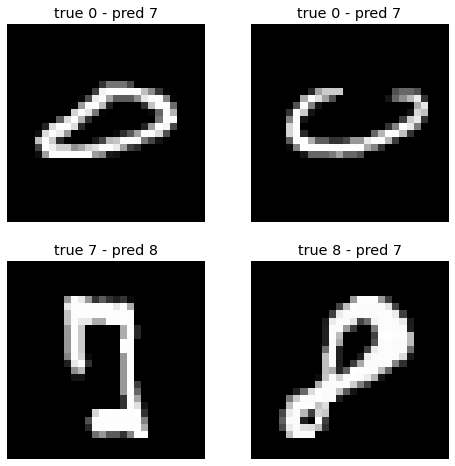

In [ ]:
# plot the missclassified images among the 503 highest aleatoric uncertainty predictions
fig, axs = plt.subplots(2, 2, figsize=(8,8)) 
for idx, ax, true, pred in zip(alea_idx, axs.reshape(-1), true_label, pred_label):
    ax.imshow(X_mnist_test[idx, :, :, 0], cmap='gist_gray')
    ax.axis('off')
    ax.title.set_text(f'true {true} - pred {pred}')
  #fig.suptitle("Main Title")
plt.show()

## EPISTEMIC & ALEATORIC

### Hyperparameters

In [24]:
num_classes = 4
input_shape = (28, 28, 1)
T = 30
loss_fn = bayesian_categorical_crossentropy(T=T, num_classes=num_classes)

epochs = 20
batch_size = 256
dropout_p = 0.0
learning_rate = 0.01
dropout_p = 0.25

### Model fitting

In [25]:
"""total_mc_cnn_model = model_creator(act="relu", dropout_prob=dropout_p, 
                           loss=loss_fn, include_logvar=True,
                           learning_rate=learning_rate)
total_mc_cnn_model.summary()"""

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 28, 28, 64)        640       
_________________________________________________________________
activation_9 (Activation)    (None, 28, 28, 64)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 26, 26, 64)        36928     
_________________________________________________________________
activation_10 (Activation)   (None, 26, 26, 64)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 26, 26, 64)        0   

In [26]:
"""total_mc_cnn_history = total_mc_cnn_model.fit(X_mnist_train, y_mnist_train, 
                               validation_data=(X_mnist_test, y_mnist_test),
                              batch_size=batch_size, epochs=epochs, verbose=1)"""

Epoch 1/20
41/41 [==============================] - 5s 134ms/step - loss: 1.1705 - accuracy: 0.8789 - val_loss: 0.6955 - val_accuracy: 0.9754
Epoch 2/20
41/41 [==============================] - 6s 140ms/step - loss: 0.4499 - accuracy: 0.9858 - val_loss: 0.3071 - val_accuracy: 0.9847
Epoch 3/20
41/41 [==============================] - 5s 132ms/step - loss: 0.2386 - accuracy: 0.9877 - val_loss: 0.2096 - val_accuracy: 0.9835
Epoch 4/20
41/41 [==============================] - 6s 139ms/step - loss: 0.1795 - accuracy: 0.9891 - val_loss: 0.1631 - val_accuracy: 0.9858
Epoch 5/20
41/41 [==============================] - 6s 140ms/step - loss: 0.1256 - accuracy: 0.9920 - val_loss: 0.1224 - val_accuracy: 0.9896
Epoch 6/20
41/41 [==============================] - 5s 134ms/step - loss: 0.1279 - accuracy: 0.9867 - val_loss: 0.1343 - val_accuracy: 0.9881
Epoch 7/20
41/41 [==============================] - 6s 140ms/step - loss: 0.1167 - accuracy: 0.9901 - val_loss: 0.1155 - val_accuracy: 0.9867
Epoch 

In [ ]:
"""save_model(model=total_mc_cnn_model, batch_size=batch_size, 
           n_epochs=epochs, descr="total_mc_model_mnist",
           learning_rate=learning_rate, 
           dropout=dropout_p)"""

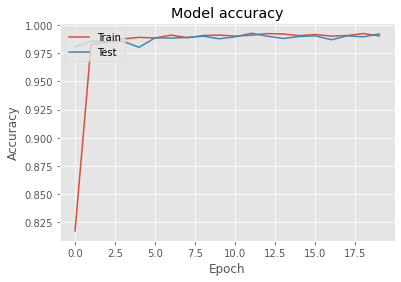

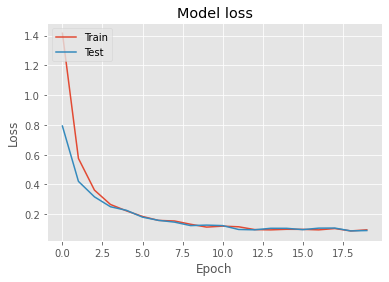

In [ ]:
"""loss_accuracy_plot(total_mc_cnn_history)"""

In [ ]:
total_mc_cnn_model = tf.keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_trained_models/model_total_mc_model_mnist_batchsize256_nepoch20_dropout25.0_learningrate10.0.h5",
                                          custom_objects={"bayesian_categorical_crossentropy_internal": bayesian_categorical_crossentropy})

In [31]:
"""loss_mc_total_cnn_eval, accuracy_mc_total_cnn_eval = total_mc_cnn_model.evaluate(X_mnist_test, y_mnist_test, verbose=0)
print(f"Eval loss = {loss_mc_total_cnn_eval}, Eval accuracy = {accuracy_mc_total_cnn_eval}")"""

Eval loss = 0.07579811662435532, Eval accuracy = 0.9913194179534912


#### Save all accuracies and losses so far

In [28]:
all_accuracy = [accuracy_orig_eval_cnn, accuracy_mc_eval_cnn,
                accuracy_alea_cnn_eval, accuracy_mc_total_cnn_eval]

all_loss = [loss_orig_eval_cnn, loss_mc_eval_cnn,
            loss_alea_cnn_eval, loss_mc_total_cnn_eval]

print(all_accuracy)
print(all_loss)

[0.9942129850387573, 0.9921875, 0.9936342835426331, 0.9921875]
[0.035504862666130066, 0.0731218159198761, 0.028985336422920227, 0.07400542497634888]


In [30]:
from numpy import savetxt
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_accuracy_loss"
savetxt(fp + '/all_accuracy_mnist.csv', all_accuracy, delimiter=',')
savetxt(fp + '/all_loss_mnist.csv', all_loss, delimiter=',')

### Examples

Firstly, we're creating a slightly amended ```make_predictions``` function, since in now the outputs are logits rather than softmax as before

In [ ]:
import tqdm
def make_predictions_softmax(model, n_pred=100, val_data=X_mnist_test):
  class_predictions = []
  for i in tqdm.tqdm(range(n_pred)):
      full_prediction = model(val_data)
      y_p = tf.keras.activations.softmax(full_prediction[:,:4]).numpy()
      class_predictions.append(y_p)
  return class_predictions

In [ ]:
mc_total_cnn_predictions = make_predictions_softmax(total_mc_cnn_model)
mc_total_cnn_ensemble_pred, mc_total_cnn_ensemble_acc = ensemble_pred(mc_total_cnn_predictions)
mc_total_cnn_y_mean, mc_total_cnn_y_std, mc_total_cnn_epistemic = cal_epistemic(mc_total_cnn_predictions)

100%|██████████| 100/100 [00:08<00:00, 12.35it/s]

MC-ensemble accuracy: 99.4%


In [ ]:
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
mc_total_cnn_epistemic = loadtxt(fp+'/mc_epistemic_total_mnist.csv', delimiter=',')

In [ ]:
"""fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
savetxt(fp + '/mc_epistemic_total_mnist.csv', mc_total_cnn_epistemic, delimiter=',')"""

#### Confusion matrix

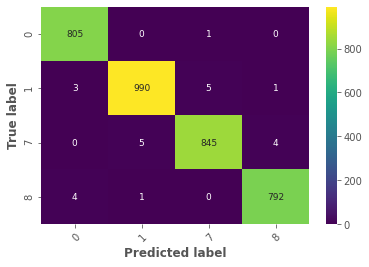

In [ ]:
pred = np.argmax(mc_total_cnn_y_mean, axis=1)
converted_pred = [class_converter(i) for i in pred]
conf = confusion_matrix(y_mnist_test_original, converted_pred)
plot_confusion_matrix(conf, [0,1,7,8])

#### Epistemic part 1

True label of the test sample 3172: 8
Predicted label of test sample 3172: 8
Epistemic uncertainty: 0.3482


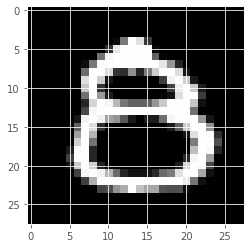

True label of the test sample 2282: 7
Predicted label of test sample 2282: 7
Epistemic uncertainty: 0.3463


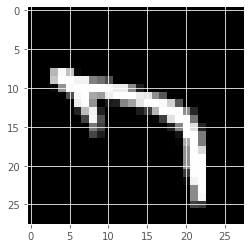

True label of the test sample 510: 8
Predicted label of test sample 510: 0
Epistemic uncertainty: 0.3118


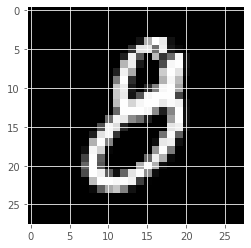

True label of the test sample 225: 8
Predicted label of test sample 225: 0
Epistemic uncertainty: 0.3029


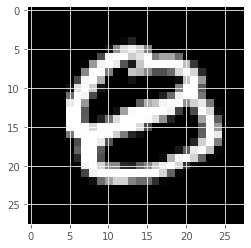

True label of the test sample 1199: 8
Predicted label of test sample 1199: 8
Epistemic uncertainty: 0.2972


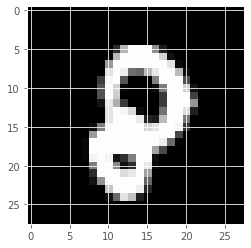

True label of the test sample 1055: 8
Predicted label of test sample 1055: 0
Epistemic uncertainty: 0.2815


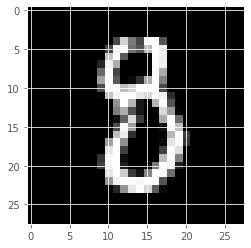

True label of the test sample 1464: 8
Predicted label of test sample 1464: 8
Epistemic uncertainty: 0.28


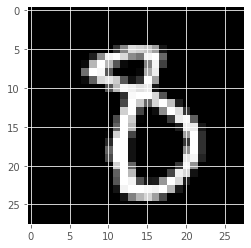

True label of the test sample 1130: 8
Predicted label of test sample 1130: 8
Epistemic uncertainty: 0.2769


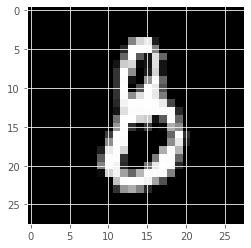

True label of the test sample 2143: 7
Predicted label of test sample 2143: 8
Epistemic uncertainty: 0.2754


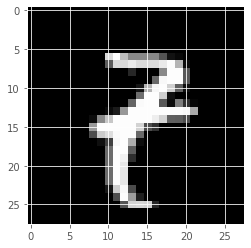

True label of the test sample 2876: 8
Predicted label of test sample 2876: 1
Epistemic uncertainty: 0.2734


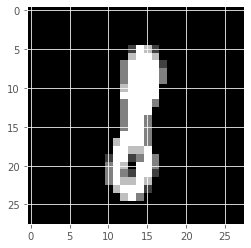

True label of the test sample 1898: 7
Predicted label of test sample 1898: 7
Epistemic uncertainty: 0.2698


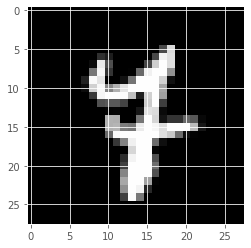

True label of the test sample 2248: 7
Predicted label of test sample 2248: 1
Epistemic uncertainty: 0.2683


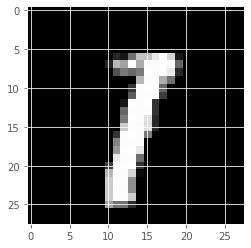

True label of the test sample 2244: 1
Predicted label of test sample 2244: 8
Epistemic uncertainty: 0.267


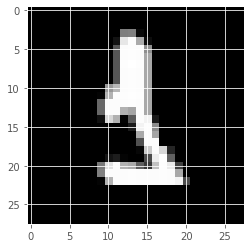

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.2664


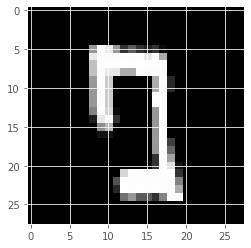

True label of the test sample 2704: 8
Predicted label of test sample 2704: 8
Epistemic uncertainty: 0.2634


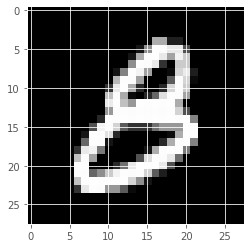

True label of the test sample 2342: 8
Predicted label of test sample 2342: 8
Epistemic uncertainty: 0.2605


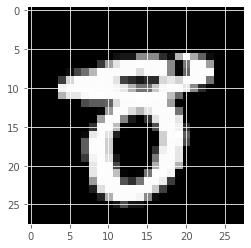

True label of the test sample 248: 7
Predicted label of test sample 248: 7
Epistemic uncertainty: 0.2594


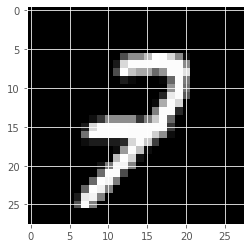

True label of the test sample 2365: 7
Predicted label of test sample 2365: 7
Epistemic uncertainty: 0.2593


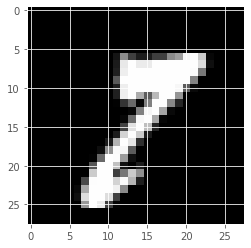

True label of the test sample 1163: 8
Predicted label of test sample 1163: 8
Epistemic uncertainty: 0.2496


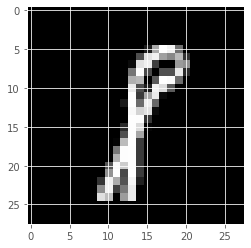

True label of the test sample 3006: 8
Predicted label of test sample 3006: 8
Epistemic uncertainty: 0.2457


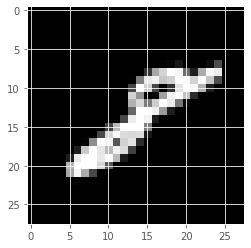

In [ ]:
show_epistemic(mc_total_cnn_epistemic[0], mc_total_cnn_ensemble_pred)

True label of the test sample 858: 8
Predicted label of test sample 858: 8
Epistemic uncertainty: 2.278e-06


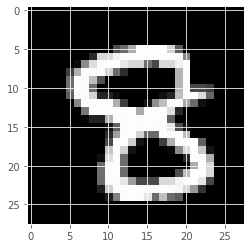

True label of the test sample 1866: 8
Predicted label of test sample 1866: 8
Epistemic uncertainty: 3.775e-06


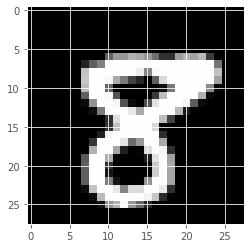

True label of the test sample 1439: 8
Predicted label of test sample 1439: 8
Epistemic uncertainty: 4.417e-06


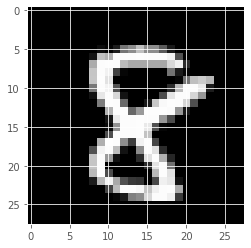

True label of the test sample 1469: 7
Predicted label of test sample 1469: 7
Epistemic uncertainty: 4.522e-06


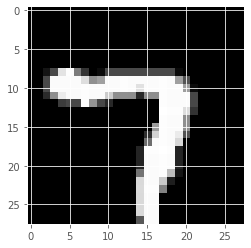

True label of the test sample 1086: 0
Predicted label of test sample 1086: 0
Epistemic uncertainty: 4.651e-06


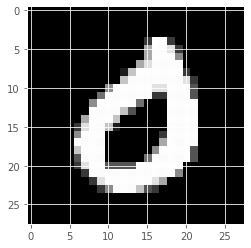

True label of the test sample 694: 8
Predicted label of test sample 694: 8
Epistemic uncertainty: 5.379e-06


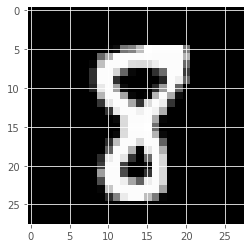

True label of the test sample 3089: 7
Predicted label of test sample 3089: 7
Epistemic uncertainty: 6.073e-06


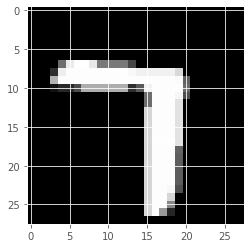

True label of the test sample 333: 8
Predicted label of test sample 333: 8
Epistemic uncertainty: 6.273e-06


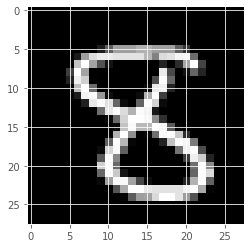

True label of the test sample 2272: 8
Predicted label of test sample 2272: 8
Epistemic uncertainty: 6.472e-06


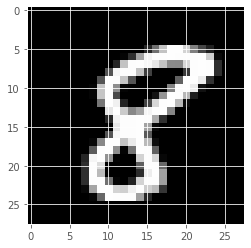

True label of the test sample 2875: 7
Predicted label of test sample 2875: 7
Epistemic uncertainty: 6.729e-06


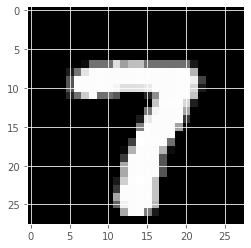

True label of the test sample 460: 0
Predicted label of test sample 460: 0
Epistemic uncertainty: 6.75e-06


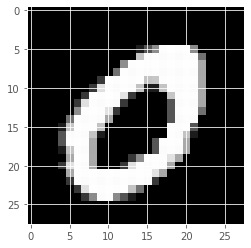

True label of the test sample 372: 7
Predicted label of test sample 372: 7
Epistemic uncertainty: 6.765e-06


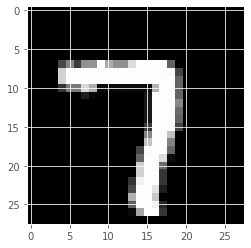

True label of the test sample 3429: 8
Predicted label of test sample 3429: 8
Epistemic uncertainty: 7.164e-06


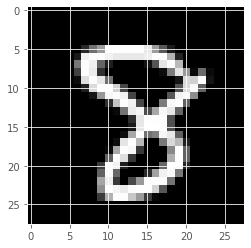

True label of the test sample 2411: 8
Predicted label of test sample 2411: 8
Epistemic uncertainty: 7.947e-06


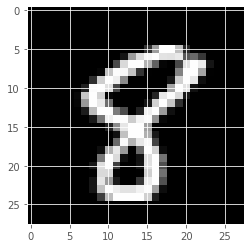

True label of the test sample 2781: 8
Predicted label of test sample 2781: 8
Epistemic uncertainty: 8.416e-06


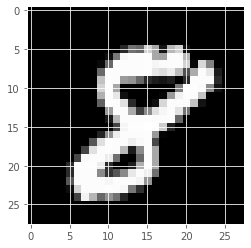

True label of the test sample 233: 8
Predicted label of test sample 233: 8
Epistemic uncertainty: 8.602e-06


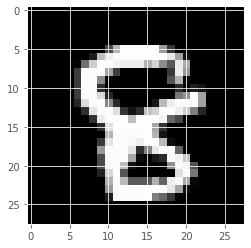

True label of the test sample 253: 8
Predicted label of test sample 253: 8
Epistemic uncertainty: 9.482e-06


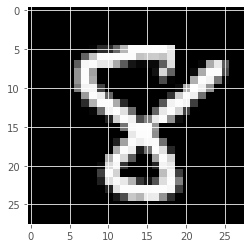

True label of the test sample 1509: 8
Predicted label of test sample 1509: 8
Epistemic uncertainty: 1.022e-05


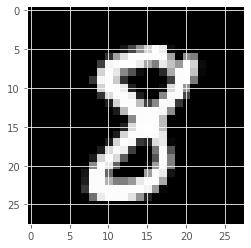

True label of the test sample 904: 0
Predicted label of test sample 904: 0
Epistemic uncertainty: 1.028e-05


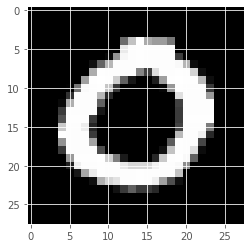

True label of the test sample 3358: 8
Predicted label of test sample 3358: 8
Epistemic uncertainty: 1.107e-05


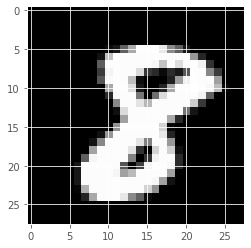

In [ ]:
show_epistemic(mc_total_cnn_epistemic[0], mc_total_cnn_ensemble_pred, highest=False)

#### Epistemic part 2

True label of the test sample 2282: 7
Predicted label of test sample 2282: 7
Epistemic uncertainty: 0.1769


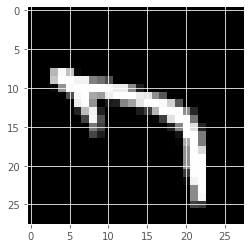

True label of the test sample 3172: 8
Predicted label of test sample 3172: 8
Epistemic uncertainty: 0.1741


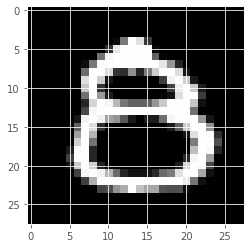

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.161


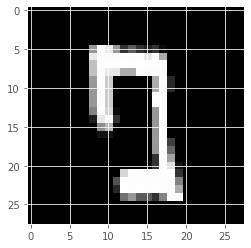

True label of the test sample 2556: 8
Predicted label of test sample 2556: 8
Epistemic uncertainty: 0.1606


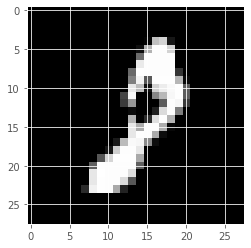

True label of the test sample 2365: 7
Predicted label of test sample 2365: 7
Epistemic uncertainty: 0.1578


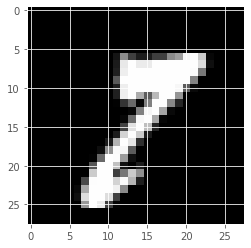

True label of the test sample 510: 8
Predicted label of test sample 510: 0
Epistemic uncertainty: 0.1568


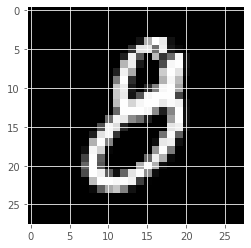

True label of the test sample 3003: 7
Predicted label of test sample 3003: 8
Epistemic uncertainty: 0.1548


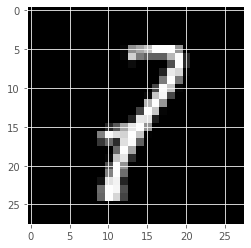

True label of the test sample 225: 8
Predicted label of test sample 225: 0
Epistemic uncertainty: 0.1529


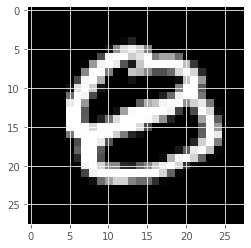

True label of the test sample 2244: 1
Predicted label of test sample 2244: 8
Epistemic uncertainty: 0.1518


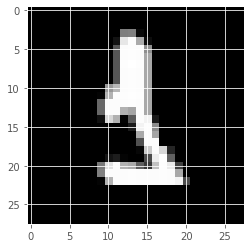

True label of the test sample 1199: 8
Predicted label of test sample 1199: 8
Epistemic uncertainty: 0.1491


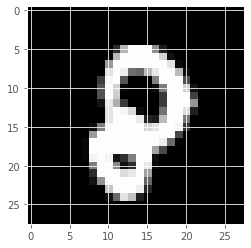

True label of the test sample 2876: 8
Predicted label of test sample 2876: 1
Epistemic uncertainty: 0.1476


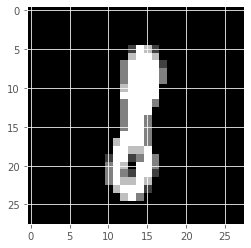

True label of the test sample 2248: 7
Predicted label of test sample 2248: 1
Epistemic uncertainty: 0.147


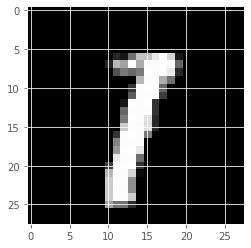

True label of the test sample 1130: 8
Predicted label of test sample 1130: 8
Epistemic uncertainty: 0.1435


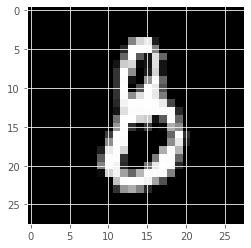

True label of the test sample 1055: 8
Predicted label of test sample 1055: 0
Epistemic uncertainty: 0.1428


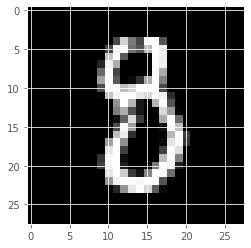

True label of the test sample 1464: 8
Predicted label of test sample 1464: 8
Epistemic uncertainty: 0.1419


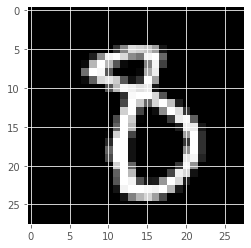

True label of the test sample 2143: 7
Predicted label of test sample 2143: 8
Epistemic uncertainty: 0.1406


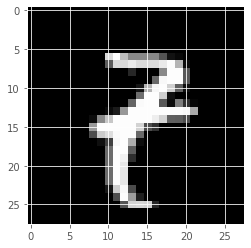

True label of the test sample 1898: 7
Predicted label of test sample 1898: 7
Epistemic uncertainty: 0.1388


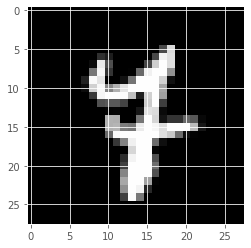

True label of the test sample 897: 1
Predicted label of test sample 897: 0
Epistemic uncertainty: 0.1328


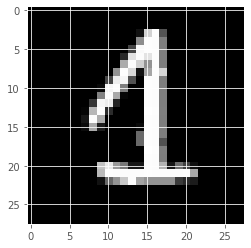

True label of the test sample 2342: 8
Predicted label of test sample 2342: 8
Epistemic uncertainty: 0.1327


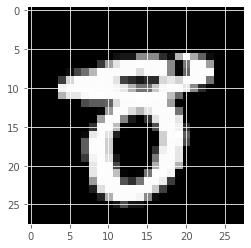

True label of the test sample 2704: 8
Predicted label of test sample 2704: 8
Epistemic uncertainty: 0.1319


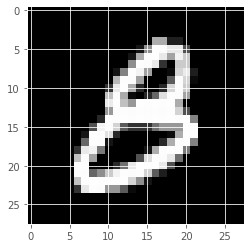

In [ ]:
show_epistemic(mc_total_cnn_epistemic[1], mc_total_cnn_ensemble_pred)

True label of the test sample 858: 8
Predicted label of test sample 858: 8
Epistemic uncertainty: 1.151e-06


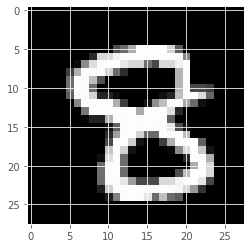

True label of the test sample 1866: 8
Predicted label of test sample 1866: 8
Epistemic uncertainty: 2.225e-06


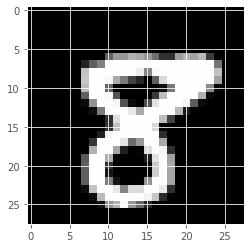

True label of the test sample 1469: 7
Predicted label of test sample 1469: 7
Epistemic uncertainty: 2.415e-06


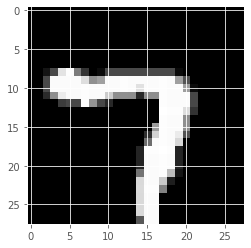

True label of the test sample 1439: 8
Predicted label of test sample 1439: 8
Epistemic uncertainty: 2.416e-06


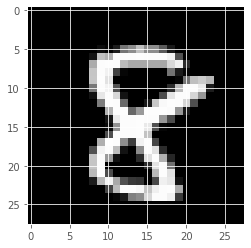

True label of the test sample 1086: 0
Predicted label of test sample 1086: 0
Epistemic uncertainty: 2.538e-06


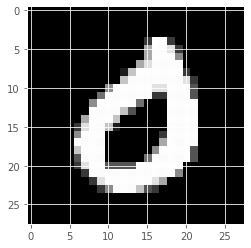

True label of the test sample 694: 8
Predicted label of test sample 694: 8
Epistemic uncertainty: 3.018e-06


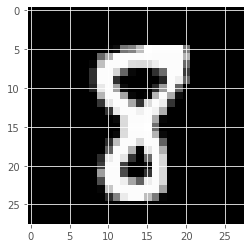

True label of the test sample 3089: 7
Predicted label of test sample 3089: 7
Epistemic uncertainty: 3.137e-06


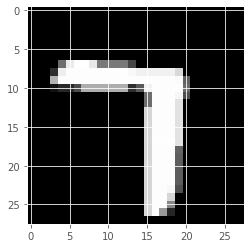

True label of the test sample 333: 8
Predicted label of test sample 333: 8
Epistemic uncertainty: 3.333e-06


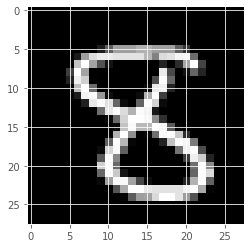

True label of the test sample 372: 7
Predicted label of test sample 372: 7
Epistemic uncertainty: 3.585e-06


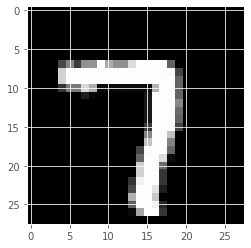

True label of the test sample 2272: 8
Predicted label of test sample 2272: 8
Epistemic uncertainty: 3.662e-06


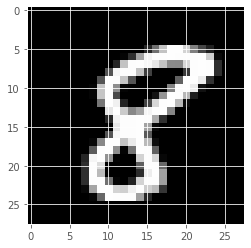

True label of the test sample 2875: 7
Predicted label of test sample 2875: 7
Epistemic uncertainty: 3.711e-06


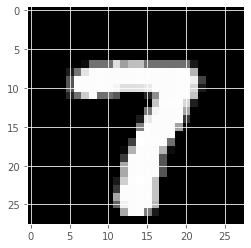

True label of the test sample 460: 0
Predicted label of test sample 460: 0
Epistemic uncertainty: 4.02e-06


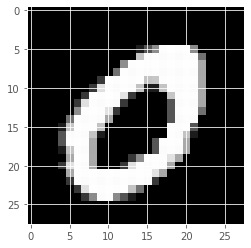

True label of the test sample 3429: 8
Predicted label of test sample 3429: 8
Epistemic uncertainty: 4.115e-06


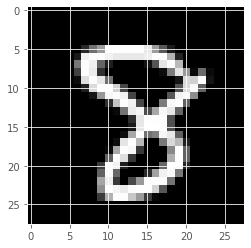

True label of the test sample 2411: 8
Predicted label of test sample 2411: 8
Epistemic uncertainty: 4.266e-06


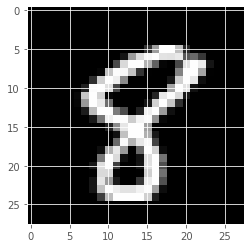

True label of the test sample 2781: 8
Predicted label of test sample 2781: 8
Epistemic uncertainty: 4.457e-06


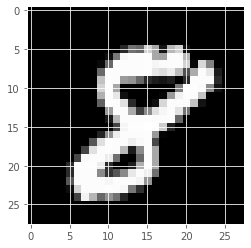

True label of the test sample 253: 8
Predicted label of test sample 253: 8
Epistemic uncertainty: 5.032e-06


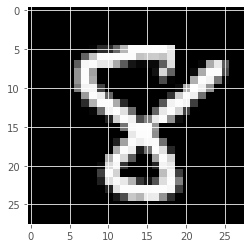

True label of the test sample 233: 8
Predicted label of test sample 233: 8
Epistemic uncertainty: 5.065e-06


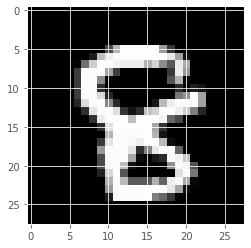

True label of the test sample 904: 0
Predicted label of test sample 904: 0
Epistemic uncertainty: 5.542e-06


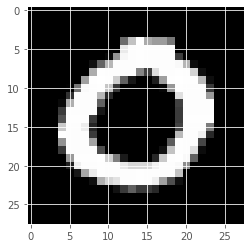

True label of the test sample 1509: 8
Predicted label of test sample 1509: 8
Epistemic uncertainty: 5.569e-06


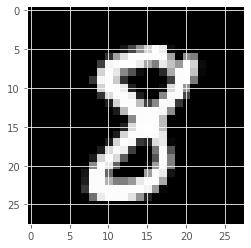

True label of the test sample 3358: 8
Predicted label of test sample 3358: 8
Epistemic uncertainty: 5.665e-06


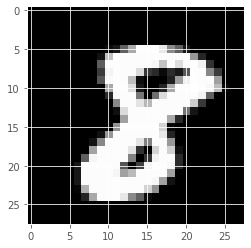

In [ ]:
show_epistemic(mc_total_cnn_epistemic[1], mc_total_cnn_ensemble_pred, highest=False)

#### Epistemic part 3

True label of the test sample 2556: 8
Predicted label of test sample 2556: 8
Epistemic uncertainty: 1.303


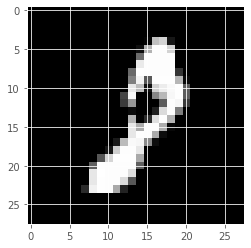

True label of the test sample 669: 1
Predicted label of test sample 669: 0
Epistemic uncertainty: 1.231


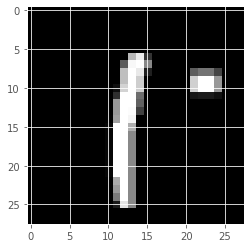

True label of the test sample 897: 1
Predicted label of test sample 897: 0
Epistemic uncertainty: 1.219


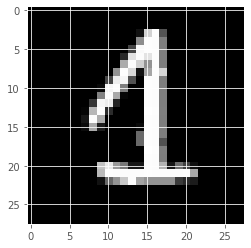

True label of the test sample 1331: 0
Predicted label of test sample 1331: 7
Epistemic uncertainty: 1.148


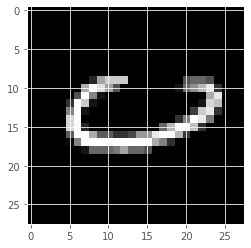

True label of the test sample 3003: 7
Predicted label of test sample 3003: 8
Epistemic uncertainty: 1.131


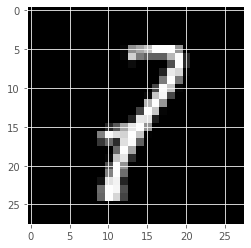

True label of the test sample 1644: 8
Predicted label of test sample 1644: 8
Epistemic uncertainty: 1.126


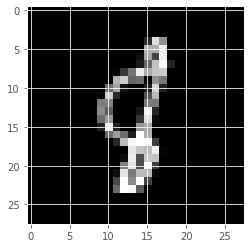

True label of the test sample 583: 8
Predicted label of test sample 583: 8
Epistemic uncertainty: 1.082


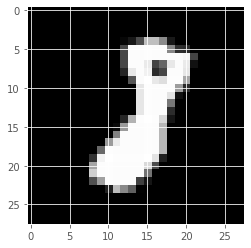

True label of the test sample 727: 1
Predicted label of test sample 727: 1
Epistemic uncertainty: 1.061


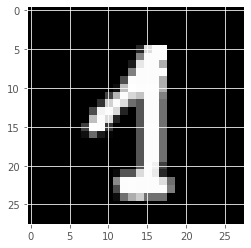

True label of the test sample 3141: 1
Predicted label of test sample 3141: 7
Epistemic uncertainty: 1.054


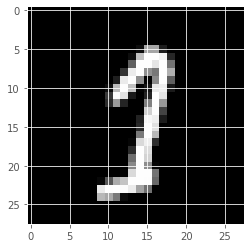

True label of the test sample 2365: 7
Predicted label of test sample 2365: 7
Epistemic uncertainty: 1.02


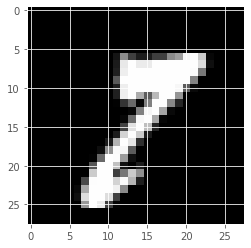

True label of the test sample 3314: 7
Predicted label of test sample 3314: 8
Epistemic uncertainty: 0.9563


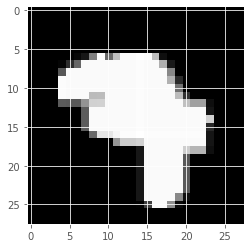

True label of the test sample 1176: 7
Predicted label of test sample 1176: 7
Epistemic uncertainty: 0.9134


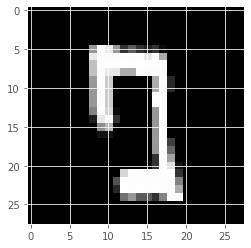

True label of the test sample 838: 7
Predicted label of test sample 838: 7
Epistemic uncertainty: 0.8751


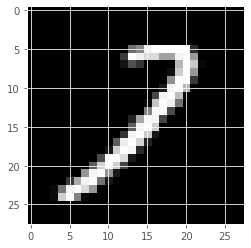

True label of the test sample 2244: 1
Predicted label of test sample 2244: 8
Epistemic uncertainty: 0.8672


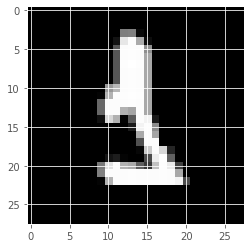

True label of the test sample 2486: 0
Predicted label of test sample 2486: 0
Epistemic uncertainty: 0.8631


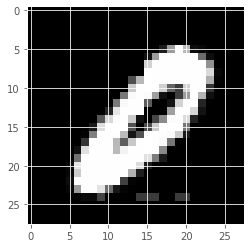

True label of the test sample 2686: 1
Predicted label of test sample 2686: 1
Epistemic uncertainty: 0.8622


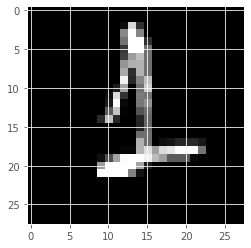

True label of the test sample 764: 7
Predicted label of test sample 764: 7
Epistemic uncertainty: 0.8591


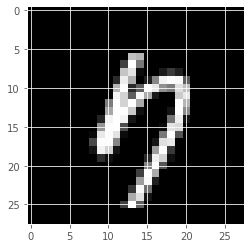

True label of the test sample 767: 1
Predicted label of test sample 767: 1
Epistemic uncertainty: 0.8425


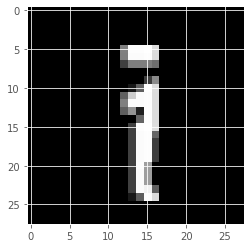

True label of the test sample 3006: 8
Predicted label of test sample 3006: 8
Epistemic uncertainty: 0.8372


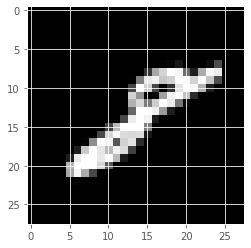

True label of the test sample 2876: 8
Predicted label of test sample 2876: 1
Epistemic uncertainty: 0.826


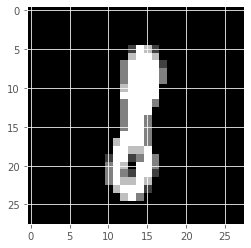

In [ ]:
show_epistemic(mc_total_cnn_epistemic[2], mc_total_cnn_ensemble_pred)

True label of the test sample 858: 8
Predicted label of test sample 858: 8
Epistemic uncertainty: 4.308e-06


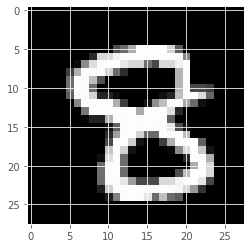

True label of the test sample 1866: 8
Predicted label of test sample 1866: 8
Epistemic uncertainty: 1.943e-05


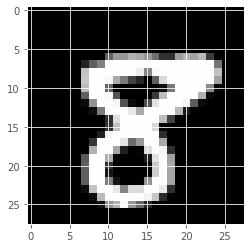

True label of the test sample 1439: 8
Predicted label of test sample 1439: 8
Epistemic uncertainty: 2.211e-05


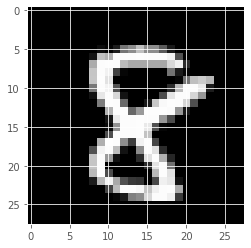

True label of the test sample 2272: 8
Predicted label of test sample 2272: 8
Epistemic uncertainty: 2.283e-05


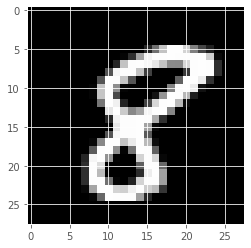

True label of the test sample 1469: 7
Predicted label of test sample 1469: 7
Epistemic uncertainty: 2.439e-05


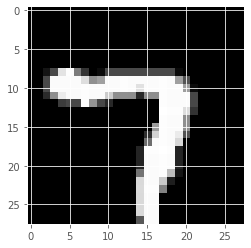

True label of the test sample 694: 8
Predicted label of test sample 694: 8
Epistemic uncertainty: 2.533e-05


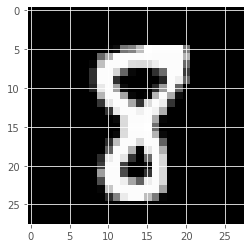

True label of the test sample 333: 8
Predicted label of test sample 333: 8
Epistemic uncertainty: 2.812e-05


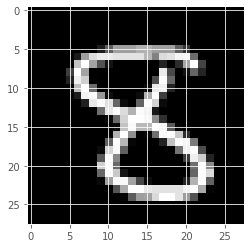

True label of the test sample 3089: 7
Predicted label of test sample 3089: 7
Epistemic uncertainty: 2.837e-05


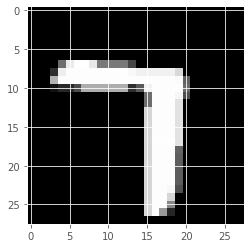

True label of the test sample 372: 7
Predicted label of test sample 372: 7
Epistemic uncertainty: 3.2e-05


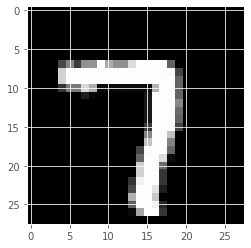

True label of the test sample 1086: 0
Predicted label of test sample 1086: 0
Epistemic uncertainty: 3.268e-05


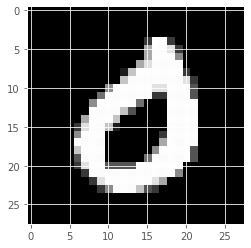

True label of the test sample 2875: 7
Predicted label of test sample 2875: 7
Epistemic uncertainty: 3.461e-05


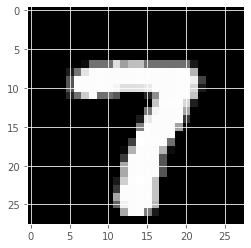

True label of the test sample 2123: 8
Predicted label of test sample 2123: 8
Epistemic uncertainty: 3.569e-05


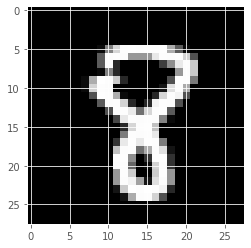

True label of the test sample 253: 8
Predicted label of test sample 253: 8
Epistemic uncertainty: 3.695e-05


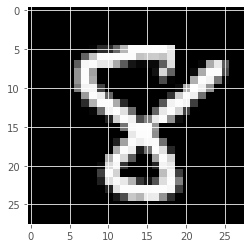

True label of the test sample 1509: 8
Predicted label of test sample 1509: 8
Epistemic uncertainty: 3.74e-05


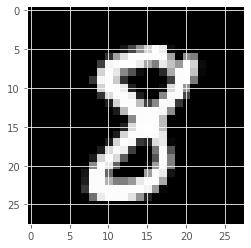

True label of the test sample 3358: 8
Predicted label of test sample 3358: 8
Epistemic uncertainty: 3.827e-05


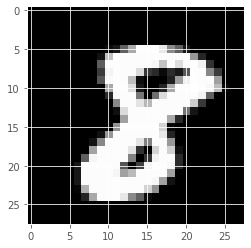

True label of the test sample 3429: 8
Predicted label of test sample 3429: 8
Epistemic uncertainty: 3.849e-05


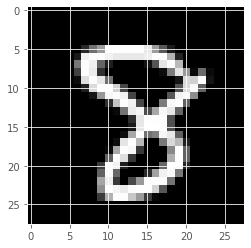

True label of the test sample 2411: 8
Predicted label of test sample 2411: 8
Epistemic uncertainty: 4.044e-05


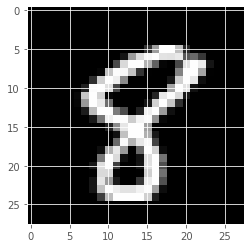

True label of the test sample 904: 0
Predicted label of test sample 904: 0
Epistemic uncertainty: 4.066e-05


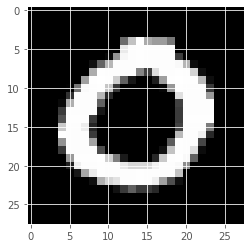

True label of the test sample 3063: 0
Predicted label of test sample 3063: 0
Epistemic uncertainty: 4.425e-05


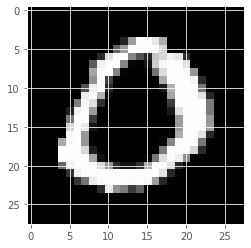

True label of the test sample 2781: 8
Predicted label of test sample 2781: 8
Epistemic uncertainty: 4.433e-05


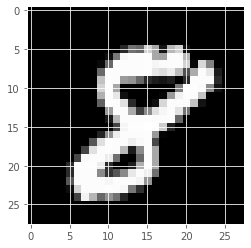

In [ ]:
show_epistemic(mc_total_cnn_epistemic[2], mc_total_cnn_ensemble_pred, highest=False)

#### comparing epistemic

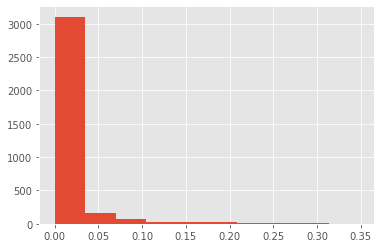

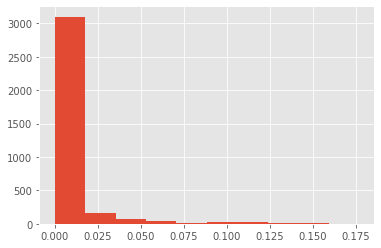

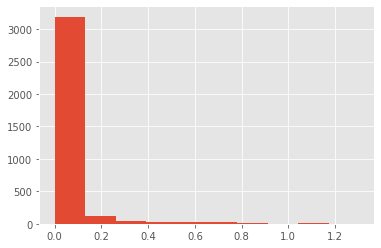

In [ ]:
for i in [0,1,2]:
  plt.hist(mc_total_cnn_epistemic[i])
  plt.show()

#### aleatoric

In [ ]:
pred_class_alea_total_cnn, sigmas_alea_total_cnn = cal_aleatoric(total_mc_cnn_model)

In [ ]:
fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
sigmas_alea_total_cnn = loadtxt(fp+'/sigmas_alea_total_mnist.csv', delimiter=',')

In [ ]:
"""fp = "/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_saved_uncertainties"
savetxt(fp + '/sigmas_alea_total_mnist.csv', sigmas_alea_total_cnn, delimiter=',')"""

True label of the test sample 2220: 1
Predicted label of test sample 2220: 1
Aleatoric uncertainty: 1.22


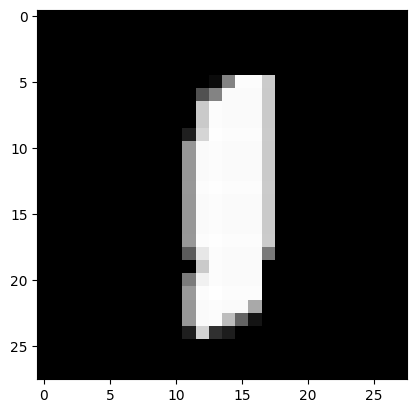

True label of the test sample 1979: 0
Predicted label of test sample 1979: 0
Aleatoric uncertainty: 1.191


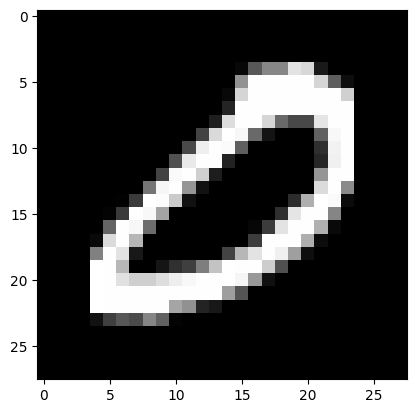

True label of the test sample 1695: 1
Predicted label of test sample 1695: 1
Aleatoric uncertainty: 0.9413


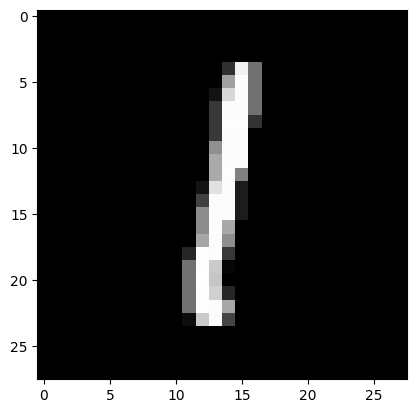

True label of the test sample 702: 1
Predicted label of test sample 702: 1
Aleatoric uncertainty: 0.8567


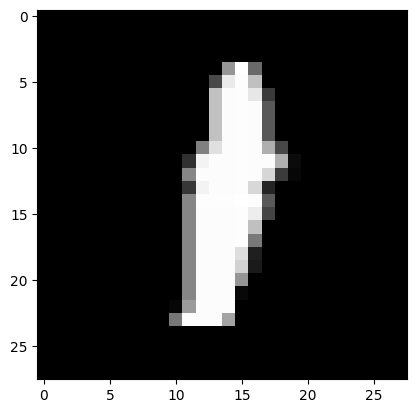

True label of the test sample 2034: 1
Predicted label of test sample 2034: 1
Aleatoric uncertainty: 0.8327


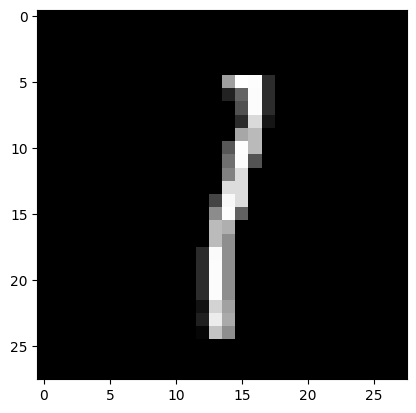

True label of the test sample 2610: 1
Predicted label of test sample 2610: 1
Aleatoric uncertainty: 0.8229


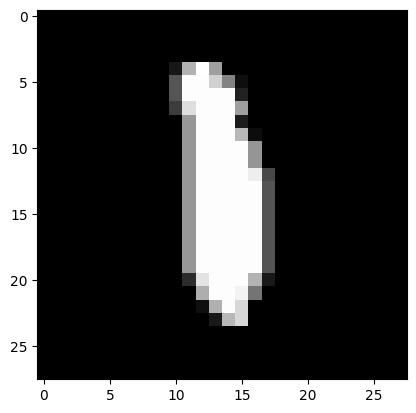

True label of the test sample 1554: 1
Predicted label of test sample 1554: 1
Aleatoric uncertainty: 0.7394


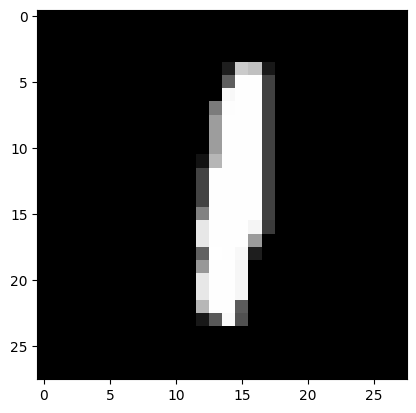

True label of the test sample 324: 1
Predicted label of test sample 324: 1
Aleatoric uncertainty: 0.7171


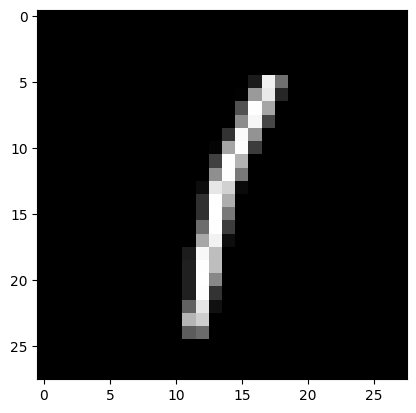

True label of the test sample 1207: 1
Predicted label of test sample 1207: 1
Aleatoric uncertainty: 0.6845


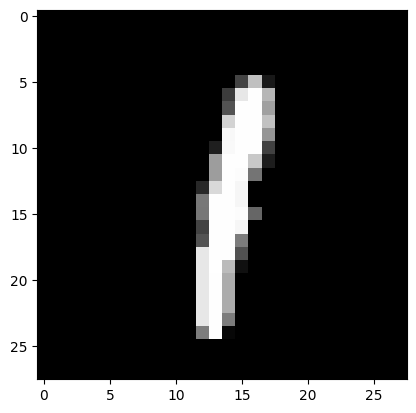

True label of the test sample 2212: 1
Predicted label of test sample 2212: 1
Aleatoric uncertainty: 0.6751


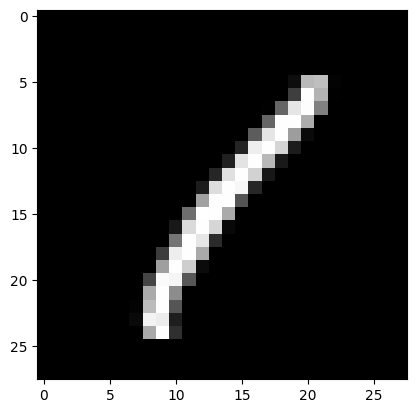

True label of the test sample 727: 1
Predicted label of test sample 727: 1
Aleatoric uncertainty: 0.6672


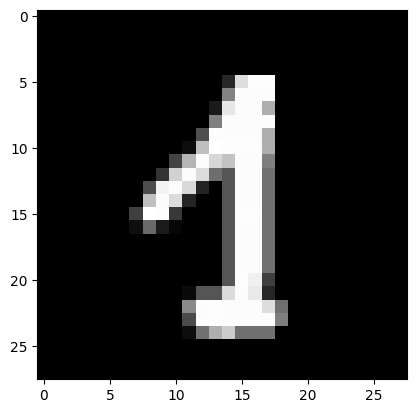

True label of the test sample 2233: 1
Predicted label of test sample 2233: 1
Aleatoric uncertainty: 0.6667


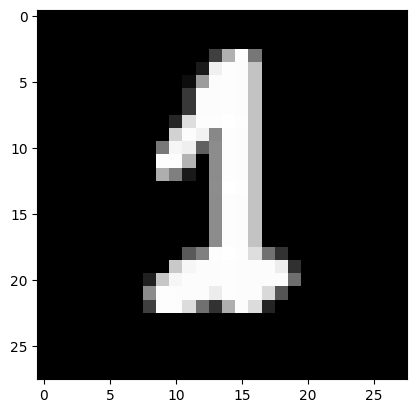

True label of the test sample 2925: 1
Predicted label of test sample 2925: 1
Aleatoric uncertainty: 0.6627


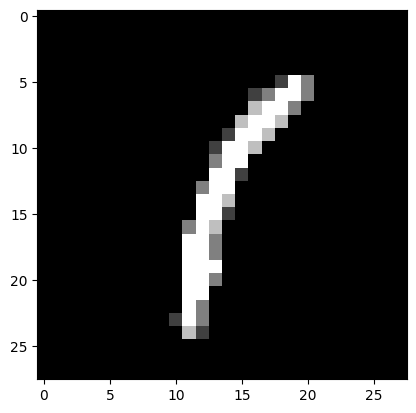

True label of the test sample 3047: 1
Predicted label of test sample 3047: 1
Aleatoric uncertainty: 0.6562


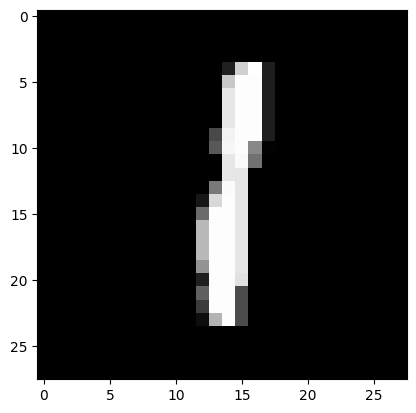

True label of the test sample 3324: 1
Predicted label of test sample 3324: 1
Aleatoric uncertainty: 0.6552


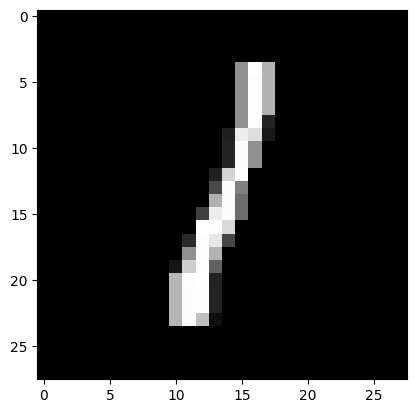

True label of the test sample 2884: 1
Predicted label of test sample 2884: 1
Aleatoric uncertainty: 0.6442


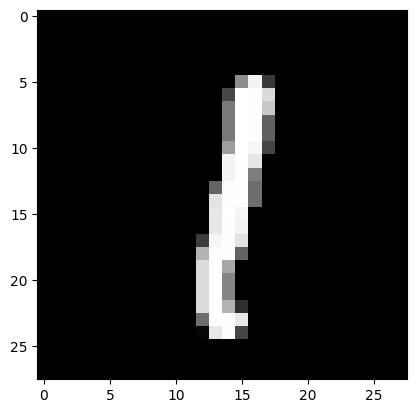

True label of the test sample 2139: 1
Predicted label of test sample 2139: 1
Aleatoric uncertainty: 0.6382


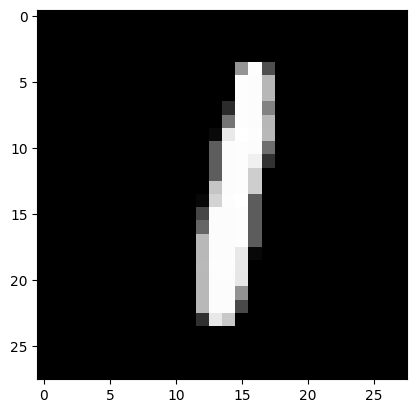

True label of the test sample 3241: 1
Predicted label of test sample 3241: 1
Aleatoric uncertainty: 0.6377


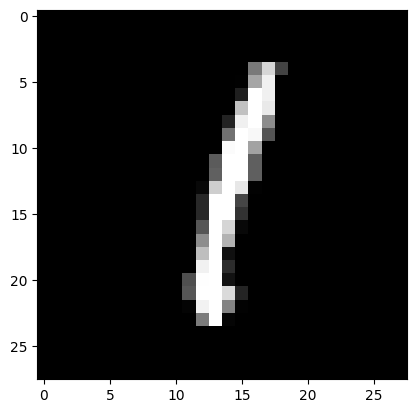

True label of the test sample 1659: 1
Predicted label of test sample 1659: 1
Aleatoric uncertainty: 0.6334


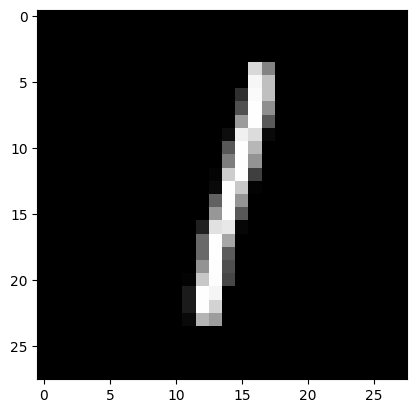

True label of the test sample 2686: 1
Predicted label of test sample 2686: 1
Aleatoric uncertainty: 0.6296


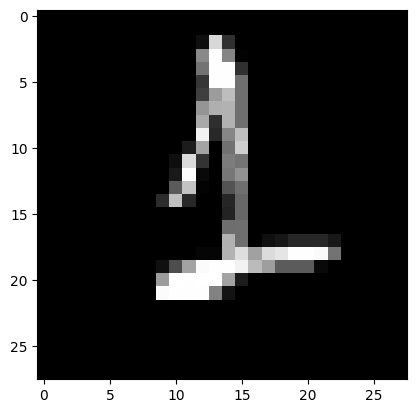

In [ ]:
show_aleatoric(sigmas_alea_total_cnn, pred_class_alea_total_cnn)

True label of the test sample 817: 8
Predicted label of test sample 817: 8
Aleatoric uncertainty: 4.326e-05


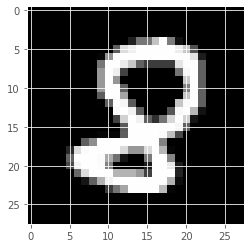

True label of the test sample 3366: 8
Predicted label of test sample 3366: 8
Aleatoric uncertainty: 0.0004391


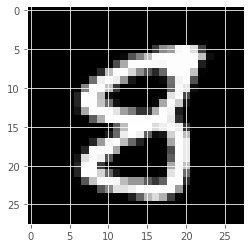

True label of the test sample 1395: 8
Predicted label of test sample 1395: 8
Aleatoric uncertainty: 0.0004604


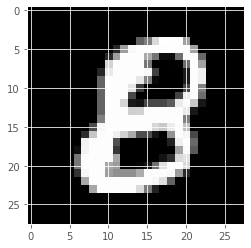

True label of the test sample 2726: 0
Predicted label of test sample 2726: 0
Aleatoric uncertainty: 0.0005561


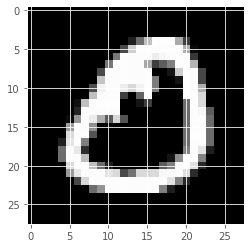

True label of the test sample 346: 8
Predicted label of test sample 346: 8
Aleatoric uncertainty: 0.0006556


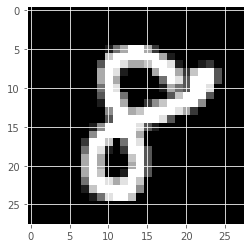

True label of the test sample 3054: 8
Predicted label of test sample 3054: 8
Aleatoric uncertainty: 0.000693


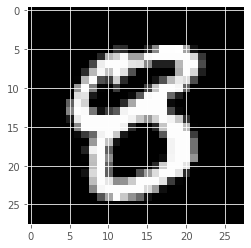

True label of the test sample 2347: 0
Predicted label of test sample 2347: 0
Aleatoric uncertainty: 0.000697


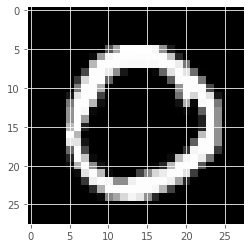

True label of the test sample 1080: 8
Predicted label of test sample 1080: 8
Aleatoric uncertainty: 0.0006991


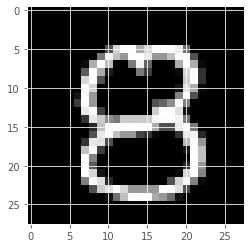

True label of the test sample 840: 8
Predicted label of test sample 840: 8
Aleatoric uncertainty: 0.0007248


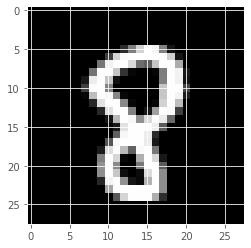

True label of the test sample 1000: 0
Predicted label of test sample 1000: 0
Aleatoric uncertainty: 0.0008219


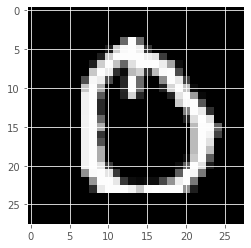

True label of the test sample 3444: 8
Predicted label of test sample 3444: 8
Aleatoric uncertainty: 0.0008314


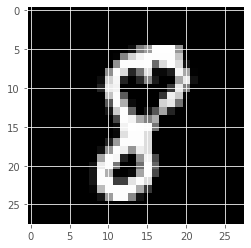

True label of the test sample 901: 0
Predicted label of test sample 901: 0
Aleatoric uncertainty: 0.0008555


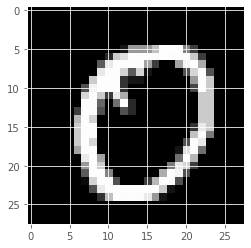

True label of the test sample 2001: 8
Predicted label of test sample 2001: 8
Aleatoric uncertainty: 0.0008973


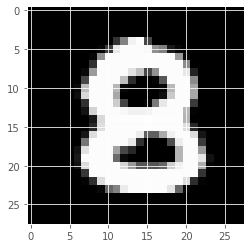

True label of the test sample 333: 8
Predicted label of test sample 333: 8
Aleatoric uncertainty: 0.0009031


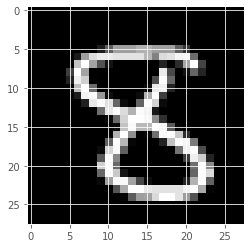

True label of the test sample 71: 0
Predicted label of test sample 71: 0
Aleatoric uncertainty: 0.000931


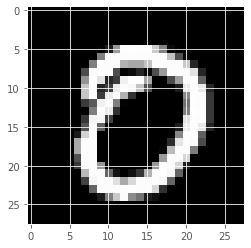

True label of the test sample 2739: 8
Predicted label of test sample 2739: 8
Aleatoric uncertainty: 0.0009334


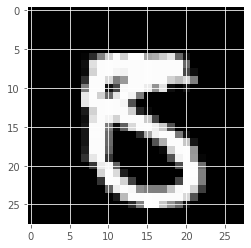

True label of the test sample 2734: 8
Predicted label of test sample 2734: 8
Aleatoric uncertainty: 0.0009383


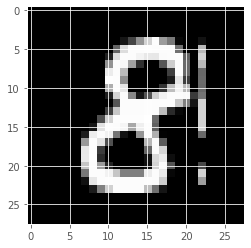

True label of the test sample 217: 0
Predicted label of test sample 217: 0
Aleatoric uncertainty: 0.0009607


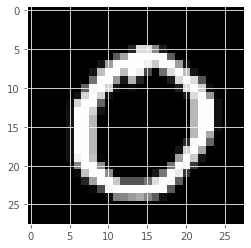

True label of the test sample 1999: 0
Predicted label of test sample 1999: 0
Aleatoric uncertainty: 0.001013


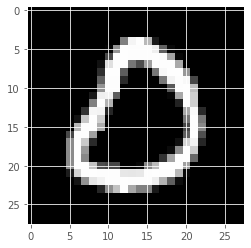

True label of the test sample 3058: 0
Predicted label of test sample 3058: 0
Aleatoric uncertainty: 0.001046


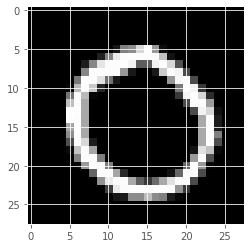

In [ ]:
show_aleatoric(sigmas_alea_total_cnn, pred_class_alea_total_cnn, highest=False)

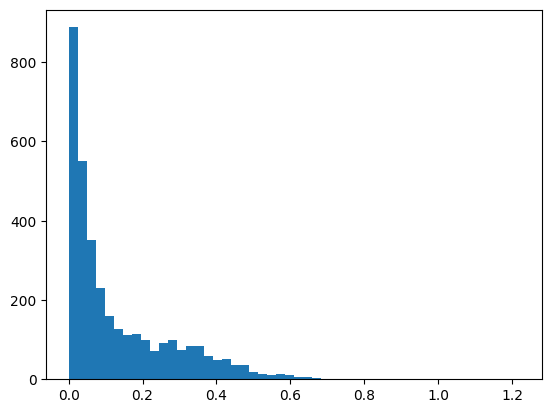

In [ ]:
plt.hist(sigmas_alea_total_cnn, bins=50)
plt.show()

#### Loss attenuation?

In [ ]:
# new
converted_pred = np.array([class_converter(i) for i in pred_class_alea_total_cnn])
print("number of misclassified samples: ", 
      sum(converted_pred != np.array(y_mnist_test_original)))

(n_wrongclass_highalea, alea_idx, 
 true_label, pred_label) = loss_att_check(sigmas_alea_total_cnn, 
                                          pred_class_alea_total_cnn,
                                          n_alea=518) #n_alea=2953)

print(n_wrongclass_highalea, alea_idx, true_label, pred_label)

number of misclassified samples:  29
6 [ 897  434 2545  727 3141 1216] [1 7 1 1 1 1] [0 1 7 7 7 7]


In [ ]:
converted_pred = np.array([class_converter(i) for i in pred_class_alea_total_cnn])
print("number of misclassified samples: ", 
      sum(converted_pred != np.array(y_mnist_test_original)))

(n_wrongclass_highalea, alea_idx, 
 true_label, pred_label) = loss_att_check(sigmas_alea_total_cnn, 
                                          pred_class_alea_total_cnn,
                                          n_alea=518) #n_alea=2953)

print(n_wrongclass_highalea, alea_idx, true_label, pred_label)

number of misclassified samples:  26
5 [2545 1331  669  434 3141] [1 0 1 7 1] [7 7 0 1 7]


In [ ]:
n_wrongclass_highalea/26

0.19230769230769232

# Overlap data points with highest uncertainties when using different models/calculations?

We modeled epistemic and aleatoric uncertainties separately but also jointly. Now let's see if there is an overlap in the predictions with highest uncertainty

## Epistemic

Overlap with different calculations for epistemic uncertainty:

In [ ]:
# checking which samples overlap with the different types of calculating 
# epistemic uncertainty
def overlap_epistemic(all_epi, highest=True, n_epi=20):
    if highest == True:
      epi_0_idx = all_epi[0].argsort()[::-1]
      epi_1_idx = all_epi[1].argsort()[::-1]
      epi_2_idx = all_epi[2].argsort()[::-1]
    if highest == False:
      epi_0_idx = all_epi[0].argsort()
      epi_1_idx = all_epi[1].argsort()
      epi_2_idx = all_epi[2].argsort()
    overlap01 = list(set.intersection(*map(set, [epi_0_idx[:n_epi], 
                                               epi_1_idx[:n_epi]])))
    overlap12 = list(set.intersection(*map(set, [epi_1_idx[:n_epi], 
                                               epi_2_idx[:n_epi]])))   
    overlap02 = list(set.intersection(*map(set, [epi_0_idx[:n_epi], 
                                               epi_2_idx[:n_epi]])))   
    overlap012 = list(set.intersection(*map(set, [epi_0_idx[:n_epi], 
                                               epi_1_idx[:n_epi], 
                                               epi_2_idx[:n_epi]])))
    return overlap01, overlap12, overlap02, overlap012

In [ ]:
# model only epistemic
n_epi = 200
overlap01, overlap12, overlap02, overlap012 = overlap_epistemic(mc_cnn_epistemic,
                                                                n_epi=n_epi, highest=False)
print("std max and mean:\n", overlap01,
    "\nstd mean and entropy: \n", overlap12,
    "\nstd max and entropy: \n", overlap02,
    "\nall three:\n", overlap012,
    "\npercentage of all overlap: ", len(overlap012)/n_epi)

std max and mean:
 [1025, 3, 517, 11, 2066, 3094, 3095, 2583, 1560, 30, 2594, 3108, 2596, 1574, 2089, 560, 1585, 50, 48, 563, 59, 63, 1603, 68, 1605, 1095, 2632, 1614, 1107, 2132, 2644, 598, 3159, 2136, 1625, 1114, 90, 1113, 99, 3174, 615, 1128, 622, 2672, 1137, 117, 119, 2168, 3192, 122, 136, 1161, 2699, 3212, 653, 1165, 1684, 1186, 2723, 2213, 3238, 2215, 1705, 2733, 1711, 2735, 694, 696, 184, 2236, 1217, 1221, 2760, 203, 1228, 3277, 1742, 2255, 3278, 1743, 2258, 728, 1241, 2269, 2781, 224, 2279, 1769, 748, 3310, 2290, 1268, 1784, 1275, 256, 1794, 1797, 774, 1295, 2320, 789, 2327, 284, 3356, 1310, 801, 1316, 3366, 810, 2859, 1836, 1837, 1329, 1846, 3383, 1335, 829, 1344, 1351, 328, 329, 1866, 840, 2888, 853, 342, 858, 346, 1883, 2909, 1888, 1377, 2917, 1383, 2411, 2924, 2926, 879, 1390, 1904, 1905, 3440, 372, 2932, 1902, 887, 2938, 3451, 381, 1405, 895, 1919, 389, 903, 906, 2962, 1938, 408, 2456, 922, 1947, 1439, 1952, 2977, 1446, 424, 433, 435, 2485, 439, 1979, 1469, 958, 1471, 960,

In [ ]:
# model both aleatoric and epistemic
n_epi = 200
overlap01, overlap12, overlap02, overlap012 = overlap_epistemic(mc_total_cnn_epistemic,
                                                                n_epi=n_epi, highest=False)
print("std max and mean:\n", overlap01,
    "\nstd mean and entropy: \n", overlap12,
    "\nstd max and entropy: \n", overlap02,
    "\nall three:\n", overlap012,
    "\npercentage of all overlap: ", len(overlap012)/n_epi)

std max and mean:
 [2049, 1538, 513, 2052, 1549, 3089, 2066, 27, 1053, 1057, 34, 550, 2089, 48, 50, 1586, 2104, 2618, 1086, 63, 3135, 1603, 2631, 2632, 2123, 77, 1614, 3151, 2640, 1617, 1106, 1107, 1108, 2134, 3159, 2646, 1113, 604, 1118, 3174, 1639, 2152, 1640, 3176, 1132, 2672, 1138, 3192, 633, 3193, 639, 1152, 641, 136, 652, 1677, 1676, 653, 1172, 1173, 150, 1174, 152, 1696, 2725, 3238, 1191, 2215, 1195, 3243, 687, 690, 694, 2236, 707, 1735, 203, 205, 1748, 2773, 1236, 2265, 1241, 2779, 2781, 2782, 2269, 2272, 224, 3299, 1764, 1763, 233, 3307, 1774, 238, 3318, 247, 1276, 253, 1278, 1789, 256, 1284, 3335, 2828, 2832, 788, 3351, 1815, 1817, 282, 3358, 2854, 2353, 1329, 2356, 1846, 1335, 3383, 2875, 2363, 829, 3390, 1341, 1348, 1860, 1866, 333, 2893, 2896, 853, 2905, 858, 3420, 863, 1888, 865, 3429, 2917, 2411, 366, 879, 3440, 2926, 3442, 372, 2932, 887, 380, 1919, 898, 389, 2438, 904, 2444, 2962, 403, 919, 2969, 922, 1947, 925, 2973, 1439, 1441, 1446, 1965, 433, 2993, 2995, 1467, 1980

Result: Not big of a difference which calculation is used for uncertainty, so we stick to entropy in the next part as this is what was suggested by Yarin Gal

Overlap between the model only modeling epistemic and the model for both epistemic and aleatoric:

In [ ]:
def overlap_models(uncertain_1, uncertain_2, highest=True, n=20):
    if highest == True:
      uncertain_1_idx = uncertain_1.argsort()[::-1]
      uncertain_2_idx = uncertain_2.argsort()[::-1]
    if highest == False:
      uncertain_1_idx = uncertain_1.argsort()
      uncertain_2_idx = uncertain_2.argsort()
    overlap = list(set.intersection(*map(set, [uncertain_1_idx[:n], 
                                               uncertain_2_idx[:n]])))
    return overlap

In [ ]:
n = 40
overlap_epi = overlap_models(mc_cnn_epistemic[2], mc_total_cnn_epistemic[2],
                         n=n)
print("percentage of overlap: ", len(overlap_epi)/n, 
      "\nnumber of overlaps: ", len(overlap_epi),
      "\noverlap:\n", overlap_epi)

percentage of overlap:  0.5 
number of overlaps:  20 
overlap:
 [1163, 1809, 1176, 669, 2983, 1704, 1331, 2868, 3003, 2876, 2365, 3006, 3141, 583, 727, 2143, 2545, 3314, 2556, 767]


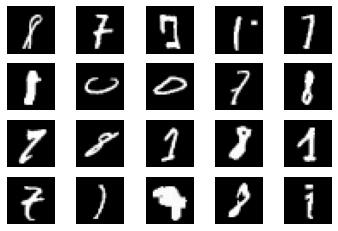

In [ ]:
fig, axs = plt.subplots(4, 5) 
for o, ax in zip(overlap_epi, axs.reshape(-1)):
  ax.imshow(X_mnist_test[o, :, :, 0], cmap='gist_gray')
  ax.axis('off')
plt.show()

In [ ]:
n = 80
overlap_epi = overlap_models(mc_cnn_epistemic[2], mc_total_cnn_epistemic[2],
                         n=n, highest=False)
print("percentage of overlap: ", len(overlap_epi)/n, 
      "\nnumber of overlaps: ", len(overlap_epi),
      "\noverlap:\n", overlap_epi)

percentage of overlap:  0.1875 
number of overlaps:  15 
overlap:
 [256, 1888, 1603, 1866, 879, 372, 853, 1846, 3159, 3192, 2932, 858, 1947, 1469, 1439]


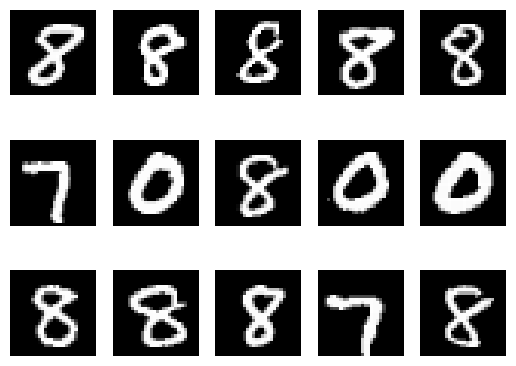

In [ ]:
fig, axs = plt.subplots(3, 5) 
for o, ax in zip(overlap_epi, axs.reshape(-1)):
  ax.imshow(X_mnist_test[o, :, :, 0], cmap='gist_gray')
  ax.axis('off')
plt.show()

## Aleatoric
only calculating overlap of models

In [ ]:
n = 864
overlap_alea = overlap_models(sigmas_alea_cnn, sigmas_alea_total_cnn,
                         n=n)
print("percentage of overlap: ", len(overlap_alea)/n, 
      "\nnumber of overlaps: ", len(overlap_alea),
      "\noverlap:\n", overlap_alea)

percentage of overlap:  0.17939814814814814 
number of overlaps:  155 
overlap:
 [1024, 2562, 3080, 9, 2059, 528, 3090, 2080, 2083, 2085, 549, 551, 3113, 1066, 555, 1579, 1070, 3122, 2611, 52, 1075, 1588, 570, 1084, 66, 1093, 3145, 78, 1615, 1619, 598, 88, 3165, 1633, 2659, 3171, 2149, 2663, 1644, 2683, 124, 637, 640, 151, 664, 1176, 3229, 1181, 1699, 2727, 680, 2728, 3247, 177, 180, 695, 188, 1225, 1737, 2767, 724, 213, 1236, 2263, 2270, 223, 2277, 2791, 2280, 2281, 1256, 2795, 1259, 2288, 2810, 3323, 3325, 254, 1277, 3334, 1806, 271, 272, 1297, 2834, 1301, 1823, 807, 3367, 2345, 2346, 2857, 1322, 2350, 815, 3374, 1331, 1845, 1848, 2361, 826, 3391, 2889, 2890, 2379, 3403, 1867, 334, 852, 2902, 2392, 345, 3421, 862, 3430, 873, 365, 2416, 370, 2419, 3449, 2945, 1410, 2953, 398, 1428, 1435, 1951, 2473, 1453, 1966, 1972, 2486, 1468, 959, 454, 967, 3017, 969, 2513, 469, 982, 983, 1495, 3033, 990, 1505, 1507, 2538, 3055, 1012, 2036, 503, 2041, 1533]


In [ ]:
sigmas_alea_cnn.shape[0] * 0.25

864.0

In [ ]:
sigmas_alea_cnn.shape[0]*0.15

518.4

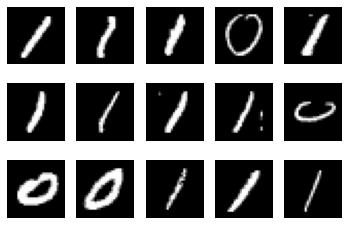

In [ ]:
fig, axs = plt.subplots(3,5) 
for o, ax in zip(overlap_alea, axs.reshape(-1)):
  ax.imshow(X_mnist_test[o, :, :, 0], cmap='gist_gray')
  ax.axis('off')
plt.show()

# Visualisations

## images with highest/lowest epistemic uncertainties

In [ ]:
def show_epistemic_summary(epi, highest=True, n_epi=20,
                   x_data=X_mnist_test,):
  fig, axs = plt.subplots(4, 5, figsize=(8,8)) 
  if highest == True:
    epi_idx = epi.argsort()[::-1]
  if highest == False:
    epi_idx = epi.argsort()
  for idx, ax in zip(epi_idx[:n_epi], axs.reshape(-1)):
    ax.imshow(x_data[idx, :, :, 0], cmap='gist_gray')
    ax.axis('off')
  #fig.suptitle("Main Title")
  plt.show()

alternating between the model only modeling epistemic and the one modeling both using different calculations for epistemic uncertainty. Also altering between showing highest and lowest uncertainty

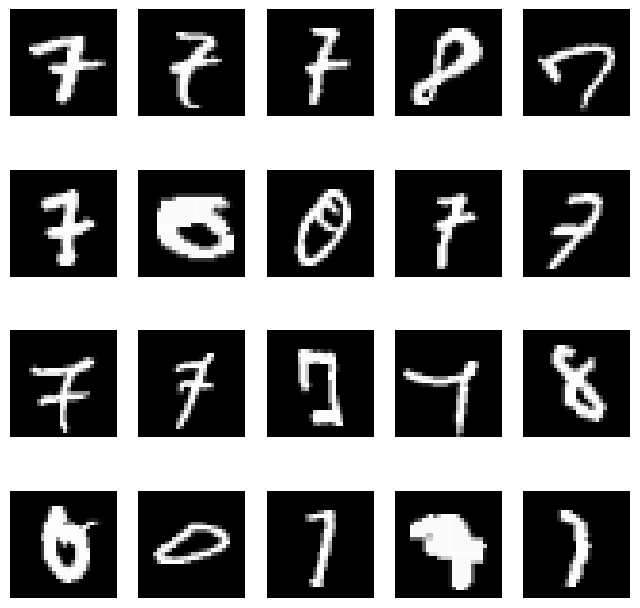

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[0])

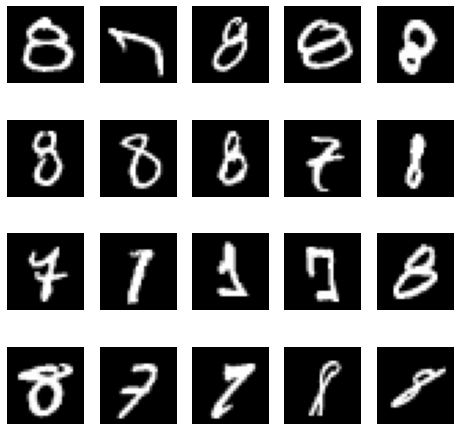

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[0])

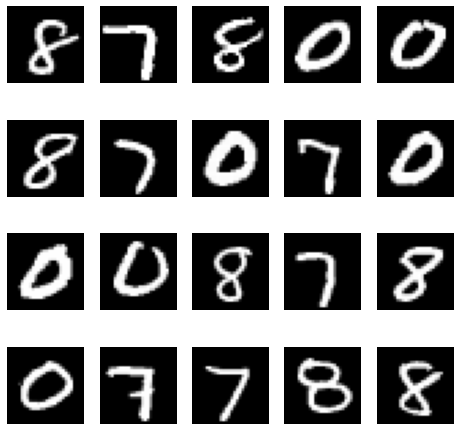

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[0], highest=False)

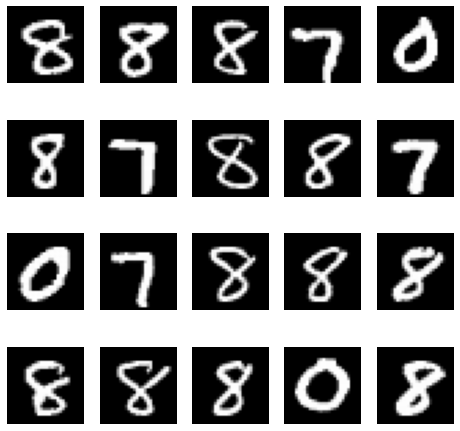

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[0], highest=False) # lowest epistemic

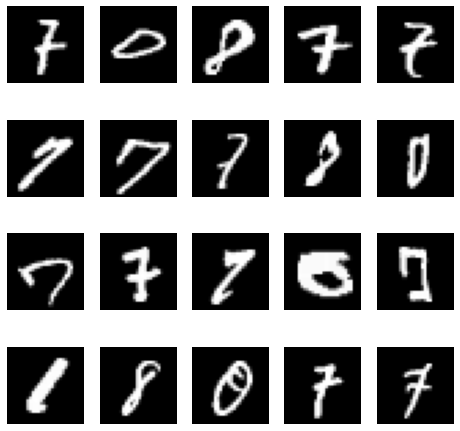

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[1])

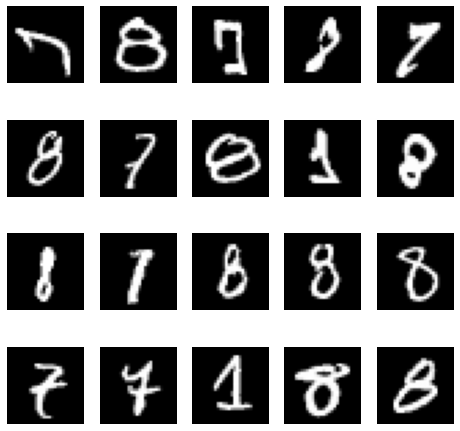

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[1])

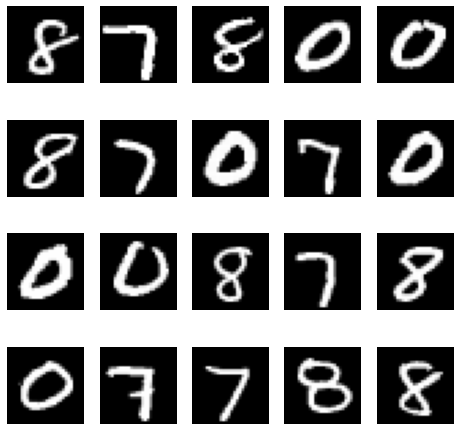

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[0], highest=False)

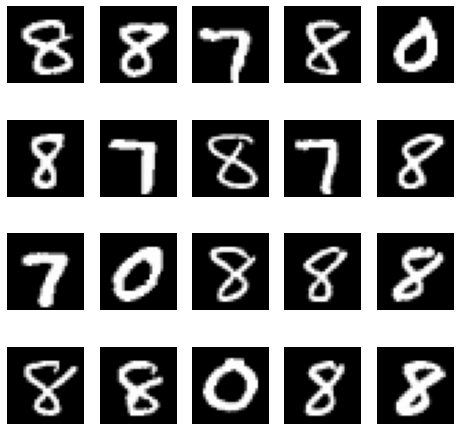

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[1], highest=False) # lowest epistemic

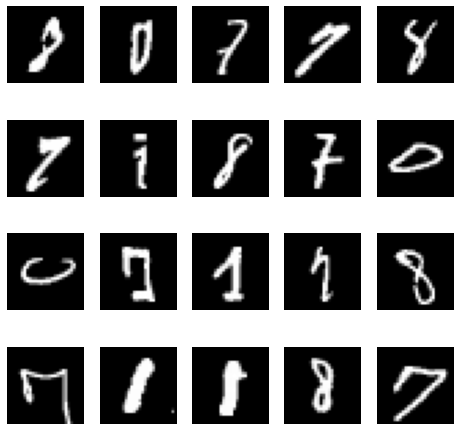

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[2])

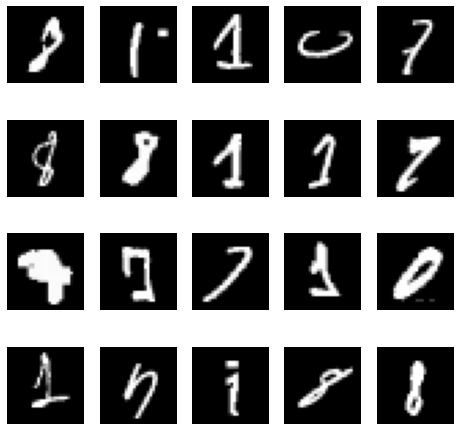

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[2]) # highest epistemic

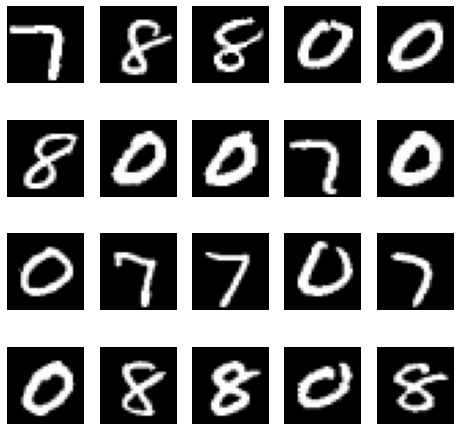

In [ ]:
show_epistemic_summary(mc_cnn_epistemic[2], highest=False)

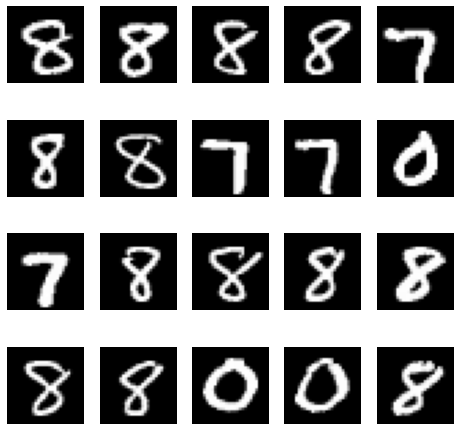

In [ ]:
show_epistemic_summary(mc_total_cnn_epistemic[2], highest=False) # lowest epistemic

## images with highest/lowest aleatoric uncertainties

In [ ]:
# function to plot n images with highest/lowest aleatoric uncertanty
def show_aleatoric_summary(sigmas, highest=True, n_alea=20,
                   x_data=X_mnist_test):
  fig, axs = plt.subplots(4, 5, figsize=(8,8)) 
  if highest == True:
    alea_idx = sigmas.argsort()[::-1]
  if highest == False:
    alea_idx = sigmas.argsort()
  
  for idx, ax in zip(alea_idx[:n_alea], axs.reshape(-1)):
    ax.imshow(x_data[idx, :, :, 0], cmap='gist_gray')
    ax.axis('off')
  #fig.suptitle("Main Title")
  plt.show()

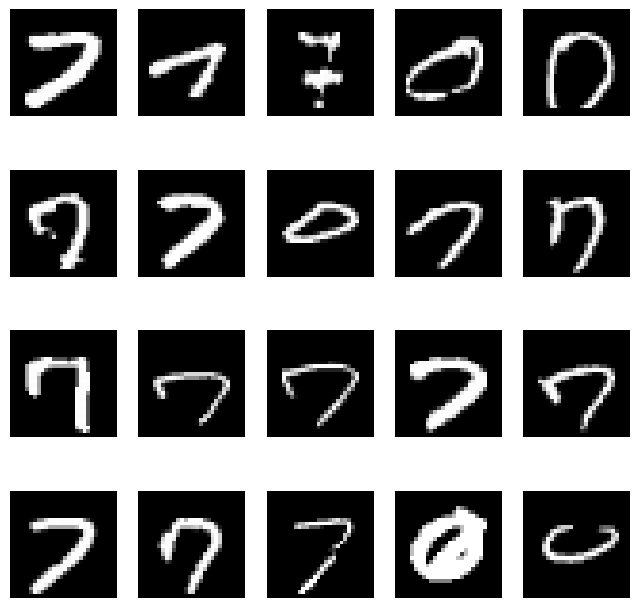

In [ ]:
show_aleatoric_summary(sigmas_alea_cnn)

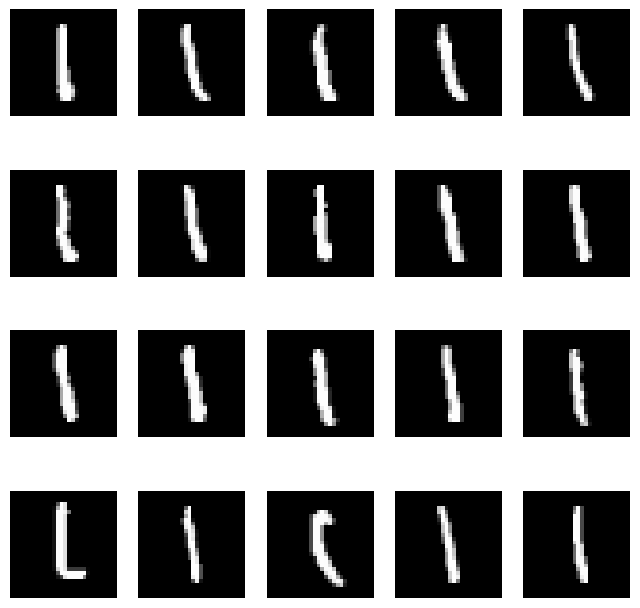

In [ ]:
show_aleatoric_summary(sigmas_alea_cnn, highest=False)

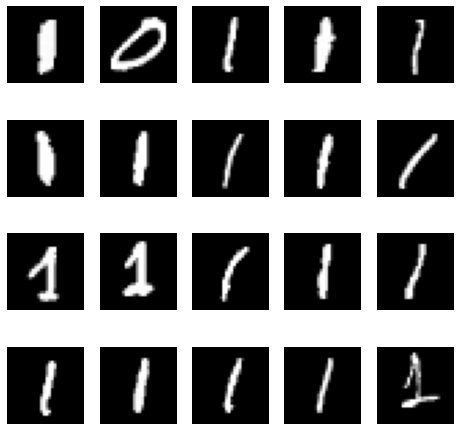

In [ ]:
show_aleatoric_summary(sigmas_alea_total_cnn)

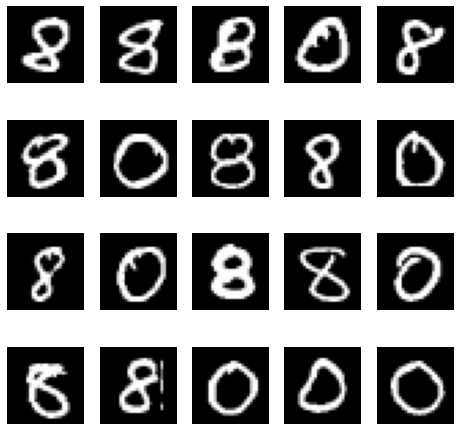

In [ ]:
show_aleatoric_summary(sigmas_alea_total_cnn, highest=False)

##### investigating where aleatoric uncertainties come from


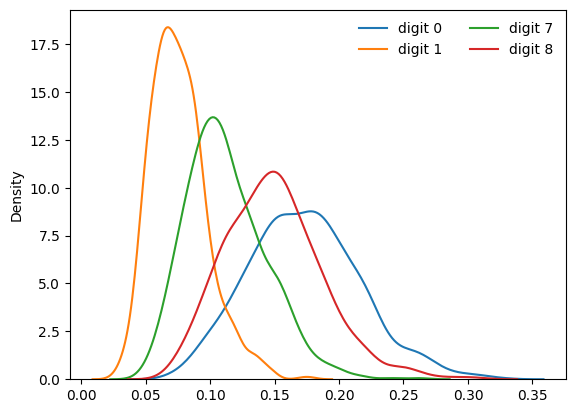

In [ ]:
# this is how the intensities of the pixels are distributed
mean_intensity = np.mean(X_mnist_test_original,axis=1)
fig, ax = plt.subplots()
for i in [0,1,7,8]:
  sns.kdeplot(mean_intensity[y_mnist_test_original==i],
              label="digit "+str(i))
ax.legend(frameon=False, ncol=2) 
plt.show()

Digits 0 and 8 have on average higher mean pixel intensities, whereas digit intensity is smaller for 1 and 7. 

In [ ]:
q3, q1 = np.percentile(mean_intensity[y_mnist_test_original==1], [5, 95])

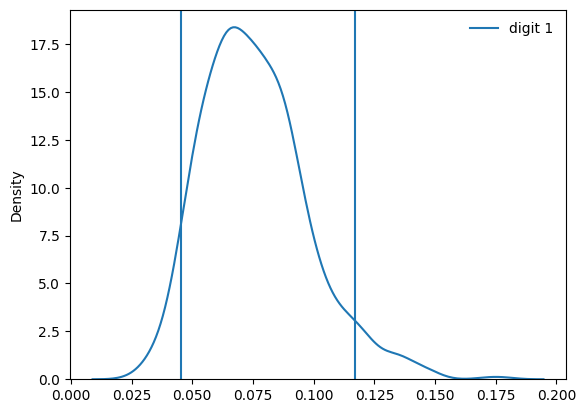

In [ ]:
mean_intensity = np.mean(X_mnist_test_original,axis=1)
fig, ax = plt.subplots()
for i in [1]:
  sns.kdeplot(mean_intensity[y_mnist_test_original==i],
              label="digit "+str(i))
  #conf = mean_confidence_interval(mean_intensity[y_mnist_test_original==i],
   #                               confidence=0.99)
  conf = np.percentile(mean_intensity[y_mnist_test_original==i], [5, 95])
  ax.axvline(conf[0])
  ax.axvline(conf[1])
ax.legend(frameon=False, ncol=2) 
plt.show()

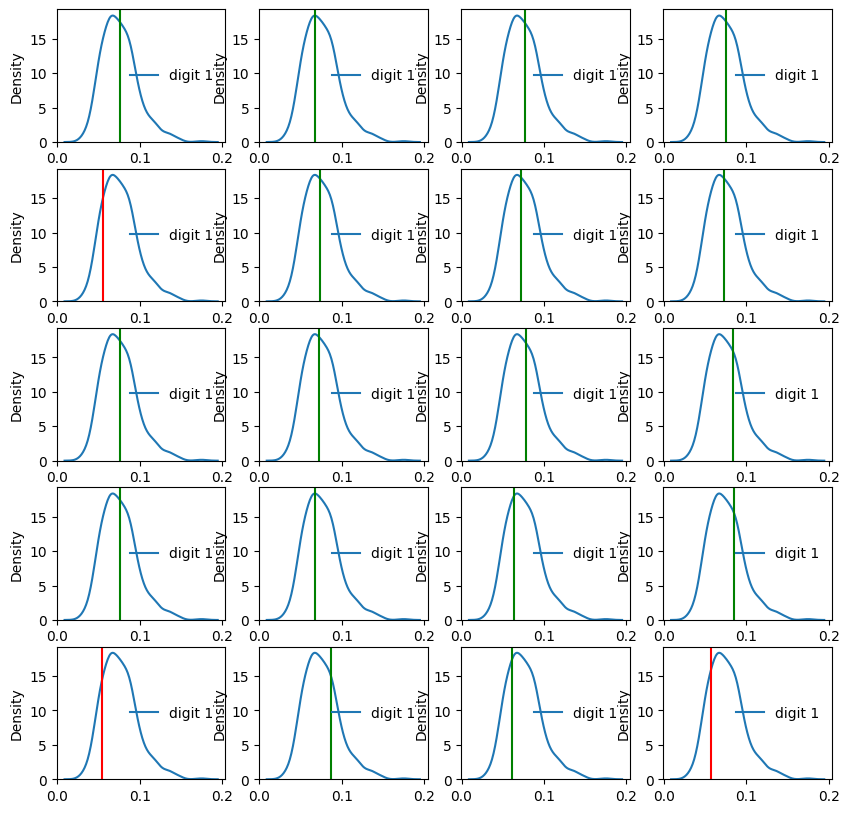

17 in CI
0.85 % in CI


In [ ]:
# get the mean intensities for digits with high aleatoric uncertainty
n = 20
alea_idx = sigmas_alea_cnn.argsort()#[::-1]
#alea_idx = sigmas_alea_total_cnn.argsort()#[::-1]
alea_idx_selected = alea_idx[:n]
mean_intensity = np.mean(X_mnist_test_original,axis=1)

in_ci = 0
fig, axs = plt.subplots(5,4, figsize=(10,10))
for idx, ax in zip(alea_idx_selected, axs.reshape(-1)):
  true_class = y_mnist_test_original.iloc[idx]
  sns.kdeplot(mean_intensity[y_mnist_test_original==true_class],
                label="digit "+str(true_class), ax=ax)
  ax.legend(frameon=False, ncol=2) 

  means_class = mean_intensity[y_mnist_test_original==true_class]
  conf = np.percentile(means_class, [25, 75])
  ci = [round(conf[0], 3), 
        round(conf[1], 3)]
  if ci[0] <= np.mean(X_mnist_test_original.iloc[idx]) <= ci[1]:
    ax.axvline(np.mean(X_mnist_test_original.iloc[idx]), color="green")
    in_ci = in_ci +1
  else:
    ax.axvline(np.mean(X_mnist_test_original.iloc[idx]), color="red")
  ax.set_xlabel("")
plt.show()
print(in_ci, "in CI")
print(in_ci/n, "% in CI")

Consider distribution of the pixel intensity for each digits. 

With **model 2**, the samples with lowest aleatoric features all 100% have mean intensity between 5th and 95th percentile, whereas for samples with highest aleatoric uncertainty, the mean pixel intensity lies outside 5th and 95th percentile 40% of the time, and 75% of the time outside the range between 25th and 75th quantile. Lowest aleatoric uncertainties: 85% inside 25th and 75th quantile, 100% inside 5th and 95th percentile

For **model 3**,  25% of the time outside the 5th and 95th percentile, and 60% of the time outside the 25th and 75th percentile. For the lowest aleatoric, 95% lie in 5th and 95th percentile and 60% inside 25th and 75th quantile. Lowest uncertainties, the other way round: 60% lie inside 25th and 75th percentile and 95% 5th and 95th percentile

## check if epistemic decreases with more data

function to calculate epistemic uncertainties for different training sizes

In [ ]:
def check_epistemic(X_train, y_train, X_test, y_test, sample_sizes, model, 
                    random_state=10):
  # for loop to calculate epistemic uncertainties for different sample sizes
  epi_list = []
  epi_mean_list = []

  for sample_size in sample_sizes:
      # create differnt training sizes
      (X_train_helper, _, 
      y_train_helper, _) = train_test_split(X_train, 
                                            y_train,
                                            test_size=1-sample_size,
                                            random_state=random_state)
      
      mc_model_cnn_helper = model_creator(act="relu", dropout_prob=0.25,
                             learning_rate=0.01)
      
      mc_history_cnn_helper = mc_model_cnn_helper.fit(X_train_helper, y_train_helper, 
                                    validation_data=(X_test, y_test), 
                                    batch_size=256, epochs=20,
                                    verbose=0)
      
      # calculate epistemic uncertainties
      mc_predictions_helper = make_predictions(mc_model_cnn_helper)
      _, _, mc_epistemic_helper = cal_epistemic(mc_predictions_helper)
      epi_list.append(mc_epistemic_helper)
      epi_mean_list.append(np.mean(mc_epistemic_helper, axis=1))

  # repeat for the original model as well (i.e. with full training set)
  mc_predictions_helper = make_predictions(model)
  _, _, mc_epistemic_helper = cal_epistemic(mc_predictions_helper)
  epi_list.append(mc_epistemic_helper)
  epi_mean_list.append(np.mean(mc_epistemic_helper, axis=1))

  return epi_list, epi_mean_list

Try sample sizes ```sample_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]``` with ```random_state=5```

In [ ]:
num_classes = 4
input_shape = (28, 28, 1)
sample_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]

epi_list, epi_mean_list = check_epistemic(X_train=X_mnist_train, y_train=y_mnist_train, 
                          X_test=X_mnist_test, y_test=y_mnist_test, 
                          sample_sizes=sample_sizes, model=mc_model_cnn,
                          random_state=5)

100%|██████████| 100/100 [00:27<00:00,  3.59it/s]


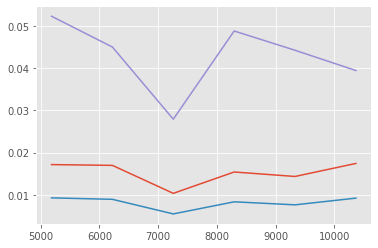

In [ ]:
x_samples = [i * X_mnist_train.shape[0] for i in sample_sizes] 
x_samples.append(X_mnist_train.shape[0])
for i in range(len(epi_mean_list[0])):
  y_epi = [epi[i] for epi in epi_mean_list]
  plt.plot(x_samples, y_epi)

Try sample sizes ```sample_sizes = [0.25, 0.5, 0.75]``` with ```random_state=301```

100%|██████████| 100/100 [00:26<00:00,  3.77it/s]


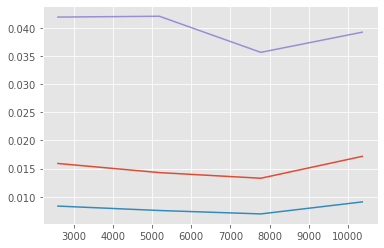

In [ ]:
num_classes = 4
input_shape = (28, 28, 1)
sample_sizes = [0.25, 0.5, 0.75]

epi_list, epi_mean_list = check_epistemic(X_train=X_mnist_train, y_train=y_mnist_train, 
                          X_test=X_mnist_test, y_test=y_mnist_test, 
                          sample_sizes=sample_sizes, model=mc_model_cnn,
                          random_state=301)

x_samples = [i * X_mnist_train.shape[0] for i in sample_sizes] 
x_samples.append(X_mnist_train.shape[0])
for i in range(len(epi_mean_list[0])):
  y_epi = [epi[i] for epi in epi_mean_list]
  plt.plot(x_samples, y_epi)

Interesting to check the influence of the specific data sets used for training. I.e. how much of a difference it makes when changing the ```random_state``` in ```train_test_split```

random state is 4101


100%|██████████| 100/100 [00:27<00:00,  3.60it/s]


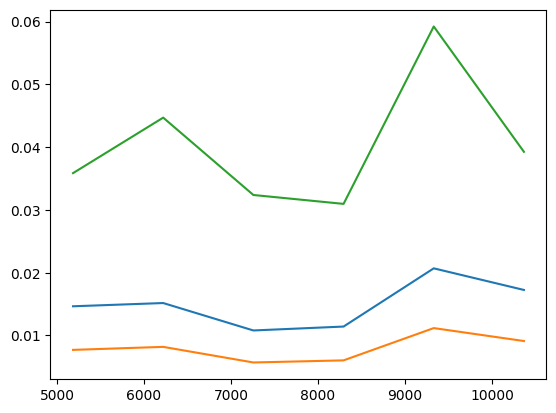

random state is 864


100%|██████████| 100/100 [00:28<00:00,  3.53it/s]


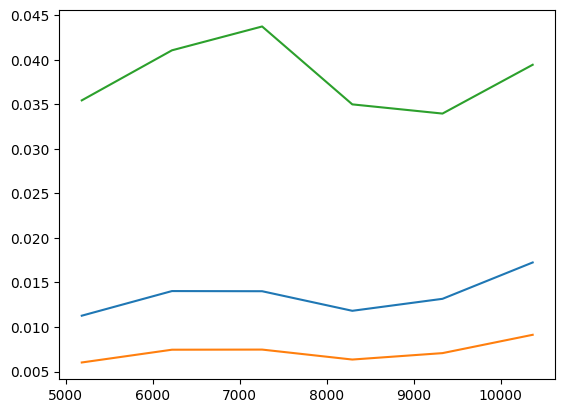

random state is 9362


100%|██████████| 100/100 [00:28<00:00,  3.51it/s]


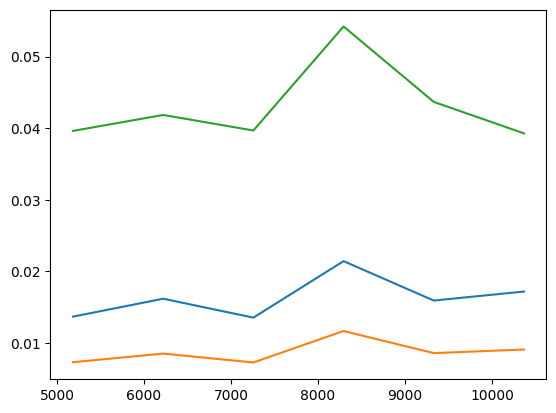

random state is 758


100%|██████████| 100/100 [00:27<00:00,  3.60it/s]


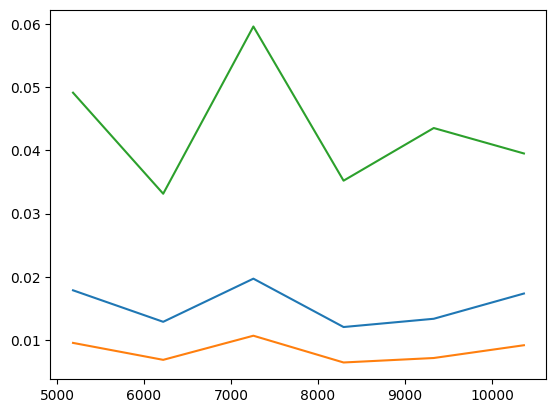

random state is 8179


100%|██████████| 100/100 [00:28<00:00,  3.57it/s]


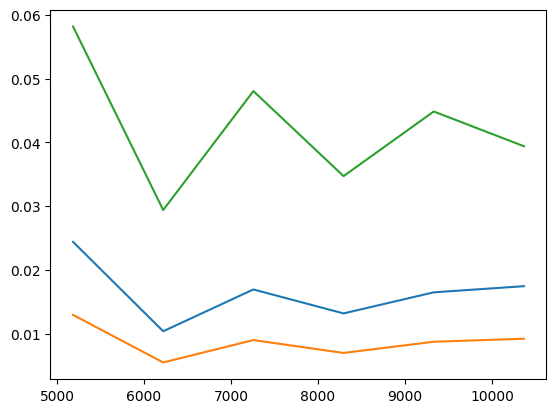

random state is 2351


100%|██████████| 100/100 [00:27<00:00,  3.69it/s]


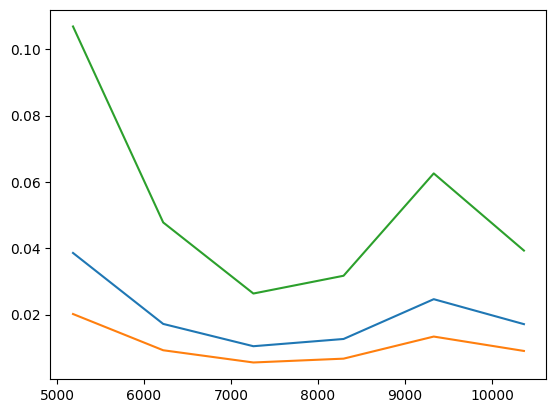

random state is 481


100%|██████████| 100/100 [00:28<00:00,  3.56it/s]


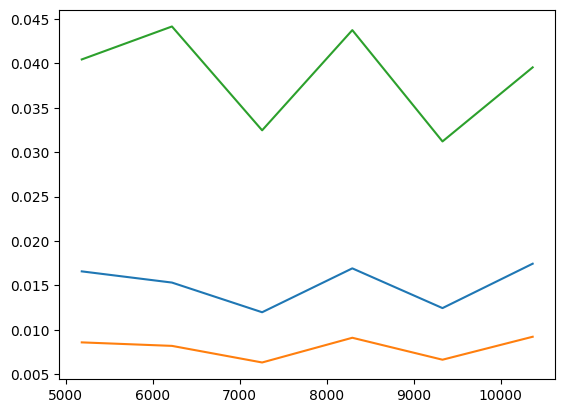

random state is 5686


100%|██████████| 100/100 [00:27<00:00,  3.59it/s]


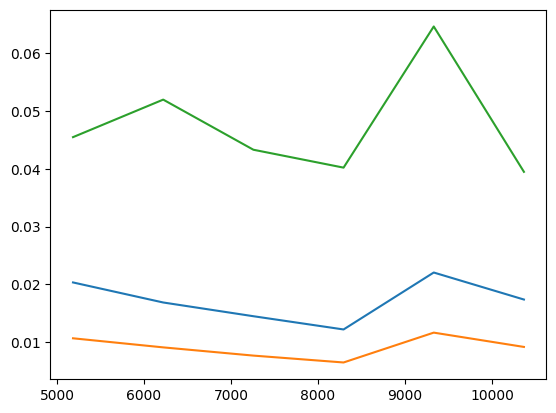

random state is 9754


100%|██████████| 100/100 [00:27<00:00,  3.63it/s]


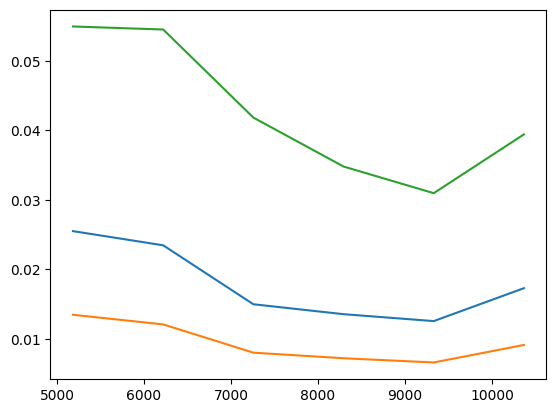

random state is 8013


100%|██████████| 100/100 [00:26<00:00,  3.74it/s]


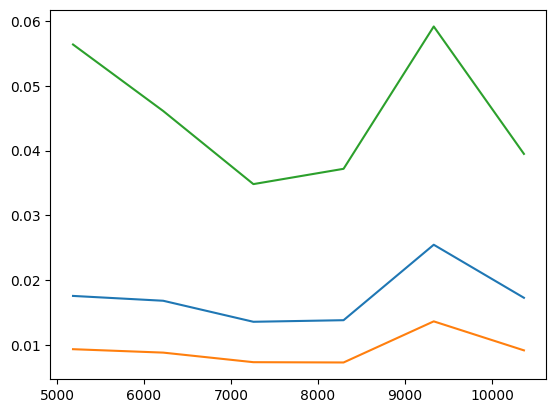

In [ ]:
"""import random
num_classes = 4
input_shape = (28, 28, 1)
sample_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]

for _ in range(10): 
  random_state = random.randint(1,1e4)
  print(f"random state is {random_state}")
  epi_list, epi_mean_list = check_epistemic(X_train=X_mnist_train, y_train=y_mnist_train, 
                            X_test=X_mnist_test, y_test=y_mnist_test, 
                            sample_sizes=sample_sizes, model=mc_model_cnn, 
                            random_state=random_state)

  x_samples = [i * X_mnist_train.shape[0] for i in sample_sizes] 
  x_samples.append(X_mnist_train.shape[0])
  for i in range(len(epi_mean_list[0])):
    y_epi = [epi[i] for epi in epi_mean_list]
    plt.plot(x_samples, y_epi)
  plt.show()"""

Summary of the above results: whether epistemic uncertainty decreases with an increase in training data, is highly dependent on the which data are present in the smallest training data set, and which data points are then added to increase training set size. 


With ```random state 301```, for instance, we observe a bahaviour as described by Yarin Gal. With ```random state 7888``` or ```random state is 6238``` however, the epistemic uncertainty fluctuatates up and down or mainly increases, respectively. 

Another observation that can be made at this point: it does not seem to make a difference in terms of which calculation of epistemic uncertainty is used (max std, mean std, entropy). The uncertainty levels differ, however, seem to be highly correlated.

## check if aleatoric decreases with more data

In [ ]:
def check_aleatoric(X_train, y_train, X_test, y_test, sample_sizes, model, 
                    random_state=10):
  # for loop to calculate epistemic uncertainties for different sample sizes
  sigmas_list = []
  sigmas_mean_list = []

  num_classes = 4
  T = 30
  loss_fn = bayesian_categorical_crossentropy(T=T, num_classes=num_classes)

  for sample_size in sample_sizes:
      # create differnt training sizes
      (X_train_helper, _, 
      y_train_helper, _) = train_test_split(X_train, 
                                            y_train,
                                            test_size=1-sample_size,
                                            random_state=random_state)
      
      alea_model_cnn_helper = model_creator(act="relu", dropout_prob=0.0,
                                  learning_rate=0.01,
                                  include_logvar=True, loss=loss_fn)
      alea_cnn_history_helper = alea_model_cnn_helper.fit(X_train_helper, y_train_helper, 
                                  validation_data=(X_test, y_test),
                                  batch_size=256, epochs=20, verbose=0)
      
      # calculate aleatoric uncertainties
      _, sigmas_alea_cnn_helper = cal_aleatoric(alea_model_cnn_helper)
      sigmas_list.append(sigmas_alea_cnn_helper)
      sigmas_mean_list.append(np.mean(sigmas_alea_cnn_helper))

  # repeat for the original model as well (i.e. with full training set)
  _, sigmas_alea_cnn_helper = cal_aleatoric(model)
  sigmas_list.append(sigmas_alea_cnn_helper)
  sigmas_mean_list.append(np.mean(sigmas_alea_cnn_helper))

  return sigmas_list, sigmas_mean_list

In [ ]:
num_classes = 4
input_shape = (28, 28, 1)
sample_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]

sigmas_list, sigmas_mean_list = check_aleatoric(X_train=X_mnist_train, y_train=y_mnist_train, 
                          X_test=X_mnist_test, y_test=y_mnist_test, 
                          sample_sizes=sample_sizes, model=alea_model_cnn,
                          random_state=5)

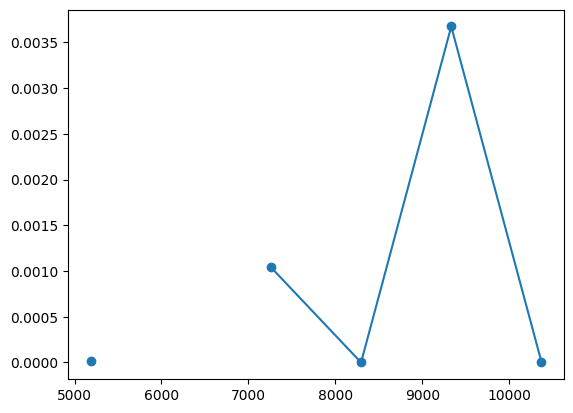

In [ ]:
x_samples = [i * X_mnist_train.shape[0] for i in sample_sizes] 
x_samples.append(X_mnist_train.shape[0])
plt.plot(x_samples, sigmas_mean_list)
plt.scatter(x_samples, sigmas_mean_list)

random state is 1079


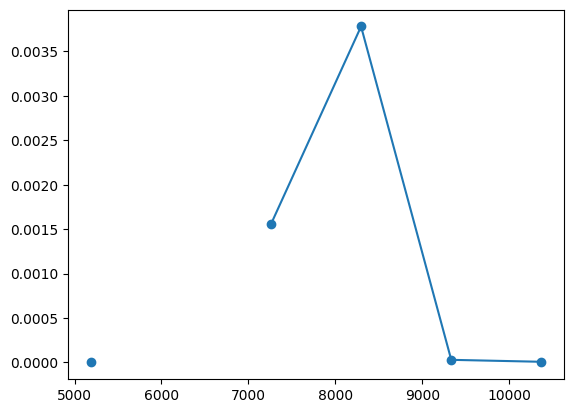

random state is 45


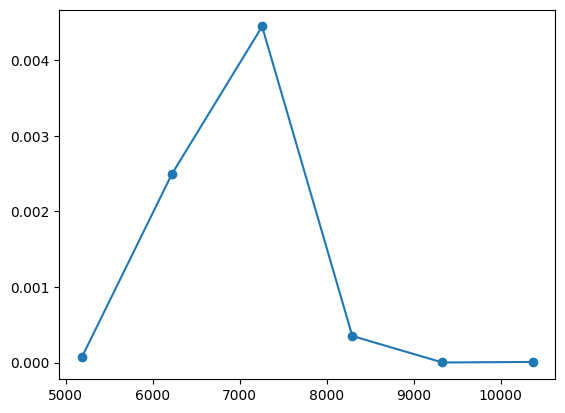

random state is 4072


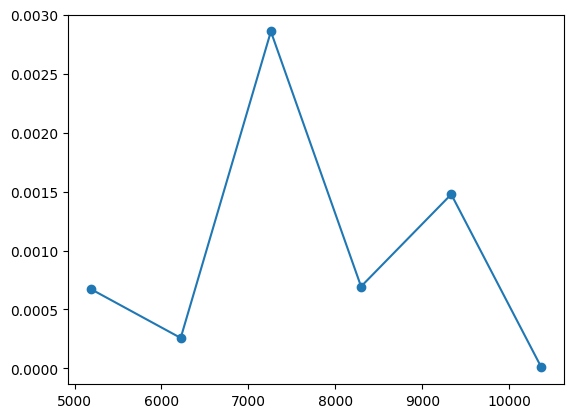

random state is 5421


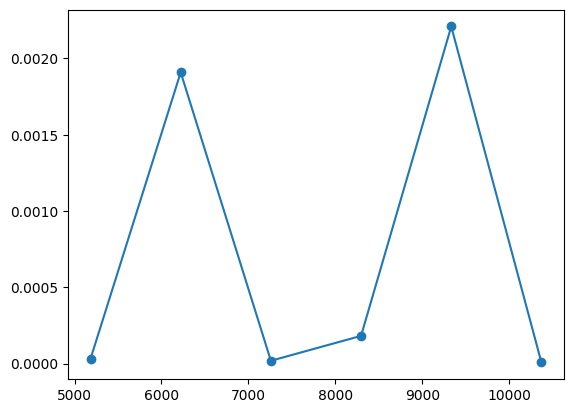

random state is 3591


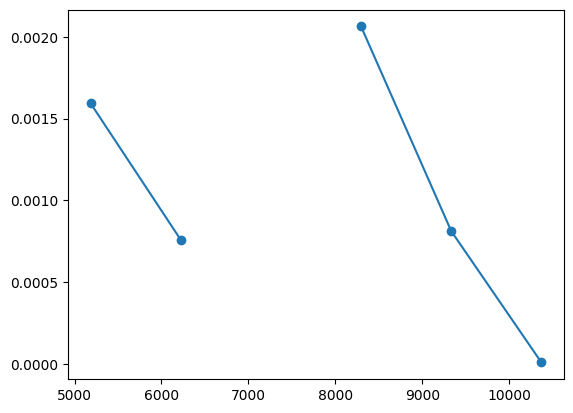

In [ ]:
num_classes = 4
input_shape = (28, 28, 1)
sample_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]

for _ in range(5): 
  random_state = random.randint(1,1e4)
  print(f"random state is {random_state}")
  sigmas_list, sigmas_mean_list = check_aleatoric(X_train=X_mnist_train, y_train=y_mnist_train, 
                          X_test=X_mnist_test, y_test=y_mnist_test, 
                          sample_sizes=sample_sizes, model=alea_model_cnn,
                          random_state=random_state)

  x_samples = [i * X_mnist_train.shape[0] for i in sample_sizes] 
  x_samples.append(X_mnist_train.shape[0])
  plt.plot(x_samples, sigmas_mean_list)
  plt.scatter(x_samples, sigmas_mean_list)
  plt.show()

## effect on accuracy when deleting data points with highest uncertainties



In [ ]:
del_percentage = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
def check_acc(model, uncertainty, 
              del_percentage=del_percentage):
  accuracy_list = []
  loss_list = []
  sorted_uncertainty = uncertainty.argsort()[::-1]
  n = uncertainty.shape[0]
  for d in del_percentage:
      # drop the samples with highest uncertainty
      print(f"delete the {int(n*d)} highest uncertainties")
      drop_highest = sorted_uncertainty[int(n*d):]
      loss, accuracy = model.evaluate(X_mnist_test[drop_highest], 
                                      y_mnist_test[drop_highest], 
                                      verbose=0)
      print(f"Eval loss = {loss}, Eval accuracy = {accuracy}")
      loss_list.append(loss)
      accuracy_list.append(accuracy)
  return loss_list, accuracy_list

In [ ]:
loss_list_total_mc_cnn, accuracy_list_total_mc_cnn = check_acc(model=total_mc_cnn_model, 
                                                               uncertainty=mc_total_cnn_epistemic[2])

delete the 34 highest uncertainties
Eval loss = 0.08275949209928513, Eval accuracy = 0.995616614818573
delete the 172 highest uncertainties
Eval loss = 0.0703909620642662, Eval accuracy = 0.9996954798698425
delete the 345 highest uncertainties
Eval loss = 0.06861088424921036, Eval accuracy = 1.0
delete the 518 highest uncertainties
Eval loss = 0.06780209392309189, Eval accuracy = 0.9996596574783325
delete the 691 highest uncertainties
Eval loss = 0.0670362338423729, Eval accuracy = 1.0
delete the 864 highest uncertainties
Eval loss = 0.06682799011468887, Eval accuracy = 1.0
delete the 1036 highest uncertainties
Eval loss = 0.06656371802091599, Eval accuracy = 1.0
delete the 1209 highest uncertainties
Eval loss = 0.0661889836192131, Eval accuracy = 1.0
delete the 1382 highest uncertainties
Eval loss = 0.06588732451200485, Eval accuracy = 1.0
delete the 1555 highest uncertainties
Eval loss = 0.06587449461221695, Eval accuracy = 1.0
delete the 1728 highest uncertainties
Eval loss = 0.0656

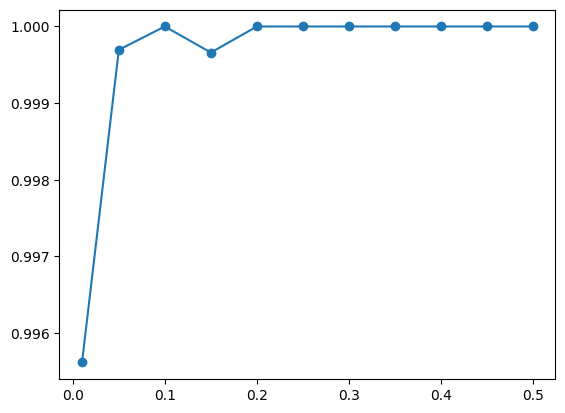

In [ ]:
plt.plot(del_percentage, accuracy_list_total_mc_cnn)
plt.scatter(del_percentage, accuracy_list_total_mc_cnn)

In [ ]:
loss_list_total_mc_cnn_alea, accuracy_list_total_mc_cnn_alea = check_acc(model=total_mc_cnn_model, 
                                                               uncertainty=sigmas_alea_total_cnn)

delete the 34 highest uncertainties
Eval loss = 0.09173546731472015, Eval accuracy = 0.9918176531791687
delete the 172 highest uncertainties
Eval loss = 0.08794256299734116, Eval accuracy = 0.9923873543739319
delete the 345 highest uncertainties
Eval loss = 0.08564670383930206, Eval accuracy = 0.994535505771637
delete the 518 highest uncertainties
Eval loss = 0.090915247797966, Eval accuracy = 0.9925119280815125
delete the 691 highest uncertainties
Eval loss = 0.08705388754606247, Eval accuracy = 0.9916817545890808
delete the 864 highest uncertainties
Eval loss = 0.08563613891601562, Eval accuracy = 0.9922839403152466
delete the 1036 highest uncertainties
Eval loss = 0.07758715748786926, Eval accuracy = 0.9958677887916565
delete the 1209 highest uncertainties
Eval loss = 0.08114414662122726, Eval accuracy = 0.9951046109199524
delete the 1382 highest uncertainties
Eval loss = 0.07646642625331879, Eval accuracy = 0.9961427450180054
delete the 1555 highest uncertainties
Eval loss = 0.0741

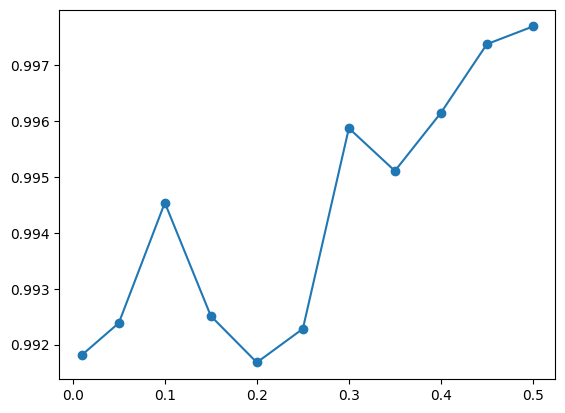

In [ ]:
plt.plot(del_percentage, accuracy_list_total_mc_cnn_alea)
plt.scatter(del_percentage, accuracy_list_total_mc_cnn_alea)

<a name="cell-id"></a>
## TSNE

In [ ]:
# need original format of data
(df_mnist, _, _,
            X_mnist_test_original, _,
            _, _,
            _, _) = get_mnist_data()

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
clf_val = LocalOutlierFactor(n_neighbors=2)
result_2_val = clf_val.fit_predict(X_mnist_test_original)

clf_val_3 = LocalOutlierFactor(n_neighbors=3)
result_3_val = clf_val_3.fit_predict(X_mnist_test_original)

clf_val_10 = LocalOutlierFactor(n_neighbors=10)
result_10_val = clf_val_10.fit_predict(X_mnist_test_original)

clf_val_cont = LocalOutlierFactor(contamination=0.001428)
result_cont_val = clf_val_cont.fit_predict(X_mnist_test_original)

In [ ]:
outlier_index_val = np.where(result_2_val == -1)
X_scores_val = clf_val.negative_outlier_factor_
print(len(outlier_index_val[0]))

outlier_index_val_3 = np.where(result_3_val == -1)
X_scores_val_3 = clf_val_3.negative_outlier_factor_
print(len(outlier_index_val_3[0]))

outlier_index_val_10 = np.where(result_10_val == -1)
X_scores_val_10 = clf_val_10.negative_outlier_factor_
print(len(outlier_index_val_10[0]))

outlier_index_val_cont = np.where(result_cont_val == -1)
X_scores_val_cont = clf_val_cont.negative_outlier_factor_
print(len(outlier_index_val_cont[0]))

95
81
72
5


In [ ]:
from sklearn.manifold import TSNE
X_mnist_embedded = TSNE(n_components=2, perplexity=50).fit_transform(X_mnist_test_original)

In [ ]:
n = 200
# uncertainty_all = mc_cnn_epistemic[2].argsort()[::-1]
uncertainty_all = sigmas_alea_total_cnn.argsort()[::-1]
uncertainty = uncertainty_all[:n]

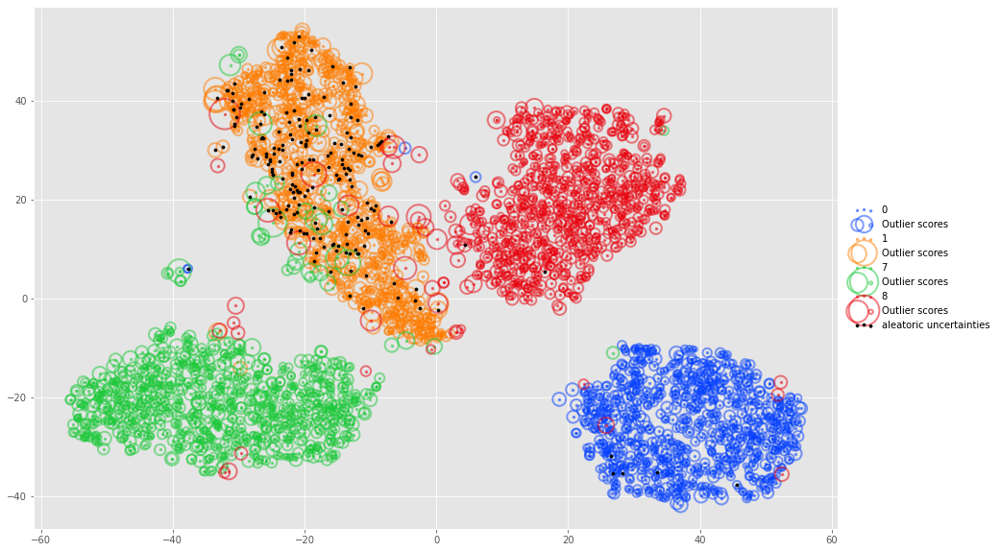

In [ ]:
fig, ax = plt.subplots(figsize=(15,10));
scatter_2d_label_LOF(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty=uncertainty,ax=ax,
                     descr="aleatoric uncertainties")


### epistemic

highest epistemic uncertainties using model 1

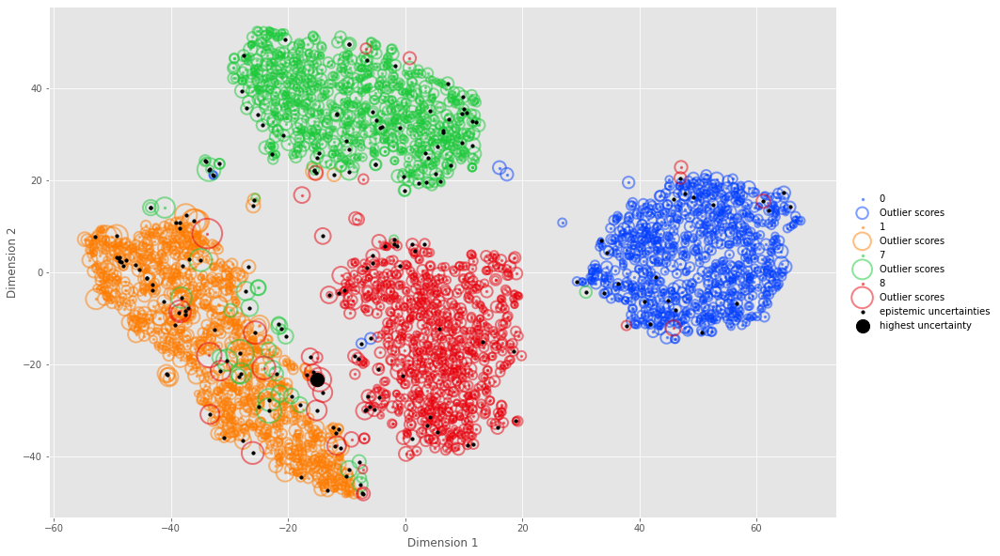

In [ ]:
# new
epi_idx_total = mc_cnn_epistemic[2].argsort()[::-1]
uncertainty = epi_idx_total[:200]
selected_uncertainty = epi_idx_total[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="epistemic uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
#fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_epistemic.pdf', 
#            transparent=True, bbox_inches='tight')

plt.show()#

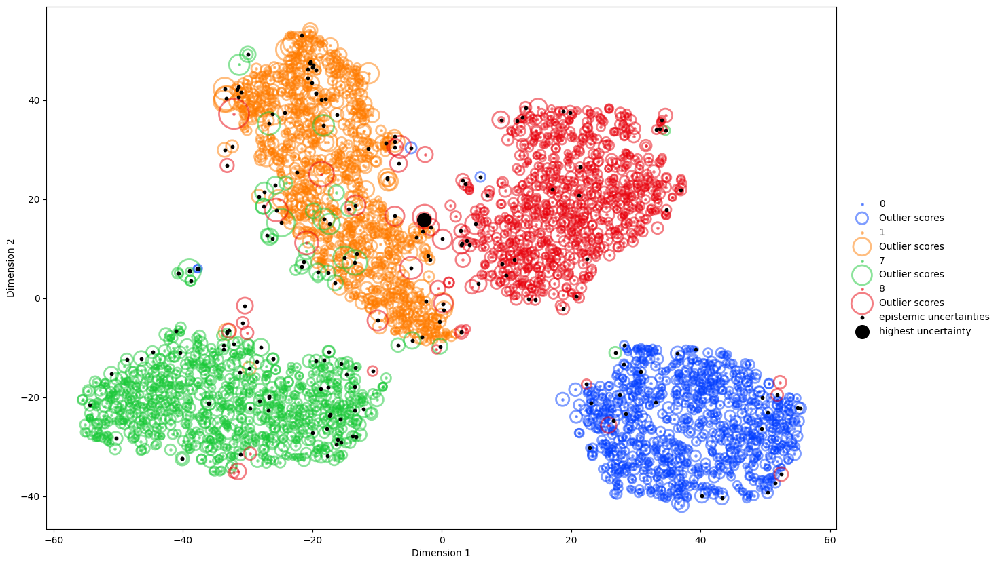

In [ ]:
epi_idx_total = mc_cnn_epistemic[2].argsort()[::-1]
uncertainty = epi_idx_total[:200]
selected_uncertainty = epi_idx_total[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="epistemic uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
#fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_epistemic.pdf', 
#            transparent=True, bbox_inches='tight')

plt.show()#

highest epistemic uncertainties using model 3

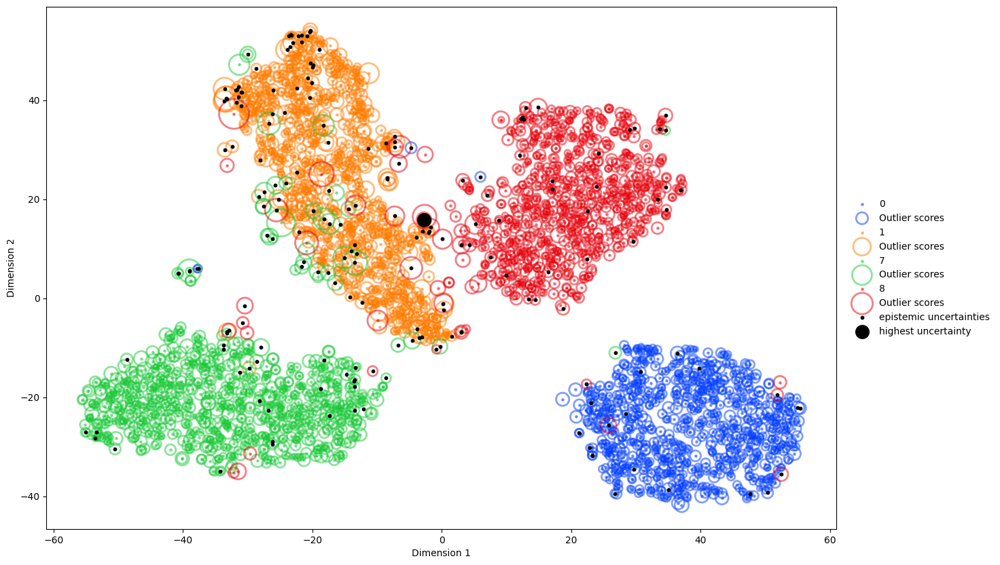

In [ ]:
epi_idx_total = mc_total_cnn_epistemic[2].argsort()[::-1]
uncertainty = epi_idx_total[:200]
selected_uncertainty = epi_idx_total[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="epistemic uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_epistemic.pdf', 
            transparent=True, bbox_inches='tight')

plt.show()

lowest epistemic uncertainties using model 1

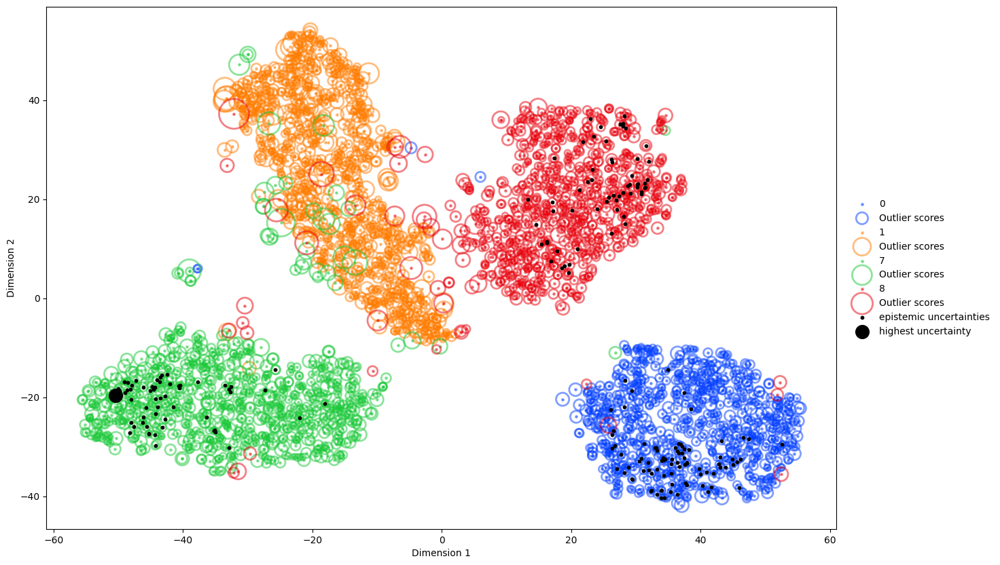

In [ ]:
epi_idx_total = mc_cnn_epistemic[2].argsort()
uncertainty = epi_idx_total[:200]
selected_uncertainty = epi_idx_total[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="epistemic uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
#fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_epistemic_lowest.pdf', 
#            transparent=True, bbox_inches='tight')

plt.show()

lowest epistemic uncertainties using model 3

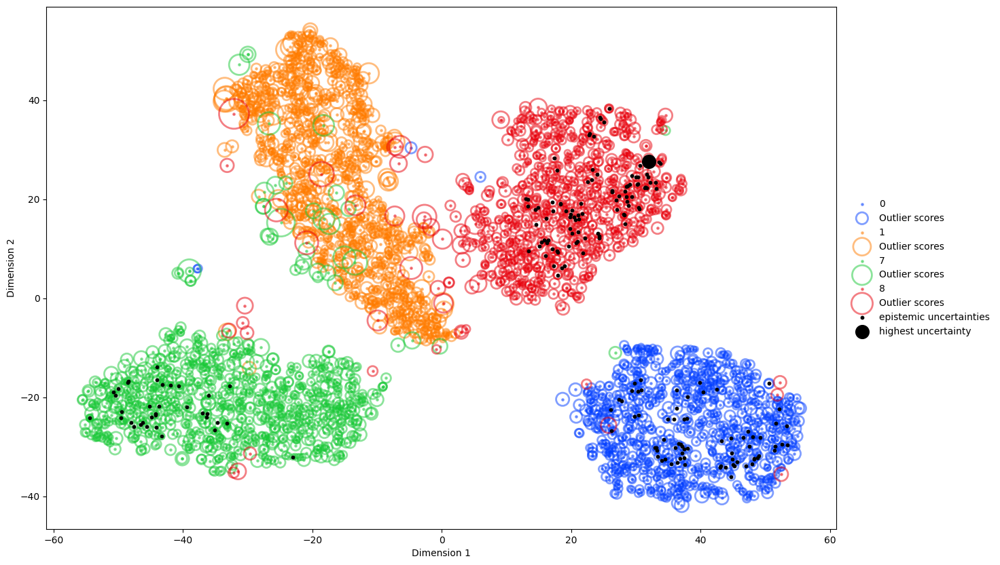

In [ ]:
epi_idx_total = mc_total_cnn_epistemic[2].argsort()
uncertainty = epi_idx_total[:200]
selected_uncertainty = epi_idx_total[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="epistemic uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_epistemic_lowest.pdf', 
            transparent=True, bbox_inches='tight')

plt.show()

### aleatoric

highest aleatoric uncertainties using model 2

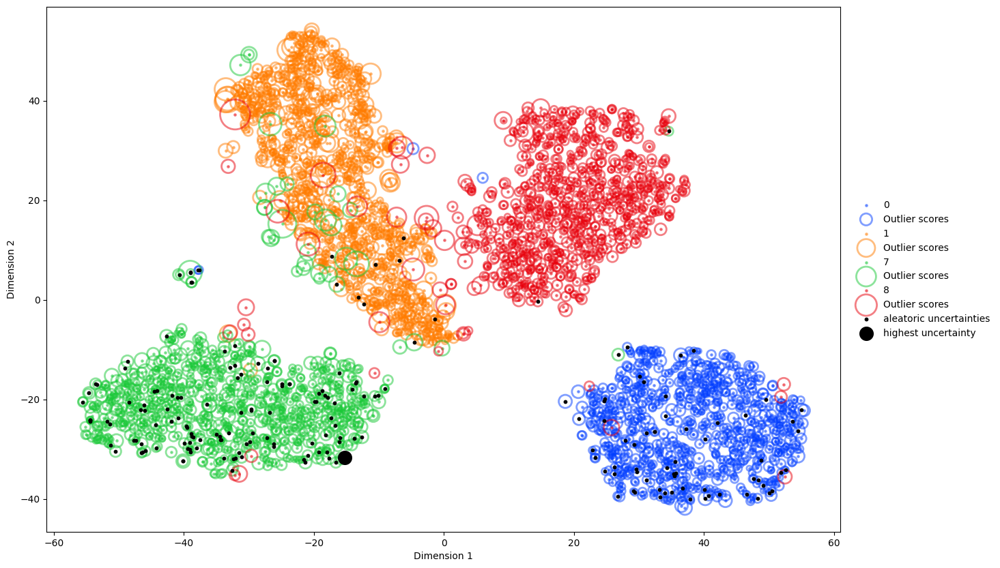

In [ ]:
n = 200
uncertainty_all = sigmas_alea_cnn.argsort()[::-1]
uncertainty = uncertainty_all[:n]
selected_uncertainty = uncertainty_all[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="aleatoric uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
#fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_aleatoric.pdf', 
#            transparent=True, bbox_inches='tight')

plt.show()

highest aleatoric uncertainties using model 3

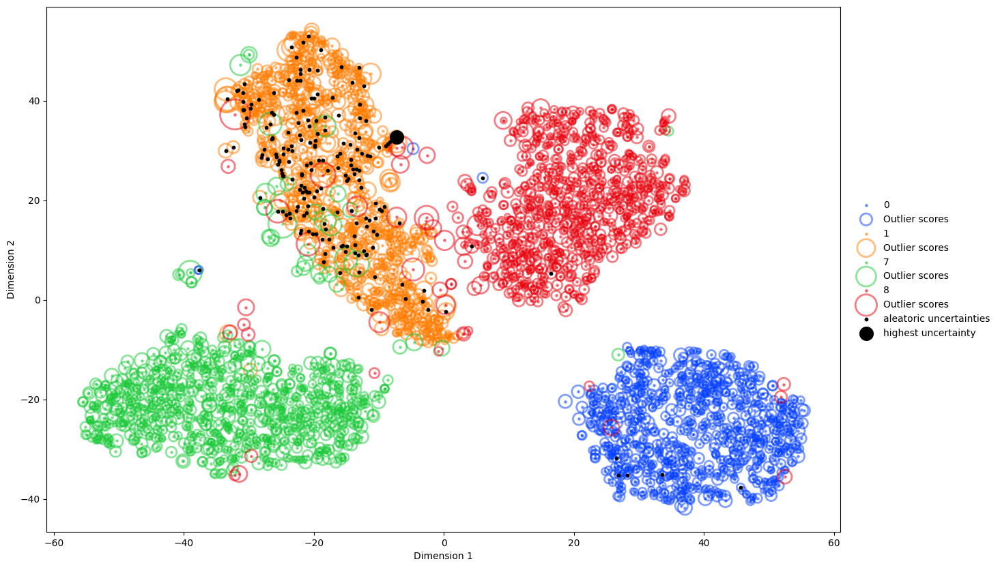

In [ ]:
n = 200
uncertainty_all = sigmas_alea_total_cnn.argsort()[::-1]
uncertainty = uncertainty_all[:n]
selected_uncertainty = uncertainty_all[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="aleatoric uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_aleatoric.pdf', 
            transparent=True, bbox_inches='tight')

plt.show()

lowest aleatoric uncertainties using model 2

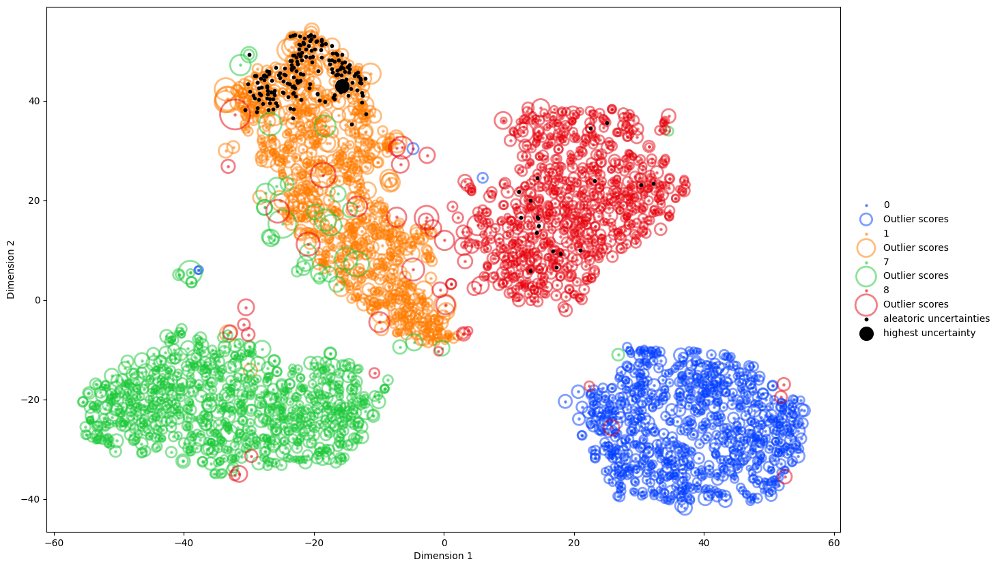

In [ ]:
n = 200
uncertainty_all = sigmas_alea_cnn.argsort()
uncertainty = uncertainty_all[:n]
selected_uncertainty = uncertainty_all[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="aleatoric uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
#fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_aleatoric_lowest.pdf', 
#            transparent=True, bbox_inches='tight')

plt.show()

lowest aleatoric uncertainties using model 3

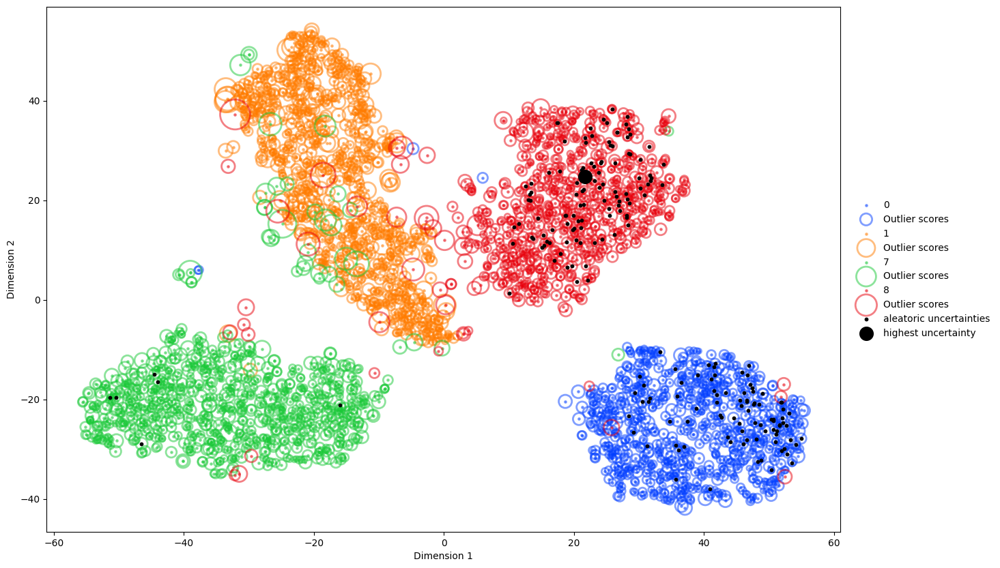

In [ ]:
n = 200
uncertainty_all = sigmas_alea_total_cnn.argsort()
uncertainty = uncertainty_all[:n]
selected_uncertainty = uncertainty_all[0]

fig, ax = plt.subplots(figsize=(15,10));
plt.style.use('default')
scatter_2d_label_LOF_with_highest(X_mnist_embedded, y_mnist_test_original.to_numpy(),
                     X_scores_val_3, uncertainty, selected_uncertainty,
                     descr="aleatoric uncertainties",descr_2="highest uncertainty",
                     ax=ax, s=2, alpha=0.5, lw=2)
fig.savefig('/content/drive/MyDrive/Colab Notebooks/project1_anomalydetection/FINAL_plots/TSNE_aleatoric_lowest.pdf', 
            transparent=True, bbox_inches='tight')

plt.show()